##Chapter 1: Embracing Green, Digital, or Both? A Patent-Based Landscape of Twin Transition Technologies


# Configuration of Google Collab and GPU

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!nvidia-smi

Sun Jun 22 17:45:10 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

In [ ]:
def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)

In [ ]:
import tensorflow as tf
print("GPU Available:", tf.test.is_gpu_available())

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


GPU Available: True


# Package installation

In [ ]:
# Install compatible NumPy version (pin first to avoid conflicts)
!pip install numpy==1.26.4

# Uninstall broken/corrupted SciPy and reinstall a stable version
!pip uninstall -y scipy
!pip install scipy==1.11.4

# Install gensim and hdbscan
!pip install gensim
!pip install hdbscan
!pip install umap-learn

Found existing installation: scipy 1.11.4
Uninstalling scipy-1.11.4:
  Successfully uninstalled scipy-1.11.4
  Using cached scipy-1.11.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
Using cached scipy-1.11.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (36.4 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.11.4 which is incompatible.


#reinstall kernel

In [ ]:
# Restart the runtime to apply changes
import os
os.kill(os.getpid(), 9)

#import libraries

In [ ]:
import numpy as np
import pandas as pd
import re
import glob
from gensim.models.phrases import Phrases

#Loading main data

##Green-Digital


In [ ]:
#datasets configuration directory
root_dir = "/content/drive/MyDrive/PhD_Mercedes/Results/"

In [ ]:
root_dir2 = "/content/drive/MyDrive/PhD_Mercedes/Results/GD/"

In [ ]:
#images configuration directory
images_dir = '/content/drive/MyDrive/PhD_Mercedes/Results/GD-D-G/images/'


In [ ]:
raw_data_GD = pd.read_csv(root_dir2+"green_digital_reduced_wipo_2025.csv",sep=',',encoding="latin-1")

In [ ]:
raw_data_GD

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length
0,58785336,The present invention discloses an unmanned ae...,en,2016,The present invention discloses an unmanned ae...,479
1,74869014,The present invention provides an accelerator ...,en,2019,The present invention provides an accelerator ...,257
2,54601667,A controlling method executes an auto-calculat...,en,2014,A controlling method executes an auto-calculat...,417
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,"In an embodiment, a computer-implemented metho...",62
4,68163332,Systems and methods that analyze blood-based c...,en,2018,Systems and methods that analyze blood-based c...,310
...,...,...,...,...,...,...
5545,38951298,The invention relates to a stand-alone shuttle...,en,2007,The invention relates to a stand-alone shuttle...,144
5546,40474199,The arrangement has an electric device (2) e.g...,en,2007,The arrangement has an electric device e.g. el...,79
5547,37875493,"A method of determining, for each of one or mo...",en,2006,"A method of determining, for each of one or mo...",255
5548,67438865,A method operates a technical or non-technical...,en,2019,A method operates a technical or non-technical...,147


##Digital

In [ ]:
#datasets configuration directory
root_dir = "/content/drive/MyDrive/PhD_Mercedes/Results/"

In [ ]:
root_dir2 = "/content/drive/MyDrive/PhD_Mercedes/Results/D/"

In [ ]:
#images configuration directory
images_dir = '/content/drive/MyDrive/PhD_Mercedes/Images'


In [ ]:
raw_data_D = pd.read_csv(root_dir2+"digital_reduced_wipo_2025.csv",sep=',',encoding="latin-1")

In [ ]:
raw_data_D

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length
0,54006212,2014,en,Systems and methods for positioning a cut guid...,Systems and methods for positioning a cut guid...,202
1,69190842,2019,en,"Method and system for automatically detecting,...","Method and system for automatically detecting,...",156
2,68470408,2018,en,A system includes circuitry for cryptographic ...,A system includes circuitry for cryptographic ...,115
3,65903982,2019,en,According to an example aspect of the present ...,According to an example aspect of the present ...,137
4,68240324,2019,en,A system for providing security functions to a...,A system for providing security functions to a...,93
...,...,...,...,...,...,...
5545,22996608,2001,en,A method for reducing the bandwidth required t...,A method for reducing the bandwidth required t...,118
5546,23981004,2000,en,A skateboard (10) is movable in response to us...,A skateboard is movable in response to user co...,109
5547,70166170,2019,en,A system and method for surfacing content rele...,A system and method for surfacing content rele...,96
5548,54347850,2014,en,Region of interest detection in raw time of fl...,Region of interest detection in raw time of fl...,128


##Green

In [ ]:
#datasets configuration directory
root_dir = "/content/drive/MyDrive/PhD_Mercedes/Results/"

In [ ]:
root_dir2 = "/content/drive/MyDrive/PhD_Mercedes/Results/G/"

In [ ]:
#images configuration directory
images_dir = '/content/drive/MyDrive/PhD_Mercedes/Images'


In [ ]:
raw_data_G = pd.read_csv(root_dir2+"green_reduced_wipo_2025.csv",sep=',',encoding="latin-1")

In [ ]:
raw_data_G

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length
0,42732849,2010,en,The invention relates to a novel interconnecto...,The invention relates to a novel interconnecto...,111
1,43027483,2010,en,The invention relates in particular to a tank ...,The invention relates in particular to a tank ...,137
2,41566409,2008,en,The invention provides a rechargeable battery ...,The invention provides a rechargeable battery ...,87
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","A reactor and a method are disclosed, for the ...",230
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,An aerated biofilm reactor fibre membrane comp...,357
...,...,...,...,...,...,...
5545,47832108,2011,en,A first selective reduction catalyst that is c...,A first selective reduction catalyst that is c...,463
5546,45371357,2010,en,A lithium ion secondary battery which meets th...,A lithium ion secondary battery which meets th...,390
5547,63370315,2017,en,In an aggregation control system which adjusts...,In an aggregation control system which adjusts...,450
5548,56096881,2015,en,The invention provides a lightning protection ...,The invention provides a lightning protection ...,339


In [ ]:
raw_data_G

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length
0,42732849,2010,en,The invention relates to a novel interconnecto...,The invention relates to a novel interconnecto...,111
1,43027483,2010,en,The invention relates in particular to a tank ...,The invention relates in particular to a tank ...,137
2,41566409,2008,en,The invention provides a rechargeable battery ...,The invention provides a rechargeable battery ...,87
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","A reactor and a method are disclosed, for the ...",230
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,An aerated biofilm reactor fibre membrane comp...,357
...,...,...,...,...,...,...
5545,47832108,2011,en,A first selective reduction catalyst that is c...,A first selective reduction catalyst that is c...,463
5546,45371357,2010,en,A lithium ion secondary battery which meets th...,A lithium ion secondary battery which meets th...,390
5547,63370315,2017,en,In an aggregation control system which adjusts...,In an aggregation control system which adjusts...,450
5548,56096881,2015,en,The invention provides a lightning protection ...,The invention provides a lightning protection ...,339


##MERGE

In [ ]:
# prompt: generate a new df with docdb_family_id  docdb_family_id docdb_family_id from raw_data_GD, raw_data_d, raw_data_G and a column that indicates if it is green digital or green digital

import pandas as pd
# Create a list to store the DataFrames
dfs = []

# Append the relevant columns from each DataFrame to the list
dfs.append(raw_data_GD[['docdb_family_id']].assign(source='Green Digital'))
dfs.append(raw_data_D[['docdb_family_id']].assign(source='Digital'))
dfs.append(raw_data_G[['docdb_family_id']].assign(source='Green'))

# Concatenate the DataFrames in the list into a new DataFrame
merged_df = pd.concat(dfs, ignore_index=True)

# Display the merged DataFrame
merged_df.sort_values(by='docdb_family_id')


,docdb_family_id,source
12380,3487398,Green
13259,3688288,Green
7409,3826463,Digital
13240,3827575,Green
1601,3828410,Green Digital
...,...,...
5458,89723919,Green Digital
13355,89978014,Green
11611,89990305,Green
6948,89990924,Digital


In [ ]:
# prompt: from merged_df generate a new df with duplicates

# Find duplicate 'docdb_family_id' values
duplicates = merged_df[merged_df.duplicated(subset=['docdb_family_id'], keep=False)]

# Display the DataFrame with duplicates
duplicates.sort_values(by='docdb_family_id')


,docdb_family_id,source


In [ ]:
# prompt: generate a new column indicating if is duplicate or not

import pandas as pd
# Assuming merged_df is already defined as in your provided code.

# Group by 'docdb_family_id' and count occurrences
duplicate_counts = merged_df.groupby('docdb_family_id')['docdb_family_id'].count()

# Create a new DataFrame with duplicate information
duplicate_df = pd.DataFrame({'docdb_family_id': duplicate_counts.index, 'duplicate_count': duplicate_counts.values})

# Merge the duplicate information back into the original DataFrame
merged_df = pd.merge(merged_df, duplicate_df, on='docdb_family_id', how='left')

# Create a new column 'is_duplicate' based on the 'duplicate_count'
merged_df['is_duplicate'] = merged_df['duplicate_count'] > 1

# Display the updated DataFrame
merged_df.sort_values(by='docdb_family_id')


,docdb_family_id,source,duplicate_count,is_duplicate
12380,3487398,Green,1,False
13259,3688288,Green,1,False
7409,3826463,Digital,1,False
13240,3827575,Green,1,False
1601,3828410,Green Digital,1,False
...,...,...,...,...
5458,89723919,Green Digital,1,False
13355,89978014,Green,1,False
11611,89990305,Green,1,False
6948,89990924,Digital,1,False


In [ ]:
duplicates

,docdb_family_id,source


In [ ]:
# prompt: download duplicates

from google.colab import files

# Assuming 'duplicates' DataFrame is already defined as in your provided code.

# Convert the 'duplicates' DataFrame to a CSV file
merged_df.to_csv('merged_df.csv', index=False)

# Download the CSV file
files.download('merged_df.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##PREPARE THE EMBEDDINGS

In [ ]:
# prompt: generate a df union of  raw data d, raw data g and raw data gd  for the following columns docdb_family_id	earliest_filing_year	appln_abstract	appln_abstract_lg	cleaned	length	cpc_4 ad column source from merged_df

import pandas as pd
# Assuming raw_data_D, raw_data_G, and raw_data_GD are already loaded as pandas DataFrames.

# Select the specified columns and add a 'source' column to each DataFrame
d = raw_data_D[['docdb_family_id', 'earliest_filing_year', 'appln_abstract', 'appln_abstract_lg', 'cleaned', 'length']].assign(source='D')
g = raw_data_G[['docdb_family_id', 'earliest_filing_year', 'appln_abstract', 'appln_abstract_lg', 'cleaned', 'length']].assign(source='G')
gd = raw_data_GD[['docdb_family_id', 'earliest_filing_year', 'appln_abstract', 'appln_abstract_lg', 'cleaned', 'length']].assign(source='GD')

# Concatenate the DataFrames
df_union = pd.concat([d, g,
                      gd
                      ], ignore_index=True)

# Display the resulting DataFrame
print(df_union.head())
df=df_union

   docdb_family_id  earliest_filing_year  \
0         54006212                  2014   
1         69190842                  2019   
2         68470408                  2018   
3         65903982                  2019   
4         68240324                  2019   

                                      appln_abstract appln_abstract_lg  \
0  Systems and methods for positioning a cut guid...                en   
1  Method and system for automatically detecting,...                en   
2  A system includes circuitry for cryptographic ...                en   
3  According to an example aspect of the present ...                en   
4  A system for providing security functions to a...                en   

                                             cleaned  length source  
0  Systems and methods for positioning a cut guid...     202      D  
1  Method and system for automatically detecting,...     156      D  
2  A system includes circuitry for cryptographic ...     115      D  
3  Accordi

In [ ]:
df.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D


In [ ]:
df

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D
...,...,...,...,...,...,...,...
16645,38951298,2007,The invention relates to a stand-alone shuttle...,en,The invention relates to a stand-alone shuttle...,144,GD
16646,40474199,2007,The arrangement has an electric device (2) e.g...,en,The arrangement has an electric device e.g. el...,79,GD
16647,37875493,2006,"A method of determining, for each of one or mo...",en,"A method of determining, for each of one or mo...",255,GD
16648,67438865,2019,A method operates a technical or non-technical...,en,A method operates a technical or non-technical...,147,GD


In [ ]:
# prompt: filter df if source G

# Assuming df_union is your DataFrame (replace with your actual DataFrame name if different)
df = df_union

# Filter the DataFrame where the 'source' column is equal to 'G'
filtered_dfG = df[df['source'] == 'G']

# Display the filtered DataFrame
filtered_dfG


,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source
5550,42732849,2010,The invention relates to a novel interconnecto...,en,The invention relates to a novel interconnecto...,111,G
5551,43027483,2010,The invention relates in particular to a tank ...,en,The invention relates in particular to a tank ...,137,G
5552,41566409,2008,The invention provides a rechargeable battery ...,en,The invention provides a rechargeable battery ...,87,G
5553,32010960,2002,"A reactor and a method are disclosed, for the ...",en,"A reactor and a method are disclosed, for the ...",230,G
5554,50554875,2014,An aerated biofilm reactor fibre membrane comp...,en,An aerated biofilm reactor fibre membrane comp...,357,G
...,...,...,...,...,...,...,...
11095,47832108,2011,A first selective reduction catalyst that is c...,en,A first selective reduction catalyst that is c...,463,G
11096,45371357,2010,A lithium ion secondary battery which meets th...,en,A lithium ion secondary battery which meets th...,390,G
11097,63370315,2017,In an aggregation control system which adjusts...,en,In an aggregation control system which adjusts...,450,G
11098,56096881,2015,The invention provides a lightning protection ...,en,The invention provides a lightning protection ...,339,G


In [ ]:
# Filter the DataFrame where the 'source' column is equal to 'G'
filtered_dfD = df[df['source'] == 'D']

# Display the filtered DataFrame
filtered_dfD

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D
...,...,...,...,...,...,...,...
5545,22996608,2001,A method for reducing the bandwidth required t...,en,A method for reducing the bandwidth required t...,118,D
5546,23981004,2000,A skateboard (10) is movable in response to us...,en,A skateboard is movable in response to user co...,109,D
5547,70166170,2019,A system and method for surfacing content rele...,en,A system and method for surfacing content rele...,96,D
5548,54347850,2014,Region of interest detection in raw time of fl...,en,Region of interest detection in raw time of fl...,128,D


In [ ]:
# Filter the DataFrame where the 'source' column is equal to 'G'
filtered_dfGD = df[df['source'] == 'GD']

# Display the filtered DataFrame
filtered_dfGD

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source
11100,58785336,2016,The present invention discloses an unmanned ae...,en,The present invention discloses an unmanned ae...,479,GD
11101,74869014,2019,The present invention provides an accelerator ...,en,The present invention provides an accelerator ...,257,GD
11102,54601667,2014,A controlling method executes an auto-calculat...,en,A controlling method executes an auto-calculat...,417,GD
11103,72603855,2019,"In an embodiment, a computer-implemented metho...",en,"In an embodiment, a computer-implemented metho...",62,GD
11104,68163332,2018,Systems and methods that analyze blood-based c...,en,Systems and methods that analyze blood-based c...,310,GD
...,...,...,...,...,...,...,...
16645,38951298,2007,The invention relates to a stand-alone shuttle...,en,The invention relates to a stand-alone shuttle...,144,GD
16646,40474199,2007,The arrangement has an electric device (2) e.g...,en,The arrangement has an electric device e.g. el...,79,GD
16647,37875493,2006,"A method of determining, for each of one or mo...",en,"A method of determining, for each of one or mo...",255,GD
16648,67438865,2019,A method operates a technical or non-technical...,en,A method operates a technical or non-technical...,147,GD


# New section

# Embeddings (abstracts)

## Generation of embeddings

###union

In [ ]:
!pip install -U sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.7/345.7 kB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.1/363.4 MB 239.1 MB/s eta 0:00:02
ERROR: Operation cancelled by user


In [ ]:
from sentence_transformers import SentenceTransformer

KeyboardInterrupt: 

In [ ]:
model = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")

In [ ]:
model

In [ ]:
embeddings = []
batch = 1000

In [ ]:
for i in range(1,round(len(df)/batch)+2):
  k = (i-1)*batch
  m = i*batch
  tmp = df[k:m]
  tmp.reset_index(inplace=True,drop=True)
  tmp = pd.concat([tmp,pd.DataFrame(model.encode(tmp["cleaned"]))], axis = 1)
  embeddings.append(tmp)

In [ ]:
  print("\r","Computed: "+str(round(i/(round(len(df)/batch)+1)*100,2))+"%", end='')


In [ ]:
embeddings = pd.concat(embeddings)

In [ ]:
embeddings.head()

In [ ]:
#embeddings.to_csv(root_dir + "embeddings_green_digital_may_new.csv",index=False)

In [ ]:
#embeddings.to_csv(root_dir + "embeddings_union_new.csv",index=False)

In [ ]:
embeddings.to_csv(root_dir + "embeddings_union_new_wipo.csv",index=False)

In [ ]:
embeddings

In [ ]:
embeddings_1_forsim=embeddings[embeddings.columns[-768:]]

In [ ]:
embeddings_1_forsim=embeddings_1_forsim.to_numpy()

In [ ]:
embeddings_1_forsim

In [ ]:
import umap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
from matplotlib.colors import to_hex

# Reduce to 2D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.2, random_state=42)
X_2d = reducer.fit_transform(embeddings_1_forsim)

# Create a DataFrame for plotting
df_plot = pd.DataFrame({
    'x': X_2d[:, 0],
    'y': X_2d[:, 1],
    'source': df['source'].values  # Should be 'G', 'D', or 'GD'
})

# Define your custom color palette
set2_colors = sns.color_palette("Set2", n_colors=3)

# Map them manually so that 'G' is green, 'D' is orange, and 'GD' is purple
custom_palette = {
    'G': to_hex(set2_colors[0]),     # Green
    'D': to_hex(set2_colors[1]),     # Orange
    'GD': to_hex(set2_colors[2])     # Purple
}

# Set image directory and filename
images_dir = '/content/drive/MyDrive/PhD_Mercedes/Results/GD-D-G/images/'
os.makedirs(images_dir, exist_ok=True)
image_path = os.path.join(images_dir, "umap_projectionpp.png")

# Plot and save the subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 7))  # Create a 1x3 grid of subplots

# Create subplots for each category (Green, Digital, Green-Digital)
for i, category in enumerate(['G', 'D', 'GD']):
    # Filter the data for each category
    df_category = df_plot[df_plot['source'] == category]

    # Plot on the respective subplot
    sns.scatterplot(data=df_category, x='x', y='y', hue='source', alpha=0.6, palette=custom_palette, ax=axes[i])

    # Set title and labels
    axes[i].set_title(f'UMAP Projection - {category}')
    axes[i].legend(title='Source', loc='best')

# Adjust layout for better spacing
plt.tight_layout()

# Save the figure with the subplots
plt.savefig(image_path, dpi=300)

# Display the plot
plt.show()


###green&digital

In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
model = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")

In [ ]:
model

In [ ]:
embeddingsGD = []
batch = 1000

In [ ]:
for i in range(1,round(len(raw_data_GD)/batch)+2):
  k = (i-1)*batch
  m = i*batch
  tmp = raw_data_GD[k:m]
  tmp.reset_index(inplace=True,drop=True)
  tmp = pd.concat([tmp,pd.DataFrame(model.encode(tmp["cleaned"]))], axis = 1)
  embeddingsGD.append(tmp)

In [ ]:
  print("\r","Computed: "+str(round(i/(round(len(raw_data_GD)/batch)+1)*100,2))+"%", end='')


In [ ]:
embeddingsGD = pd.concat(embeddingsGD)

In [ ]:
embeddingsGD.head()

In [ ]:
#embeddings.to_csv(root_dir + "embeddings_green_digital_may_new.csv",index=False)

In [ ]:
#embeddingsGD.to_csv(root_dir + "embeddings_GD_new.csv",index=False)

In [ ]:
embeddingsGD.to_csv(root_dir + "embeddings_GD_new_wipo.csv",index=False)

In [ ]:
embeddingsGD

###digital

In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
model = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")

In [ ]:
model

In [ ]:
embeddingsD = []
batch = 1000

In [ ]:
for i in range(1,round(len(raw_data_D)/batch)+2):
  k = (i-1)*batch
  m = i*batch
  tmp = raw_data_D[k:m]
  tmp.reset_index(inplace=True,drop=True)
  tmp = pd.concat([tmp,pd.DataFrame(model.encode(tmp["cleaned"]))], axis = 1)
  embeddingsD.append(tmp)

In [ ]:
  print("\r","Computed: "+str(round(i/(round(len(raw_data_D)/batch)+1)*100,2))+"%", end='')


In [ ]:
embeddingsD = pd.concat(embeddingsD)

In [ ]:
embeddingsD.head()

In [ ]:
#embeddings.to_csv(root_dir + "embeddings_green_digital_may_new.csv",index=False)

In [ ]:
#embeddingsD.to_csv(root_dir + "embeddings_D_new.csv",index=False)

In [ ]:
embeddingsD.to_csv(root_dir + "embeddings_D_new_wipo.csv",index=False)

In [ ]:
embeddingsD

###green

In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
model = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")

In [ ]:
model

In [ ]:
embeddingsG = []
batch = 1000

In [ ]:
for i in range(1,round(len(raw_data_G)/batch)+2):
  k = (i-1)*batch
  m = i*batch
  tmp = raw_data_G[k:m]
  tmp.reset_index(inplace=True,drop=True)
  tmp = pd.concat([tmp,pd.DataFrame(model.encode(tmp["cleaned"]))], axis = 1)
  embeddingsG.append(tmp)

In [ ]:
  print("\r","Computed: "+str(round(i/(round(len(raw_data_G)/batch)+1)*100,2))+"%", end='')


In [ ]:
embeddingsG = pd.concat(embeddingsG)

In [ ]:
embeddingsG.head()

In [ ]:
#embeddings.to_csv(root_dir + "embeddings_green_digital_may_new.csv",index=False)

In [ ]:
#embeddingsG.to_csv(root_dir + "embeddings_G_new.csv",index=False)

In [ ]:
embeddingsG.to_csv(root_dir + "embeddings_G_new_wipo.csv",index=False)

In [ ]:
embeddingsG

## Read generated embeddings

###array union

In [ ]:
embeddings = pd.read_csv(root_dir+"embeddings_union_new_wipo.csv",sep=',',encoding="latin-1")

In [ ]:
embeddings

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,0,1,2,...,758,759,760,761,762,763,764,765,766,767
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D,0.044228,-0.022604,-0.018444,...,-0.000530,0.020891,0.038806,0.017632,0.022283,0.031987,0.027671,0.060258,0.006805,-0.050227
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D,0.004494,-0.066598,-0.012811,...,0.000988,0.015153,0.015653,-0.009588,0.015051,-0.008037,-0.012355,-0.026205,0.052550,-0.008079
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D,0.009226,0.028605,-0.029073,...,-0.026710,0.035226,0.023544,0.018871,0.004666,0.050162,-0.011276,0.005923,-0.021766,0.000853
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D,-0.015750,-0.035265,0.013865,...,-0.024725,0.021459,0.020769,-0.022751,0.006799,0.055309,0.020140,0.028094,-0.026423,-0.037231
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D,0.013466,-0.044797,0.012308,...,-0.008129,-0.016216,0.037561,-0.025376,0.015934,-0.040158,-0.059297,-0.027256,-0.024968,-0.025977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16645,38951298,2007,The invention relates to a stand-alone shuttle...,en,The invention relates to a stand-alone shuttle...,144,GD,0.018935,-0.003920,-0.003929,...,-0.016735,0.018576,0.043251,0.000013,0.002469,-0.012105,-0.041039,0.001636,-0.061881,-0.027137
16646,40474199,2007,The arrangement has an electric device (2) e.g...,en,The arrangement has an electric device e.g. el...,79,GD,0.015174,-0.071491,-0.001079,...,-0.009874,0.007045,0.068809,-0.019421,-0.013448,0.002602,-0.061218,0.010426,0.005613,-0.049410
16647,37875493,2006,"A method of determining, for each of one or mo...",en,"A method of determining, for each of one or mo...",255,GD,-0.038127,0.037541,-0.027287,...,-0.026262,-0.015001,-0.034004,-0.024864,0.039531,-0.017268,-0.026743,0.017540,-0.063154,-0.013668
16648,67438865,2019,A method operates a technical or non-technical...,en,A method operates a technical or non-technical...,147,GD,-0.000990,-0.020867,0.013102,...,-0.074317,0.010140,0.020717,-0.012368,-0.012809,-0.046065,-0.026431,0.063227,-0.029661,-0.021510


In [ ]:
embeddings_1_forsim=embeddings[embeddings.columns[-768:]]

In [ ]:
embeddings_1_forsim=embeddings_1_forsim.to_numpy()

In [ ]:
embeddings_1_forsim

array([[ 0.04422777, -0.02260405, -0.01844398, ...,  0.06025792,
         0.00680492, -0.050227  ],
       [ 0.00449388, -0.06659767, -0.01281123, ..., -0.0262048 ,
         0.05255029, -0.00807948],
       [ 0.00922588,  0.02860471, -0.02907262, ...,  0.00592307,
        -0.02176623,  0.00085257],
       ...,
       [-0.03812686,  0.03754095, -0.02728699, ...,  0.01754009,
        -0.06315427, -0.01366764],
       [-0.00099006, -0.02086733,  0.01310188, ...,  0.06322676,
        -0.02966128, -0.02151016],
       [-0.01393659, -0.0812404 , -0.05605916, ...,  0.01978615,
        -0.00905976, -0.03924027]])

###array greem digital

In [ ]:
embeddingsGD = pd.read_csv(root_dir+"embeddings_GD_new_wipo.csv",sep=',',encoding="latin-1")

In [ ]:
embeddingsGD

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length,0,1,2,3,...,758,759,760,761,762,763,764,765,766,767
0,58785336,The present invention discloses an unmanned ae...,en,2016,The present invention discloses an unmanned ae...,479,0.021454,-0.049352,0.035452,-0.029914,...,-0.046738,-0.001713,0.013153,-0.053147,0.019085,-0.020564,-0.044131,-0.017901,-0.013295,-0.032817
1,74869014,The present invention provides an accelerator ...,en,2019,The present invention provides an accelerator ...,257,0.014454,0.023682,-0.036387,0.026231,...,-0.045058,-0.016962,0.079661,0.030554,-0.025817,-0.020539,-0.013693,0.008921,-0.021978,-0.022377
2,54601667,A controlling method executes an auto-calculat...,en,2014,A controlling method executes an auto-calculat...,417,-0.022775,-0.080525,-0.015105,-0.011059,...,-0.035680,-0.037804,-0.012148,-0.009322,0.011039,0.021204,0.061616,0.060561,0.022909,0.007760
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,"In an embodiment, a computer-implemented metho...",62,-0.042919,0.031205,-0.006798,-0.001649,...,-0.011325,0.018404,-0.022360,-0.029397,0.019568,0.107559,0.013999,0.017831,-0.003596,-0.006285
4,68163332,Systems and methods that analyze blood-based c...,en,2018,Systems and methods that analyze blood-based c...,310,-0.000742,-0.018332,-0.024700,-0.007658,...,0.011963,-0.042488,0.045838,0.000971,-0.052308,-0.023512,0.012070,-0.024434,-0.062467,0.051207
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5545,38951298,The invention relates to a stand-alone shuttle...,en,2007,The invention relates to a stand-alone shuttle...,144,0.018935,-0.003920,-0.003929,-0.011240,...,-0.016735,0.018576,0.043251,0.000013,0.002469,-0.012105,-0.041039,0.001636,-0.061881,-0.027137
5546,40474199,The arrangement has an electric device (2) e.g...,en,2007,The arrangement has an electric device e.g. el...,79,0.015174,-0.071491,-0.001079,-0.023815,...,-0.009874,0.007045,0.068809,-0.019421,-0.013448,0.002602,-0.061218,0.010426,0.005613,-0.049410
5547,37875493,"A method of determining, for each of one or mo...",en,2006,"A method of determining, for each of one or mo...",255,-0.038127,0.037541,-0.027287,-0.040271,...,-0.026262,-0.015001,-0.034004,-0.024864,0.039531,-0.017268,-0.026743,0.017540,-0.063154,-0.013668
5548,67438865,A method operates a technical or non-technical...,en,2019,A method operates a technical or non-technical...,147,-0.000990,-0.020867,0.013102,-0.015192,...,-0.074317,0.010140,0.020717,-0.012368,-0.012809,-0.046065,-0.026431,0.063227,-0.029661,-0.021510


In [ ]:
embeddings_GD_forsim=embeddingsGD[embeddingsGD.columns[-768:]]

In [ ]:
embeddings_GD_forsim=embeddings_GD_forsim.to_numpy()

In [ ]:
embeddings_GD_forsim

array([[ 0.02145427, -0.04935192,  0.03545227, ..., -0.01790092,
        -0.01329508, -0.03281724],
       [ 0.01445402,  0.02368217, -0.03638679, ...,  0.00892069,
        -0.02197757, -0.02237715],
       [-0.02277462, -0.08052461, -0.01510462, ...,  0.06056052,
         0.02290914,  0.00775983],
       ...,
       [-0.03812686,  0.03754095, -0.02728699, ...,  0.01754009,
        -0.06315427, -0.01366764],
       [-0.00099006, -0.02086733,  0.01310188, ...,  0.06322676,
        -0.02966128, -0.02151016],
       [-0.01393659, -0.0812404 , -0.05605916, ...,  0.01978615,
        -0.00905976, -0.03924027]])

###array green

In [ ]:
embeddingsG = pd.read_csv(root_dir+"embeddings_G_new_wipo.csv",sep=',',encoding="latin-1")

In [ ]:
embeddings_G_forsim=embeddingsG[embeddingsG.columns[-768:]]

In [ ]:
embeddings_G_forsim=embeddings_G_forsim.to_numpy()

In [ ]:
embeddings_G_forsim

array([[ 0.01323291,  0.0016396 , -0.02691805, ..., -0.02070664,
        -0.07194215,  0.0087631 ],
       [ 0.00235329,  0.04824494, -0.04937463, ...,  0.01017619,
        -0.01488699, -0.03821921],
       [ 0.02335318, -0.03478886,  0.03245997, ...,  0.07797959,
        -0.03443832, -0.04435658],
       ...,
       [ 0.00758694,  0.03008983, -0.01422425, ...,  0.01661709,
        -0.02948649, -0.00362821],
       [ 0.00595631,  0.06863606, -0.04266319, ...,  0.04112548,
         0.0175918 , -0.01015907],
       [ 0.03523017,  0.09079057, -0.03130725, ..., -0.04245559,
        -0.0343927 , -0.01277484]])

###array digital

In [ ]:
embeddingsD = pd.read_csv(root_dir+"embeddings_D_new_wipo.csv",sep=',',encoding="latin-1")

In [ ]:
embeddings_D_forsim=embeddingsD[embeddingsD.columns[-768:]]

In [ ]:
embeddings_D_forsim=embeddings_D_forsim.to_numpy()

In [ ]:
embeddings_D_forsim

array([[ 0.04422777, -0.02260405, -0.01844398, ...,  0.06025792,
         0.00680492, -0.050227  ],
       [ 0.00449388, -0.06659767, -0.01281123, ..., -0.0262048 ,
         0.05255029, -0.00807948],
       [ 0.00922588,  0.02860471, -0.02907262, ...,  0.00592307,
        -0.02176623,  0.00085257],
       ...,
       [ 0.0541407 , -0.06485714, -0.02067626, ...,  0.02838442,
        -0.02800723, -0.01680283],
       [-0.02460926, -0.03649845, -0.00203467, ...,  0.00528107,
         0.02375532,  0.01070763],
       [-0.04569489, -0.04643045, -0.01402316, ..., -0.02171143,
         0.0082307 ,  0.00657353]])

In [ ]:
print("Original norms:")
print("GD:", np.mean(np.linalg.norm(embeddings_GD_forsim, axis=1)))
print("G:", np.mean(np.linalg.norm(embeddings_G_forsim, axis=1)))
print("D:", np.mean(np.linalg.norm(embeddings_D_forsim, axis=1)))
print("U:", np.mean(np.linalg.norm(embeddings_1_forsim, axis=1)))

Original norms:
GD: 1.0000000004692255
G: 0.9999999995714759
D: 1.0000000003188898
U: 1.000000000320126


In [ ]:
import numpy as np

def normalize_embeddings(embeddings):
    norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
    return embeddings / norms

normalized_GD = normalize_embeddings(embeddings_GD_forsim)
normalized_G = normalize_embeddings(embeddings_G_forsim)
normalized_D = normalize_embeddings(embeddings_D_forsim)
normalized_U = normalize_embeddings(embeddings_1_forsim)


In [ ]:
print("Norm GD:", np.linalg.norm(normalized_GD[0]))
print("Norm G:", np.linalg.norm(normalized_G[0]))
print("Norm D:", np.linalg.norm(normalized_D[0]))
print("Norm U:", np.linalg.norm(normalized_U[0]))

Norm GD: 0.9999999999999999
Norm G: 1.0000000000000007
Norm D: 1.0
Norm U: 1.0


In [ ]:
print(np.any(np.isnan(embeddings_GD_forsim)))
print(np.any(np.all(embeddings_GD_forsim == 0, axis=1)))

False
False


In [ ]:
normalized_U

array([[ 0.04422776, -0.02260404, -0.01844398, ...,  0.06025791,
         0.00680492, -0.05022699],
       [ 0.00449388, -0.06659767, -0.01281123, ..., -0.0262048 ,
         0.0525503 , -0.00807948],
       [ 0.00922588,  0.02860471, -0.02907262, ...,  0.00592307,
        -0.02176623,  0.00085257],
       ...,
       [-0.03812687,  0.03754095, -0.02728699, ...,  0.01754009,
        -0.06315427, -0.01366764],
       [-0.00099006, -0.02086733,  0.01310188, ...,  0.06322676,
        -0.02966128, -0.02151016],
       [-0.01393659, -0.0812404 , -0.05605916, ...,  0.01978615,
        -0.00905976, -0.03924027]])

In [ ]:
normalized_G

array([[ 0.01323291,  0.0016396 , -0.02691805, ..., -0.02070664,
        -0.07194215,  0.0087631 ],
       [ 0.00235329,  0.04824494, -0.04937463, ...,  0.01017619,
        -0.01488698, -0.0382192 ],
       [ 0.02335318, -0.03478886,  0.03245997, ...,  0.07797959,
        -0.03443831, -0.04435658],
       ...,
       [ 0.00758694,  0.03008983, -0.01422425, ...,  0.01661709,
        -0.02948649, -0.00362821],
       [ 0.00595631,  0.06863606, -0.0426632 , ...,  0.04112548,
         0.0175918 , -0.01015907],
       [ 0.03523017,  0.09079057, -0.03130725, ..., -0.04245559,
        -0.0343927 , -0.01277484]])

In [ ]:
normalized_D

array([[ 0.04422776, -0.02260404, -0.01844398, ...,  0.06025791,
         0.00680492, -0.05022699],
       [ 0.00449388, -0.06659767, -0.01281123, ..., -0.0262048 ,
         0.0525503 , -0.00807948],
       [ 0.00922588,  0.02860471, -0.02907262, ...,  0.00592307,
        -0.02176623,  0.00085257],
       ...,
       [ 0.0541407 , -0.06485714, -0.02067626, ...,  0.02838442,
        -0.02800723, -0.01680283],
       [-0.02460926, -0.03649845, -0.00203467, ...,  0.00528107,
         0.02375532,  0.01070763],
       [-0.04569489, -0.04643045, -0.01402316, ..., -0.02171143,
         0.0082307 ,  0.00657353]])

In [ ]:
normalized_GD

array([[ 0.02145427, -0.04935191,  0.03545227, ..., -0.01790092,
        -0.01329508, -0.03281724],
       [ 0.01445402,  0.02368217, -0.03638679, ...,  0.00892069,
        -0.02197757, -0.02237715],
       [-0.02277462, -0.08052461, -0.01510462, ...,  0.06056052,
         0.02290914,  0.00775983],
       ...,
       [-0.03812687,  0.03754095, -0.02728699, ...,  0.01754009,
        -0.06315427, -0.01366764],
       [-0.00099006, -0.02086733,  0.01310188, ...,  0.06322676,
        -0.02966128, -0.02151016],
       [-0.01393659, -0.0812404 , -0.05605916, ...,  0.01978615,
        -0.00905976, -0.03924027]])

#Similarity matrix

##Union


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Compute full similarity matrix
union = cosine_similarity(normalized_U)

# Extract lower triangle (excluding diagonal) to avoid duplicates and self-similarity
lower_triangle = np.tril(union, k=-1)
unique_similarities = lower_triangle[np.tril_indices_from(union, k=-1)]

# Compute the average
avg_similarity = np.mean(unique_similarities)
print(f"Average cosine similarity (unique pairs): {avg_similarity:.4f}")


Average cosine similarity (unique pairs): 0.2274


##Digital

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Compute full similarity matrix
D = cosine_similarity(normalized_D)

# Extract lower triangle (excluding diagonal) to avoid duplicates and self-similarity
lower_triangle = np.tril(D, k=-1)
unique_similarities = lower_triangle[np.tril_indices_from(D, k=-1)]

# Compute the average
avg_similarity = np.mean(unique_similarities)
print(f"Average cosine similarity (unique pairs): {avg_similarity:.4f}")

Average cosine similarity (unique pairs): 0.2472


In [ ]:
D

array([[1.        , 0.26246556, 0.16504096, ..., 0.29167947, 0.27656476,
        0.40970434],
       [0.26246556, 1.        , 0.24666986, ..., 0.33155804, 0.4974456 ,
        0.30538332],
       [0.16504096, 0.24666986, 1.        , ..., 0.23130951, 0.14473587,
        0.14227093],
       ...,
       [0.29167947, 0.33155804, 0.23130951, ..., 1.        , 0.18426122,
        0.1546778 ],
       [0.27656476, 0.4974456 , 0.14473587, ..., 0.18426122, 1.        ,
        0.29075157],
       [0.40970434, 0.30538332, 0.14227093, ..., 0.1546778 , 0.29075157,
        1.        ]])

##Green

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Compute full similarity matrix
G = cosine_similarity(normalized_G)

# Extract lower triangle (excluding diagonal) to avoid duplicates and self-similarity
lower_triangle = np.tril(G, k=-1)
unique_similarities = lower_triangle[np.tril_indices_from(G, k=-1)]

# Compute the average
avg_similarity = np.mean(unique_similarities)
print(f"Average cosine similarity (unique pairs): {avg_similarity:.4f}")


Average cosine similarity (unique pairs): 0.2364


In [ ]:
G

array([[1.        , 0.33607787, 0.25533404, ..., 0.25410722, 0.26470498,
        0.25893073],
       [0.33607787, 1.        , 0.23863512, ..., 0.27217402, 0.17239849,
        0.22857576],
       [0.25533404, 0.23863512, 1.        , ..., 0.41983213, 0.22778096,
        0.15042284],
       ...,
       [0.25410722, 0.27217402, 0.41983213, ..., 1.        , 0.19463635,
        0.14698812],
       [0.26470498, 0.17239849, 0.22778096, ..., 0.19463635, 1.        ,
        0.24199343],
       [0.25893073, 0.22857576, 0.15042284, ..., 0.14698812, 0.24199343,
        1.        ]])

In [ ]:
G

array([[1.        , 0.33607787, 0.25533404, ..., 0.25410722, 0.26470498,
        0.25893073],
       [0.33607787, 1.        , 0.23863512, ..., 0.27217402, 0.17239849,
        0.22857576],
       [0.25533404, 0.23863512, 1.        , ..., 0.41983213, 0.22778096,
        0.15042284],
       ...,
       [0.25410722, 0.27217402, 0.41983213, ..., 1.        , 0.19463635,
        0.14698812],
       [0.26470498, 0.17239849, 0.22778096, ..., 0.19463635, 1.        ,
        0.24199343],
       [0.25893073, 0.22857576, 0.15042284, ..., 0.14698812, 0.24199343,
        1.        ]])

##Green - Digital

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Compute full similarity matrix
GD = cosine_similarity(normalized_GD)

# Extract lower triangle (excluding diagonal) to avoid duplicates and self-similarity
lower_triangle = np.tril(GD, k=-1)
unique_similarities = lower_triangle[np.tril_indices_from(GD, k=-1)]

# Compute the average
avg_similarity = np.mean(unique_similarities)
print(f"Average cosine similarity (unique pairs): {avg_similarity:.4f}")

Average cosine similarity (unique pairs): 0.2556


In [ ]:
GD

array([[1.        , 0.23358683, 0.22531018, ..., 0.18029794, 0.21053752,
        0.13645844],
       [0.23358683, 1.        , 0.24325065, ..., 0.24345081, 0.31231099,
        0.22079992],
       [0.22531018, 0.24325065, 1.        , ..., 0.36315815, 0.30986434,
        0.14384234],
       ...,
       [0.18029794, 0.24345081, 0.36315815, ..., 1.        , 0.50866775,
        0.29368681],
       [0.21053752, 0.31231099, 0.30986434, ..., 0.50866775, 1.        ,
        0.2169522 ],
       [0.13645844, 0.22079992, 0.14384234, ..., 0.29368681, 0.2169522 ,
        1.        ]])

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Compute cosine similarity between normalized_G and normalized_GD
G_GD_sim = cosine_similarity(normalized_G, normalized_GD)

# Flatten the matrix and compute the average
avg_similarity = np.mean(G_GD_sim)
print(f"Average similarity between G and GD: {avg_similarity:.4f}")

Average similarity between G and GD: 0.2161


In [ ]:
G_GD_sim

array([[0.15164901, 0.34552867, 0.16543037, ..., 0.28965902, 0.33302885,
        0.13637245],
       [0.23387586, 0.23775702, 0.19826255, ..., 0.3381087 , 0.28951203,
        0.21824344],
       [0.29733604, 0.23324725, 0.19473116, ..., 0.28107758, 0.28284955,
        0.13805724],
       ...,
       [0.2827374 , 0.32083256, 0.27342123, ..., 0.40433555, 0.33132726,
        0.15022658],
       [0.08607111, 0.13263882, 0.08124669, ..., 0.21189686, 0.26449768,
        0.22973316],
       [0.09546957, 0.21514805, 0.18377694, ..., 0.26602466, 0.22758466,
        0.23100221]])

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Compute cosine similarity between normalized_G and normalized_GD
D_GD_sim = cosine_similarity(normalized_D, normalized_GD)

# Flatten the matrix and compute the average
avg_similarity = np.mean(D_GD_sim)
print(f"Average similarity between G and GD: {avg_similarity:.4f}")

Average similarity between G and GD: 0.2334


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Compute cosine similarity between normalized_G and normalized_GD
D_G_sim = cosine_similarity(normalized_D, normalized_G)

# Flatten the matrix and compute the average
avg_similarity = np.mean(D_G_sim)
print(f"Average similarity between G and GD: {avg_similarity:.4f}")

Average similarity between G and GD: 0.2041


#read similarity

In [ ]:
GD.shape

(5550, 5550)

In [ ]:
D.shape

(5550, 5550)

In [ ]:
G.shape

(5550, 5550)

In [ ]:
union.shape

(16650, 16650)

In [ ]:
D_GD_sim.shape

(5550, 5550)

In [ ]:
G_GD_sim.shape

(5550, 5550)

#Histogram

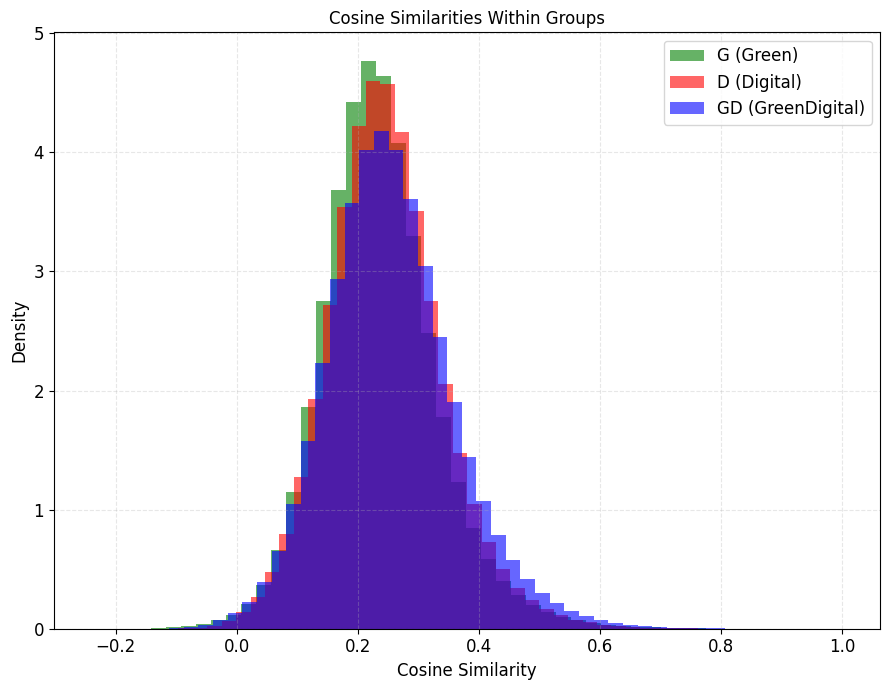

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# --- Compute cosine similarity matrices ---
G = cosine_similarity(normalized_G)
D = cosine_similarity(normalized_D)
GD = cosine_similarity(normalized_GD)

# --- Extract unique pairwise similarities (lower triangle, excluding diagonal) ---
def unique_pairwise_sims(matrix):
    return np.tril(matrix, k=-1)[np.tril_indices_from(matrix, k=-1)]

flat_G = unique_pairwise_sims(G)
flat_D = unique_pairwise_sims(D)
flat_GD = unique_pairwise_sims(GD)

# --- Plot overlapping histograms ---
plt.figure(figsize=(9, 7))
plt.hist(flat_G, bins=50, alpha=0.6, color='green', label='G (Green)', density=True)
plt.hist(flat_D, bins=50, alpha=0.6, color='red', label='D (Digital)', density=True)
plt.hist(flat_GD, bins=50, alpha=0.6, color='blue', label='GD (GreenDigital)', density=True)

plt.title('Cosine Similarities Within Groups', fontsize=12)
plt.xlabel('Cosine Similarity', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


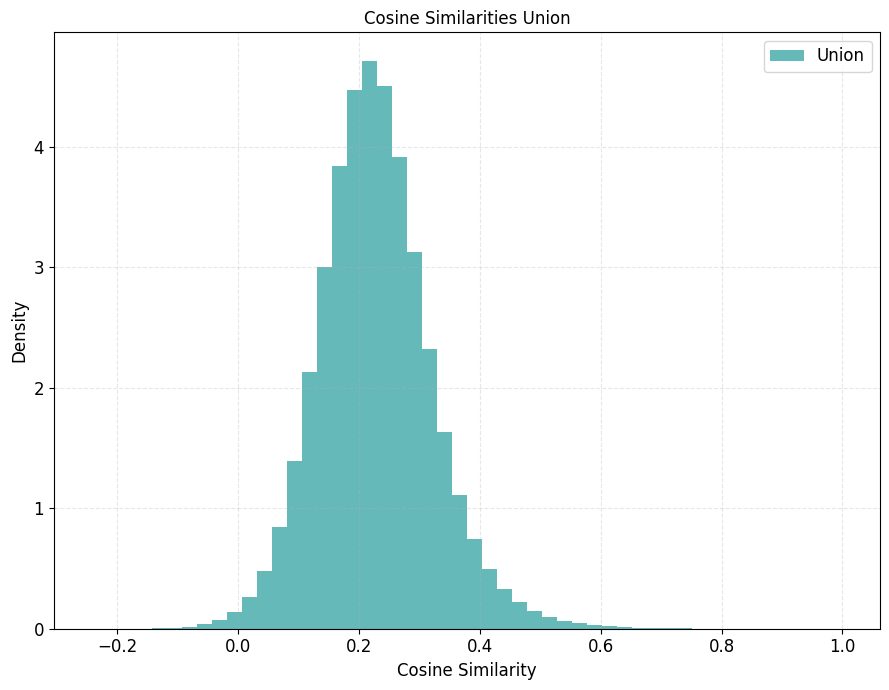

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# --- Compute cosine similarity matrices ---

union = cosine_similarity(normalized_U)

# --- Extract unique pairwise similarities (lower triangle, excluding diagonal) ---
def unique_pairwise_sims(matrix):
    return np.tril(matrix, k=-1)[np.tril_indices_from(matrix, k=-1)]

flat_U = unique_pairwise_sims(union)


# --- Plot overlapping histograms ---
plt.figure(figsize=(9, 7))
plt.hist(flat_U, bins=50, alpha=0.6, color='darkcyan', label='Union', density=True)


plt.title('Cosine Similarities Union', fontsize=12)
plt.xlabel('Cosine Similarity', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()



In [ ]:
from scipy.stats import skew

def print_stats(name, data):
    print(f"--- {name} ---")
    print(f"Mean:   {np.mean(data):.4f}")
    print(f"Median: {np.median(data):.4f}")
    print(f"Std:    {np.std(data):.4f}")
    print(f"Skew:   {skew(data):.4f}")
    print(f"> 0.8:  {(data > 0.8).mean():.2%}")
    print()

# === Within-group ===
print_stats("G (Green)", flat_G)
print_stats("D (Digital)", flat_D)
print_stats("GD (GreenDigital)", flat_GD)

# === Union ===
print_stats("U (All Technologies)", flat_U)


--- G (Green) ---
Mean:   0.2364
Median: 0.2305
Std:    0.0950
Skew:   0.5180
> 0.8:  0.00%

--- D (Digital) ---
Mean:   0.2472
Median: 0.2421
Std:    0.0948
Skew:   0.4605
> 0.8:  0.01%

--- GD (GreenDigital) ---
Mean:   0.2556
Median: 0.2486
Std:    0.1055
Skew:   0.4678
> 0.8:  0.01%

--- U (All Technologies) ---
Mean:   0.2274
Median: 0.2231
Std:    0.0930
Skew:   0.4163
> 0.8:  0.00%



In [ ]:
# for word
import numpy as np
import pandas as pd
from scipy.stats import skew

# Collect stats into a list of dictionaries instead of printing
def get_stats(name, data):
    return {
        'Group': name,
        'Mean': np.mean(data),
        'Median': np.median(data),
        'Std': np.std(data),
        'Skew': skew(data),
        '> 0.8 (%)': (data > 0.8).mean() * 100,
        '< 0.2 (%)': (data < 0.2).mean() * 100
    }

# Collect all stats
all_stats = []

# === Within-group ===
all_stats.append(get_stats("G (Green)", flat_G))
all_stats.append(get_stats("D (Digital)", flat_D))
all_stats.append(get_stats("GD (GreenDigital)", flat_GD))


# === Union ===
all_stats.append(get_stats("U (All Technologies)", flat_U))

# Convert to DataFrame
df_stats = pd.DataFrame(all_stats)

# Format nicely
pd.options.display.float_format = '{:,.4f}'.format
print(df_stats)
df_stats

                  Group   Mean  Median    Std   Skew  > 0.8 (%)  < 0.2 (%)
0             G (Green) 0.2364  0.2305 0.0950 0.5180     0.0045    35.5091
1           D (Digital) 0.2472  0.2421 0.0948 0.4605     0.0055    30.9626
2     GD (GreenDigital) 0.2556  0.2486 0.1055 0.4678     0.0115    30.1688
3  U (All Technologies) 0.2274  0.2231 0.0930 0.4163     0.0037    39.1394


,Group,Mean,Median,Std,Skew,> 0.8 (%),< 0.2 (%)
0,G (Green),0.2364,0.2305,0.0950,0.5180,0.0045,35.5091
1,D (Digital),0.2472,0.2421,0.0948,0.4605,0.0055,30.9626
2,GD (GreenDigital),0.2556,0.2486,0.1055,0.4678,0.0115,30.1688
3,U (All Technologies),0.2274,0.2231,0.0930,0.4163,0.0037,39.1394


#reduction dimension

#Figure 1

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


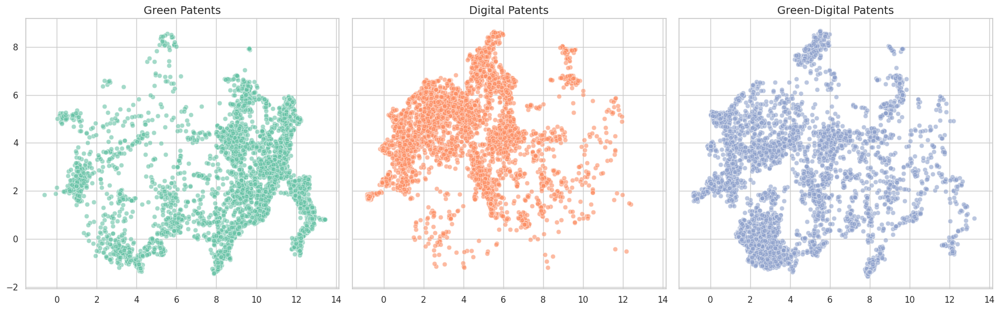

In [ ]:
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
from matplotlib.colors import to_hex

# Assume normalized_U are your normalized MPNet embeddings
# Assume df['source'] contains 'G', 'D', or 'GD'

# 1. Reduce to 2D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_2d = reducer.fit_transform(normalized_U)

# 2. Create a plotting DataFrame
df_plot = pd.DataFrame({
    'x': X_2d[:, 0],
    'y': X_2d[:, 1],
    'source': df['source'].values  # Must be G, D, or GD
})

# 3. Define custom colors
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# 4. Plot: 3 subplots (one per type)
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

# Define sources and titles
sources = ['G', 'D', 'GD']
titles = ['Green Patents', 'Digital Patents', 'Green-Digital Patents']

for ax, src, title in zip(axs, sources, titles):
    subset = df_plot[df_plot['source'] == src]
    sns.scatterplot(
        data=subset,
        x='x', y='y',
        color=custom_palette[src],
        alpha=0.6,
        ax=ax
    )
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('')

# Common title
#fig.suptitle('UMAP Projection of Patent Abstract Embeddings by Technology Type', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])

# 5. Save
images_dir = '/content/drive/MyDrive/PhD_Mercedes/Results/GD-D-G/images/'
os.makedirs(images_dir, exist_ok=True)
image_path = os.path.join(images_dir, "umap_projection_split.png")
plt.savefig(image_path, dpi=300)
plt.show()

#Figure 2

In [ ]:
X_2d

In [ ]:
reducer

In [ ]:
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
from matplotlib.colors import to_hex

# Assume normalized_U are your normalized MPNet embeddings
# Assume df['source'] contains 'G', 'D', or 'GD'

# 1. Reduce to 2D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_2d = reducer.fit_transform(normalized_U)

# 2. Create a plotting DataFrame
df_plot = pd.DataFrame({
    'x': X_2d[:, 0],
    'y': X_2d[:, 1],
    'source': df['source'].values  # Must be G, D, or GD
})

# 3. Define custom colors
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# 4. Plot all in one graph
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=df_plot,
    x='x', y='y',
    hue='source',
    palette=custom_palette,
    alpha=0.6,
    s=20  # point size
)

#plt.title('UMAP Projection of Patent Abstract Embeddings by Technology Type', fontsize=16)
plt.xlabel('')
plt.ylabel('')
plt.legend(title='Technology Type', title_fontsize=12, fontsize=10)

# 5. Save
images_dir = '/content/drive/MyDrive/PhD_Mercedes/Results/GD-D-G/images/'
os.makedirs(images_dir, exist_ok=True)
image_path = os.path.join(images_dir, "umap_projection_combined.png")
plt.tight_layout()
plt.savefig(image_path, dpi=300)
plt.show()


#Figure 3

In [1]:
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Enables 3D projection
import seaborn as sns
import pandas as pd
import os
from matplotlib.colors import to_hex

# Assume normalized_U are your normalized MPNet embeddings
# Assume df['source'] contains 'G', 'D', or 'GD'

# 1. Reduce to 3D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, random_state=42)
X_3d = reducer.fit_transform(normalized_U)

# 2. Create a plotting DataFrame
df_plot = pd.DataFrame({
    'x': X_3d[:, 0],
    'y': X_3d[:, 1],
    'z': X_3d[:, 2],
    'source': df['source'].values
})

# 3. Define custom colors
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# 4. 3D Plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for src in ['G', 'D', 'GD']:
    subset = df_plot[df_plot['source'] == src]
    ax.scatter(
        subset['x'], subset['y'], subset['z'],
        color=custom_palette[src],
        label=src,
        alpha=0.6,
        s=15
    )

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_zlabel('')
ax.legend(title='Technology Type', loc='best', fontsize=10, title_fontsize=12)
# ax.set_title('3D UMAP Projection of Patent Embeddings')

# 5. Save
images_dir = '/content/drive/MyDrive/PhD_Mercedes/Results/GD-D-G/images/'
os.makedirs(images_dir, exist_ok=True)
image_path = os.path.join(images_dir, "umap_projection_3d.png")
plt.tight_layout()
plt.savefig(image_path, dpi=300)
plt.show()


NameError: name 'normalized_U' is not defined

#nearest neighbours -new labels

In [ ]:
normalized_G.shape

(5550, 768)

In [ ]:
normalized_D.shape

(5550, 768)

In [ ]:
normalized_GD.shape

(5550, 768)

In [ ]:
#centroid (average vector) across all rows (documents) for each category
green_centroid = np.mean(normalized_G, axis=0)
digital_centroid = np.mean(normalized_D, axis=0)
greendigital_centroid = np.mean(normalized_GD, axis=0)

# Compare distances between centroids
from scipy.spatial.distance import cosine
print("Distance G-D:", cosine(green_centroid, digital_centroid))
print("Distance G-GD:", cosine(green_centroid, greendigital_centroid))
print("Distance D-GD:", cosine(digital_centroid, greendigital_centroid))

Distance G-D: 0.15623950852056145
Distance G-GD: 0.121370344463826
Distance D-GD: 0.07187848298609156


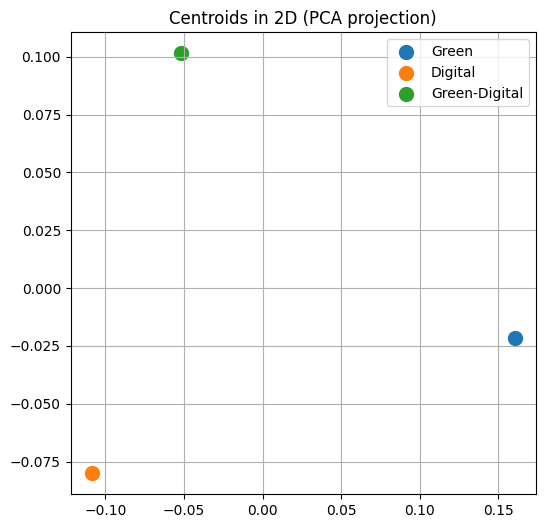

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

centroids = np.vstack([green_centroid, digital_centroid, greendigital_centroid])
labels = ['Green', 'Digital', 'Green-Digital']

pca = PCA(n_components=2)
centroids_2D = pca.fit_transform(centroids)

plt.figure(figsize=(6, 6))
for i, label in enumerate(labels):
    plt.scatter(*centroids_2D[i], label=label, s=100)
plt.legend()
plt.title("Centroids in 2D (PCA projection)")
plt.grid(True)
plt.show()

In [ ]:
from scipy.spatial.distance import cdist

# Distances to their own centroids
green_to_green = cdist(normalized_G, green_centroid.reshape(1, -1), metric='cosine').flatten()
digital_to_digital = cdist(normalized_D, digital_centroid.reshape(1, -1), metric='cosine').flatten()
gd_to_gd = cdist(normalized_GD, greendigital_centroid.reshape(1, -1), metric='cosine').flatten()

# Cross distances (optional: see overlap)
green_to_digital = cdist(normalized_G, digital_centroid.reshape(1, -1), metric='cosine').flatten()
digital_to_green = cdist(normalized_D, green_centroid.reshape(1, -1), metric='cosine').flatten()
gd_to_green = cdist(normalized_GD, green_centroid.reshape(1, -1), metric='cosine').flatten()
gd_to_digital = cdist(normalized_GD, digital_centroid.reshape(1, -1), metric='cosine').flatten()
U_GREEN=cdist(normalized_U, green_centroid.reshape(1, -1), metric='cosine').flatten()
U_DIGITAL=cdist(normalized_U, digital_centroid.reshape(1, -1), metric='cosine').flatten()
U_GREEN_DIGITAL=cdist(normalized_U, greendigital_centroid.reshape(1, -1), metric='cosine').flatten()

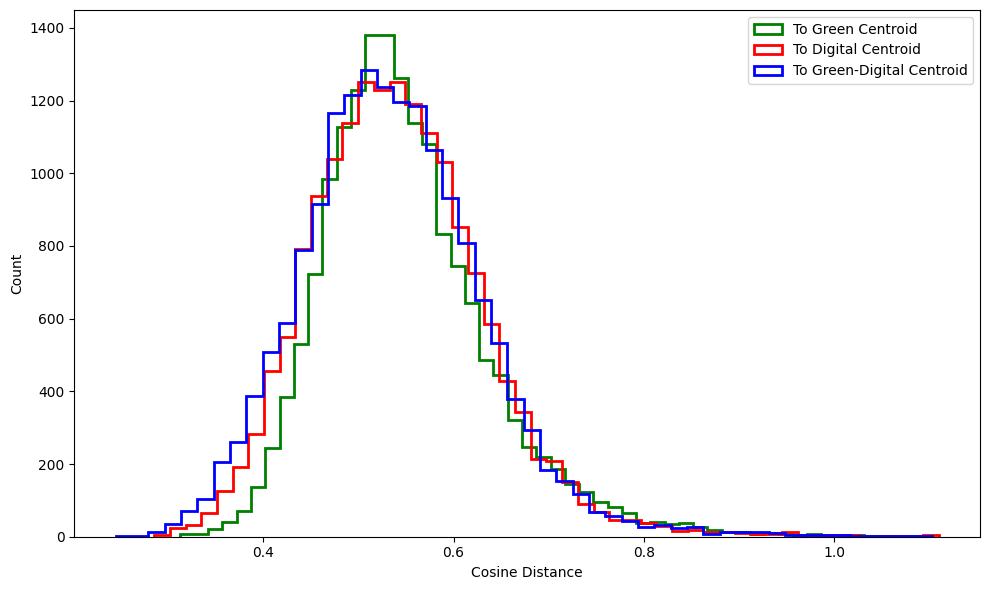

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))

plt.hist(U_GREEN, bins=50, histtype='step', linewidth=2, label='To Green Centroid', color='green')
plt.hist(U_DIGITAL, bins=50, histtype='step', linewidth=2, label='To Digital Centroid', color='red')
plt.hist(U_GREEN_DIGITAL, bins=50, histtype='step', linewidth=2, label='To Green-Digital Centroid', color='blue')

#plt.title('Cosine Distances from All Documents to Centroids')
plt.xlabel('Cosine Distance')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np

# Calculate mean and median cosine distances for each centroid
summary_stats = {
    'Green Centroid': {
        'mean': np.mean(U_GREEN),
        'median': np.median(U_GREEN)
    },
    'Digital Centroid': {
        'mean': np.mean(U_DIGITAL),
        'median': np.median(U_DIGITAL)
    },
    'Green-Digital Centroid': {
        'mean': np.mean(U_GREEN_DIGITAL),
        'median': np.median(U_GREEN_DIGITAL)
    }
}

In [ ]:
# Print results nicely
for centroid, stats in summary_stats.items():
    print(f"{centroid}:")
    print(f"  Mean Cosine Distance = {stats['mean']:.4f}")
    print(f"  Median Cosine Distance = {stats['median']:.4f}\n")

Green Centroid:
  Mean Cosine Distance = 0.5499
  Median Cosine Distance = 0.5377

Digital Centroid:
  Mean Cosine Distance = 0.5410
  Median Cosine Distance = 0.5355

Green-Digital Centroid:
  Mean Cosine Distance = 0.5351
  Median Cosine Distance = 0.5299



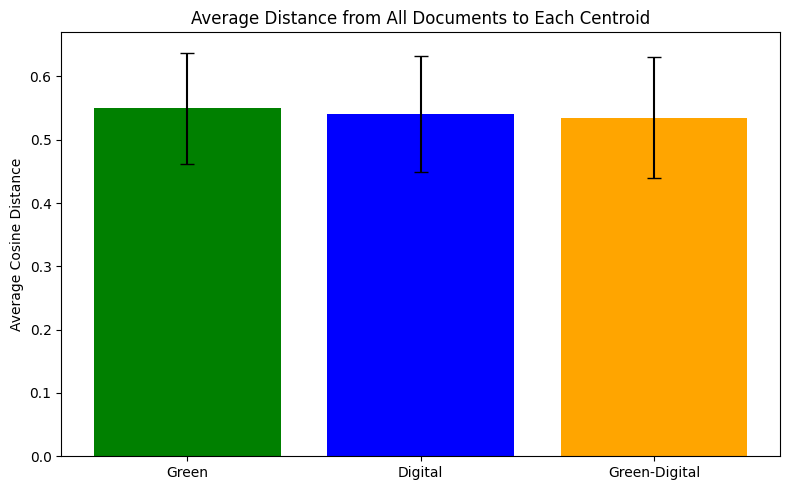

In [ ]:
import numpy as np

means = [np.mean(U_GREEN), np.mean(U_DIGITAL), np.mean(U_GREEN_DIGITAL)]
stds = [np.std(U_GREEN), np.std(U_DIGITAL), np.std(U_GREEN_DIGITAL)]
labels = ['Green', 'Digital', 'Green-Digital']

plt.figure(figsize=(8, 5))
plt.bar(labels, means, yerr=stds, capsize=5, color=['green', 'blue', 'orange'])
plt.ylabel('Average Cosine Distance')
plt.title('Average Distance from All Documents to Each Centroid')
plt.tight_layout()
plt.show()

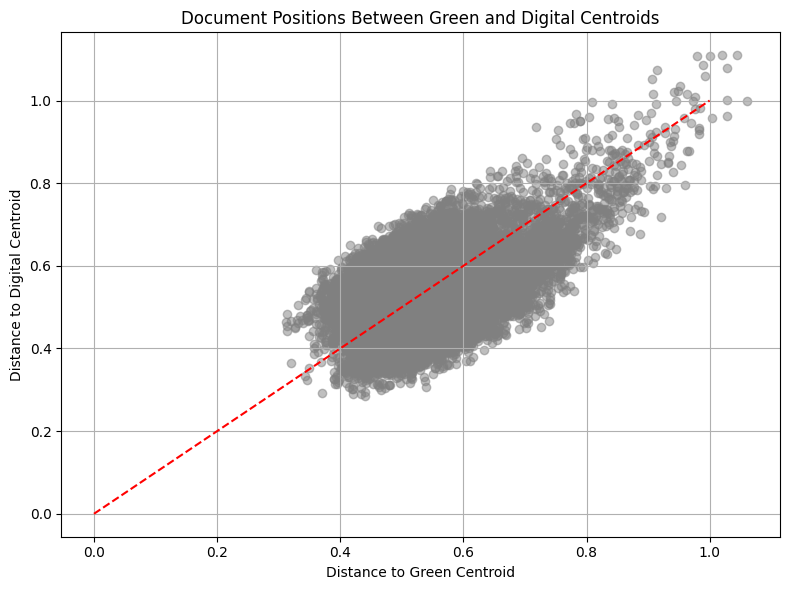

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(U_GREEN, U_DIGITAL, alpha=0.5, c='gray')
plt.plot([0, 1], [0, 1], linestyle='--', color='red')
plt.xlabel("Distance to Green Centroid")
plt.ylabel("Distance to Digital Centroid")
plt.title("Document Positions Between Green and Digital Centroids")
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipython-input-89-67122800.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Centroid', fontsize=10, title_fontsize=11)


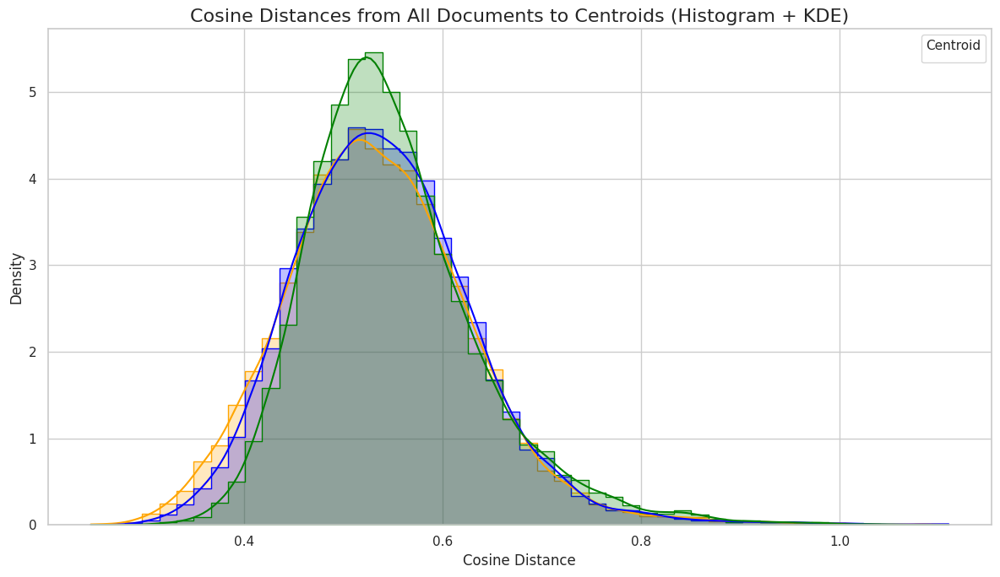

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set style
sns.set(style='whitegrid')

# Create DataFrame for easier plotting with seaborn
df_distances = pd.DataFrame({
    'To Green Centroid': U_GREEN,
    'To Digital Centroid': U_DIGITAL,
    'To Green-Digital Centroid': U_GREEN_DIGITAL
})

# Melt for seaborn-friendly format
df_melted = df_distances.melt(var_name='Centroid', value_name='Cosine Distance')

# Plot
plt.figure(figsize=(12, 7))
sns.histplot(data=df_melted, x='Cosine Distance', hue='Centroid', element='step', stat='density',
             common_norm=False, bins=50, kde=True, palette=['green', 'blue', 'orange'])

# Titles and labels
plt.title('Cosine Distances from All Documents to Centroids (Histogram + KDE)', fontsize=16)
plt.xlabel('Cosine Distance', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(title='Centroid', fontsize=10, title_fontsize=11)
plt.tight_layout()
plt.show()


In [ ]:
print(normalized_G.shape)
print(green_centroid.shape)
print(green_centroid.reshape(1, -1).shape)

(5550, 768)
(768,)
(1, 768)


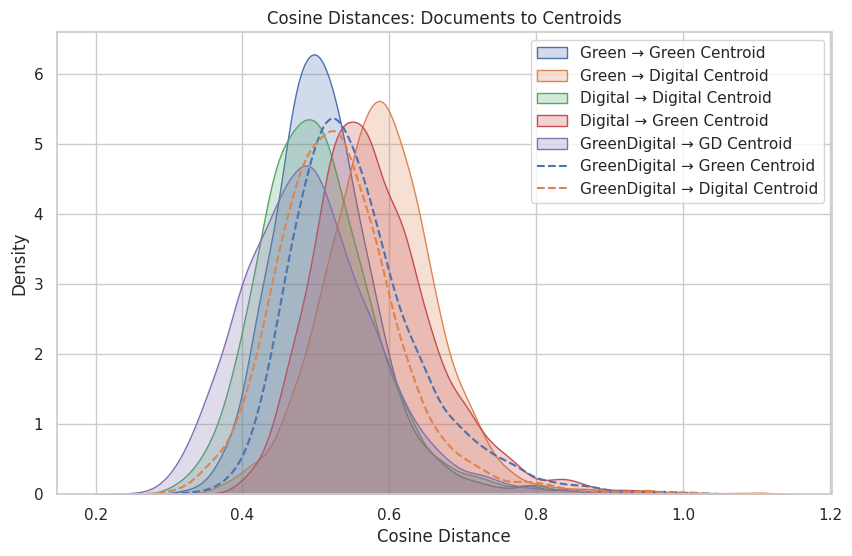

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.kdeplot(green_to_green, label="Green → Green Centroid", fill=True)
sns.kdeplot(green_to_digital, label="Green → Digital Centroid", fill=True)
sns.kdeplot(digital_to_digital, label="Digital → Digital Centroid", fill=True)
sns.kdeplot(digital_to_green, label="Digital → Green Centroid", fill=True)
sns.kdeplot(gd_to_gd, label="GreenDigital → GD Centroid", fill=True)
sns.kdeplot(gd_to_green, label="GreenDigital → Green Centroid", linestyle='--')
sns.kdeplot(gd_to_digital, label="GreenDigital → Digital Centroid", linestyle='--')
plt.title("Cosine Distances: Documents to Centroids")
plt.xlabel("Cosine Distance")
plt.ylabel("Density")
plt.legend()
plt.show()

In [ ]:
green_centroid.shape

(768,)

In [ ]:
normalized_U

array([[ 0.04422776, -0.02260404, -0.01844398, ...,  0.06025791,
         0.00680492, -0.05022699],
       [ 0.00449388, -0.06659767, -0.01281123, ..., -0.0262048 ,
         0.0525503 , -0.00807948],
       [ 0.00922588,  0.02860471, -0.02907262, ...,  0.00592307,
        -0.02176623,  0.00085257],
       ...,
       [-0.03812687,  0.03754095, -0.02728699, ...,  0.01754009,
        -0.06315427, -0.01366764],
       [-0.00099006, -0.02086733,  0.01310188, ...,  0.06322676,
        -0.02966128, -0.02151016],
       [-0.01393659, -0.0812404 , -0.05605916, ...,  0.01978615,
        -0.00905976, -0.03924027]])

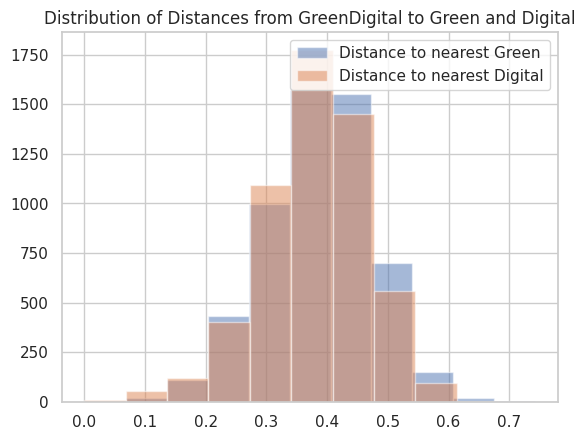

In [ ]:
import matplotlib.pyplot as plt # Importing the pyplot module from matplotlib
from sklearn.neighbors import NearestNeighbors

nn_green = NearestNeighbors(n_neighbors=1, metric='cosine').fit(normalized_G)
nn_digital = NearestNeighbors(n_neighbors=1, metric='cosine').fit(normalized_D)

distances_green, indices_green = nn_green.kneighbors(normalized_GD)
distances_digital, indices_digital = nn_digital.kneighbors(normalized_GD)

# Analyze the distribution of these distances
plt.hist(distances_green, alpha=0.5, label='Distance to nearest Green')
plt.hist(distances_digital, alpha=0.5, label='Distance to nearest Digital')
plt.legend()
plt.title('Distribution of Distances from GreenDigital to Green and Digital')
plt.show()

###green digital

In [ ]:
from collections import Counter
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors

# Initialize results storage
label_stats = {}

# Fit NearestNeighbors models once for each dataset
nn_green = NearestNeighbors(n_neighbors=200, metric='cosine').fit(normalized_G)
nn_digital = NearestNeighbors(n_neighbors=200, metric='cosine').fit(normalized_D)
nn_gd = NearestNeighbors(n_neighbors=200, metric='cosine').fit(normalized_GD)

# Loop over multiple k values
for k in [1, 5, 10, 20, 30, 50, 100, 200]:
    # Compute nearest neighbors distances for each k
    avg_dist_green = nn_green.kneighbors(normalized_GD, n_neighbors=k)[0].mean(axis=1)
    avg_dist_digital = nn_digital.kneighbors(normalized_GD, n_neighbors=k)[0].mean(axis=1)
    avg_dist_gd = nn_gd.kneighbors(normalized_GD, n_neighbors=k)[0].mean(axis=1)

    # Create a copy of the original data
    df_GD_k = raw_data_GD.copy()

    # Add distances to the DataFrame
    df_GD_k['distance_to_green'] = avg_dist_green
    df_GD_k['distance_to_digital'] = avg_dist_digital
    df_GD_k['distance_to_gd'] = avg_dist_gd

    # Define "balanced" threshold
    epsilon = 0.01

    # Assign 4-way labels
    df_GD_k['gd_label'] = np.where(
    avg_dist_gd < np.minimum(avg_dist_green, avg_dist_digital), 'more_green_digital',
    np.where(np.abs(avg_dist_green - avg_dist_digital) < epsilon, 'balanced',
             np.where(avg_dist_green < avg_dist_digital, 'more_green',
                      'more_digital'))
)


    # Count and store label distribution
    label_counts = Counter(df_GD_k['gd_label'])
    label_stats[k] = label_counts

    print(f"k={k}: {label_counts}")

k=1: Counter({'more_green_digital': 5550})
k=5: Counter({'more_green_digital': 5393, 'more_green': 83, 'more_digital': 73, 'balanced': 1})
k=10: Counter({'more_green_digital': 5032, 'more_digital': 289, 'more_green': 228, 'balanced': 1})
k=20: Counter({'more_green_digital': 4679, 'more_digital': 499, 'more_green': 368, 'balanced': 4})
k=30: Counter({'more_green_digital': 4504, 'more_digital': 620, 'more_green': 421, 'balanced': 5})
k=50: Counter({'more_green_digital': 4319, 'more_digital': 743, 'more_green': 477, 'balanced': 11})
k=100: Counter({'more_green_digital': 4142, 'more_digital': 894, 'more_green': 504, 'balanced': 10})
k=200: Counter({'more_green_digital': 4012, 'more_digital': 998, 'more_green': 517, 'balanced': 23})


In [ ]:
nn_green

NearestNeighbors(metric='cosine', n_neighbors=200)

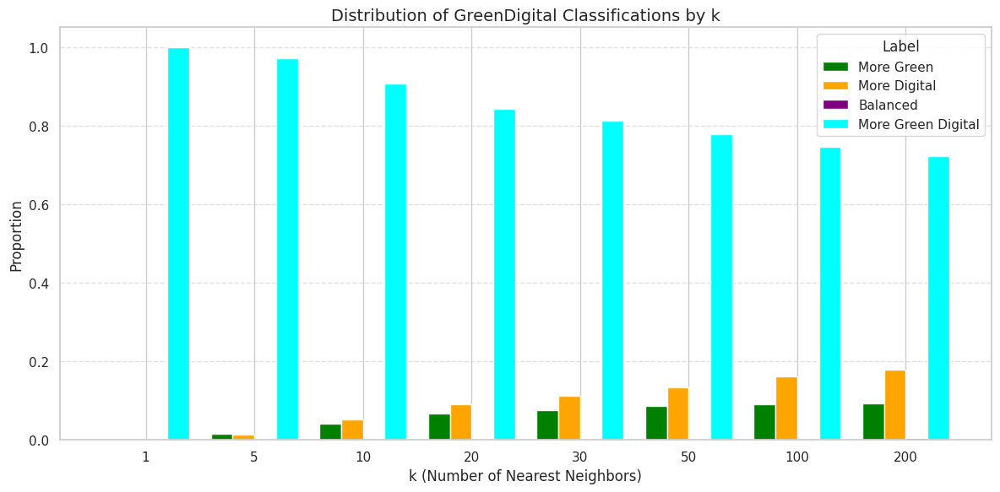

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract sorted k values and all possible labels
k_values = sorted(label_stats.keys())
all_labels = ['more_green', 'more_digital', 'balanced', 'more_green_digital']
colors = {
    'more_green': 'green',
    'more_digital': 'orange',
    'balanced': 'purple',
    'more_green_digital': 'cyan'
}

# Prepare bar heights for each label
counts_by_label = {label: [] for label in all_labels}
for k in k_values:
    total = sum(label_stats[k].values())
    for label in all_labels:
        count = label_stats[k].get(label, 0)
        counts_by_label[label].append(count / total)  # proportion

# Bar plot setup
x = np.arange(len(k_values))
bar_width = 0.2

fig, ax = plt.subplots(figsize=(12, 6))

for i, label in enumerate(all_labels):
    ax.bar(x + i * bar_width, counts_by_label[label], width=bar_width, label=label.replace('_', ' ').title(), color=colors[label])

# Formatting
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Distribution of GreenDigital Classifications by k', fontsize=14)
ax.set_xticks(x + 1.5 * bar_width)
ax.set_xticklabels(k_values)
ax.legend(title='Label')
ax.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


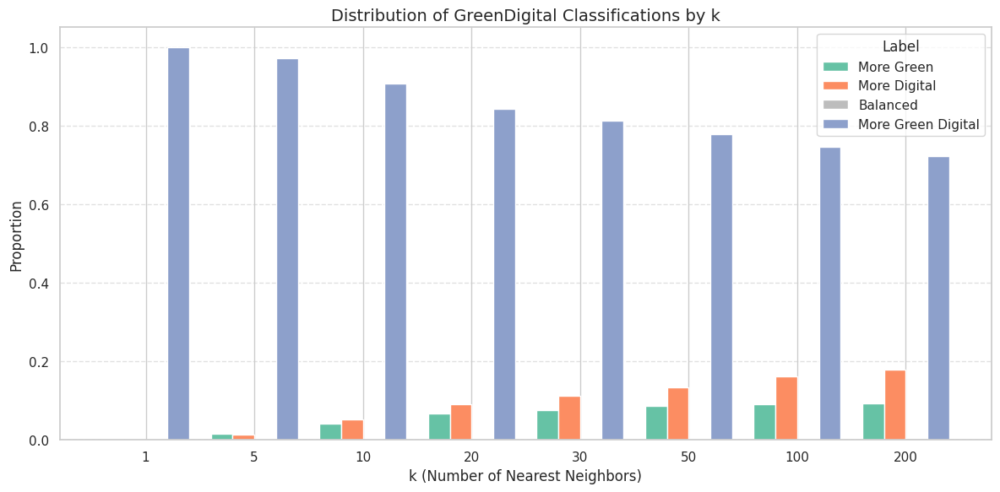

In [ ]:
import seaborn as sns
from matplotlib.colors import to_hex
import matplotlib.pyplot as plt
import numpy as np

# Define Set2 colors for 'G', 'D', 'GD'
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# Assign Set2-based custom colors to your labels, with grey for the fourth
colors = {
    'more_green': custom_palette['G'],
    'more_digital': custom_palette['D'],
    'more_green_digital': custom_palette['GD'],
    'balanced': '#bdbdbd'  # light grey (from ColorBrewer Greys)
}

# Replace this with your actual label_stats dictionary
# Example mock structure for demonstration:
# label_stats = {
#     5: {'more_green': 10, 'more_digital': 20, 'balanced': 30, 'more_green_digital': 40},
#     10: {'more_green': 15, 'more_digital': 25, 'balanced': 35, 'more_green_digital': 25},
#     ...
# }

# Extract sorted k values and all possible labels
k_values = sorted(label_stats.keys())
all_labels = ['more_green', 'more_digital', 'balanced', 'more_green_digital']

# Prepare bar heights for each label
counts_by_label = {label: [] for label in all_labels}
for k in k_values:
    total = sum(label_stats[k].values())
    for label in all_labels:
        count = label_stats[k].get(label, 0)
        counts_by_label[label].append(count / total)  # proportion

# Bar plot setup
x = np.arange(len(k_values))
bar_width = 0.2

fig, ax = plt.subplots(figsize=(12, 6))

for i, label in enumerate(all_labels):
    ax.bar(
        x + i * bar_width,
        counts_by_label[label],
        width=bar_width,
        label=label.replace('_', ' ').title(),
        color=colors[label]
    )

# Formatting
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Distribution of GreenDigital Classifications by k', fontsize=14)
ax.set_xticks(x + 1.5 * bar_width)
ax.set_xticklabels(k_values)
ax.legend(title='Label')
ax.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()




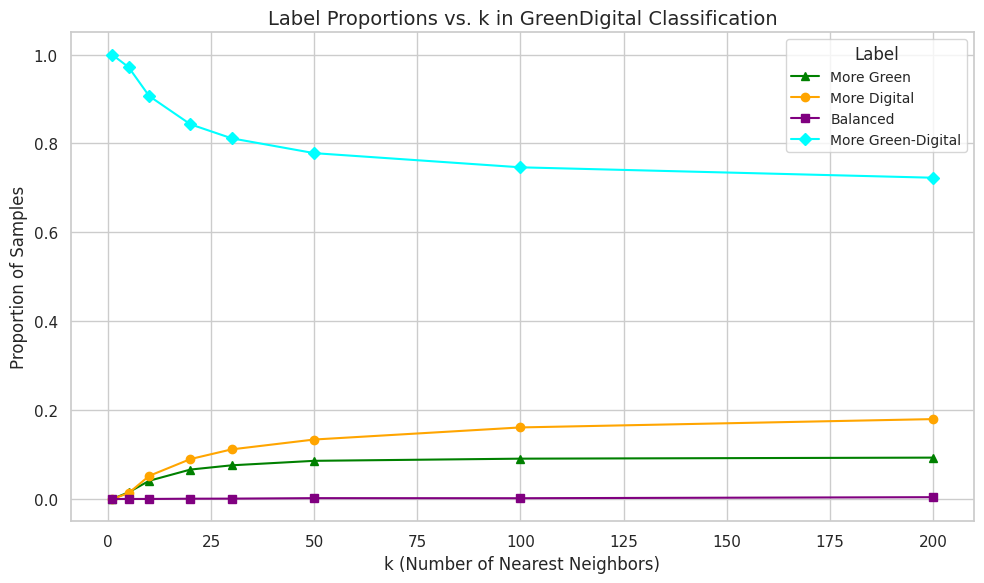

In [ ]:
import matplotlib.pyplot as plt

# Extract proportions from label_stats
k_values = sorted(label_stats.keys())
prop_green = []
prop_digital = []
prop_balanced = []
prop_green_digital = []

for k in k_values:
    counts = label_stats[k]
    total = sum(counts.values())
    prop_green.append(counts.get('more_green', 0) / total)
    prop_digital.append(counts.get('more_digital', 0) / total)
    prop_balanced.append(counts.get('balanced', 0) / total)
    prop_green_digital.append(counts.get('more_green_digital', 0) / total)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_values, prop_green, marker='^', label='More Green', color='green')
ax.plot(k_values, prop_digital, marker='o', label='More Digital', color='orange')
ax.plot(k_values, prop_balanced, marker='s', label='Balanced', color='purple')
ax.plot(k_values, prop_green_digital, marker='D', label='More Green-Digital', color='cyan')

# Customize
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion of Samples', fontsize=12)
ax.set_title('Label Proportions vs. k in GreenDigital Classification', fontsize=14)
ax.legend(title='Label', fontsize=10)
ax.grid(True)
plt.tight_layout()
plt.show()


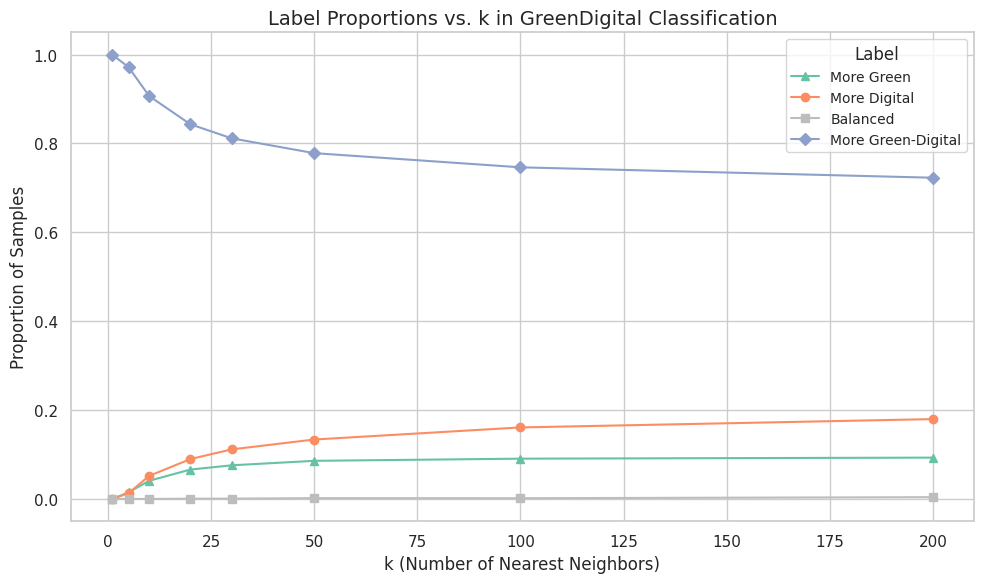

In [ ]:
import seaborn as sns
from matplotlib.colors import to_hex
import matplotlib.pyplot as plt

# Define Set2 colors for 'G', 'D', 'GD'
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# Assign Set2-based custom colors to your labels, with grey for the fourth
colors = {
    'more_green': custom_palette['G'],
    'more_digital': custom_palette['D'],
    'more_green_digital': custom_palette['GD'],
    'balanced': '#bdbdbd'  # light grey
}

# Extract proportions from label_stats
k_values = sorted(label_stats.keys())
prop_green = []
prop_digital = []
prop_balanced = []
prop_green_digital = []

for k in k_values:
    counts = label_stats[k]
    total = sum(counts.values())
    prop_green.append(counts.get('more_green', 0) / total)
    prop_digital.append(counts.get('more_digital', 0) / total)
    prop_balanced.append(counts.get('balanced', 0) / total)
    prop_green_digital.append(counts.get('more_green_digital', 0) / total)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_values, prop_green, marker='^', label='More Green', color=colors['more_green'])
ax.plot(k_values, prop_digital, marker='o', label='More Digital', color=colors['more_digital'])
ax.plot(k_values, prop_balanced, marker='s', label='Balanced', color=colors['balanced'])
ax.plot(k_values, prop_green_digital, marker='D', label='More Green-Digital', color=colors['more_green_digital'])

# Customize
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion of Samples', fontsize=12)
ax.set_title('Label Proportions vs. k in GreenDigital Classification', fontsize=14)
ax.legend(title='Label', fontsize=10)
ax.grid(True)
plt.tight_layout()
plt.show()



k=50: Counter({'more_green_digital': 4319, 'more_digital': 743, 'more_green': 477, 'balanced': 11})


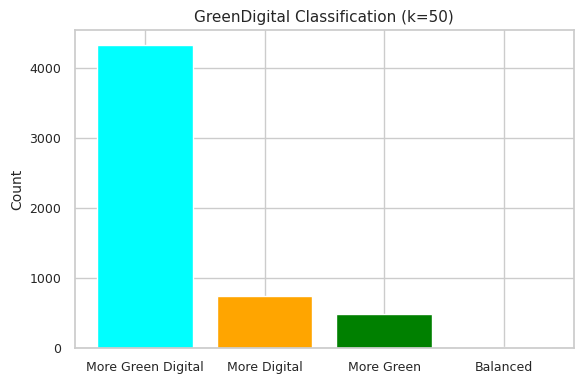

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import NearestNeighbors

# Parameters
k = 50
epsilon = 0.01
colors = {"more_green": "green", "more_digital": "orange", "balanced": "purple", "more_green_digital": "cyan"}

# Fit models
nn_G = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
nn_D = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
nn_GD = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

# Compute average distances to neighbors in G, D, and GD
avg_G = nn_G.kneighbors(normalized_GD)[0].mean(axis=1)
avg_D = nn_D.kneighbors(normalized_GD)[0].mean(axis=1)
avg_GD = nn_GD.kneighbors(normalized_GD)[0].mean(axis=1)

labels = np.where(
    avg_GD < np.minimum(avg_G, avg_D), 'more_green_digital',
    np.where(np.abs(avg_G - avg_D) < epsilon, 'balanced',
             np.where(avg_G < avg_D, 'more_green',
                      'more_digital'))
)


# Count label occurrences
counts = Counter(labels)
print(f"k={k}: {counts}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar([label.replace('_', ' ').title() for label in counts.keys()],
        counts.values(),
        color=[colors[l] for l in counts.keys()])
plt.ylabel('Count', fontsize=10)
plt.title(f'GreenDigital Classification (k={k})', fontsize=11)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()



In [ ]:
# --- Create DataFrame for further analysis ---
df_GD = raw_data_GD.copy()
df_GD['distance_to_green'] = avg_G
df_GD['distance_to_digital'] = avg_D
df_GD['distance_to_gd'] = avg_GD
df_GD['gd_label_str'] = labels

# Optional: map string labels to numeric values
label_mapping = {'more_green': 0, 'more_digital': 1, 'balanced': 2, 'more_green_digital': 3}
df_GD['gd_label'] = df_GD['gd_label_str'].map(label_mapping)

df_GD.head()

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,gd_label_str,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,The present invention discloses an unmanned ae...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,The present invention provides an accelerator ...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,A controlling method executes an auto-calculat...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,"In an embodiment, a computer-implemented metho...",62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,Systems and methods that analyze blood-based c...,310,0.6778,0.5075,0.4690,more_green_digital,3


k=50: Counter({'more_green_digital': 4319, 'more_digital': 743, 'more_green': 477, 'balanced': 11})


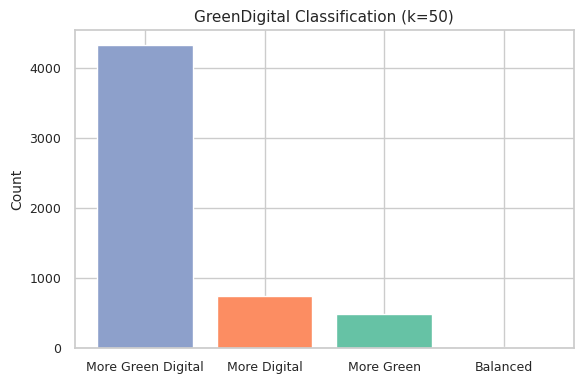

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import NearestNeighbors
import seaborn as sns
from matplotlib.colors import to_hex

# Define Set2 colors for 'G', 'D', 'GD'
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# Assign Set2-based custom colors to your labels, grey for the fourth
colors = {
    'more_green': custom_palette['G'],
    'more_digital': custom_palette['D'],
    'more_green_digital': custom_palette['GD'],
    'balanced': '#bdbdbd'  # light grey
}

# Parameters
k = 50
epsilon = 0.01

# Fit models
nn_G = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
nn_D = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
nn_GD = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

# Compute average distances to neighbors in G, D, and GD
avg_G = nn_G.kneighbors(normalized_GD)[0].mean(axis=1)
avg_D = nn_D.kneighbors(normalized_GD)[0].mean(axis=1)
avg_GD = nn_GD.kneighbors(normalized_GD)[0].mean(axis=1)

# Classification based on distance thresholds
labels = np.where(
    avg_GD < np.minimum(avg_G, avg_D), 'more_green_digital',
    np.where(np.abs(avg_G - avg_D) < epsilon, 'balanced',
             np.where(avg_G < avg_D, 'more_green', 'more_digital'))
)

# Count label occurrences
counts = Counter(labels)
print(f"k={k}: {counts}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar(
    [label.replace('_', ' ').title() for label in counts.keys()],
    counts.values(),
    color=[colors[label] for label in counts.keys()]
)
plt.ylabel('Count', fontsize=10)
plt.title(f'GreenDigital Classification (k={k})', fontsize=11)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


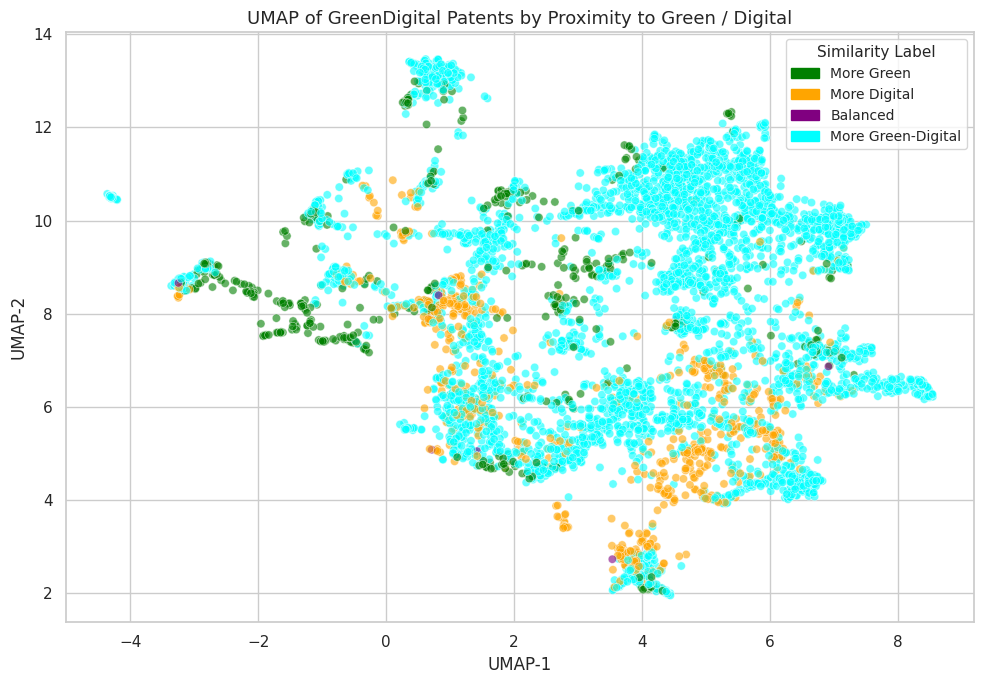

In [ ]:
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt

# Reduce the Green Digital embeddings to 2D using UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_GD_2d = reducer.fit_transform(normalized_GD)

# Build DataFrame for plotting
df_GD_plot = pd.DataFrame({
    'x': X_GD_2d[:, 0],
    'y': X_GD_2d[:, 1],
    'label': df_GD['gd_label'].values,
    'label_str': df_GD['gd_label_str'].values  # For nicer legend labels
})

# Updated color palette for all 4 classes
palette = {
    0: 'green',   # more_green
    1: 'orange',  # more_digital
    2: 'purple',  # balanced
    3: 'cyan'     # more_green_digital
}

# Plot
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_GD_plot,
    x='x', y='y',
    hue='label',
    palette=palette,
    alpha=0.6
)

# Optional: use custom legend with string labels
from matplotlib.patches import Patch
legend_labels = {
    0: "More Green",
    1: "More Digital",
    2: "Balanced",
    3: "More Green-Digital"
}
handles = [Patch(color=palette[i], label=legend_labels[i]) for i in sorted(palette)]
plt.legend(handles=handles, title="Similarity Label", fontsize=10, title_fontsize=11)

plt.title("UMAP of GreenDigital Patents by Proximity to Green / Digital", fontsize=13)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


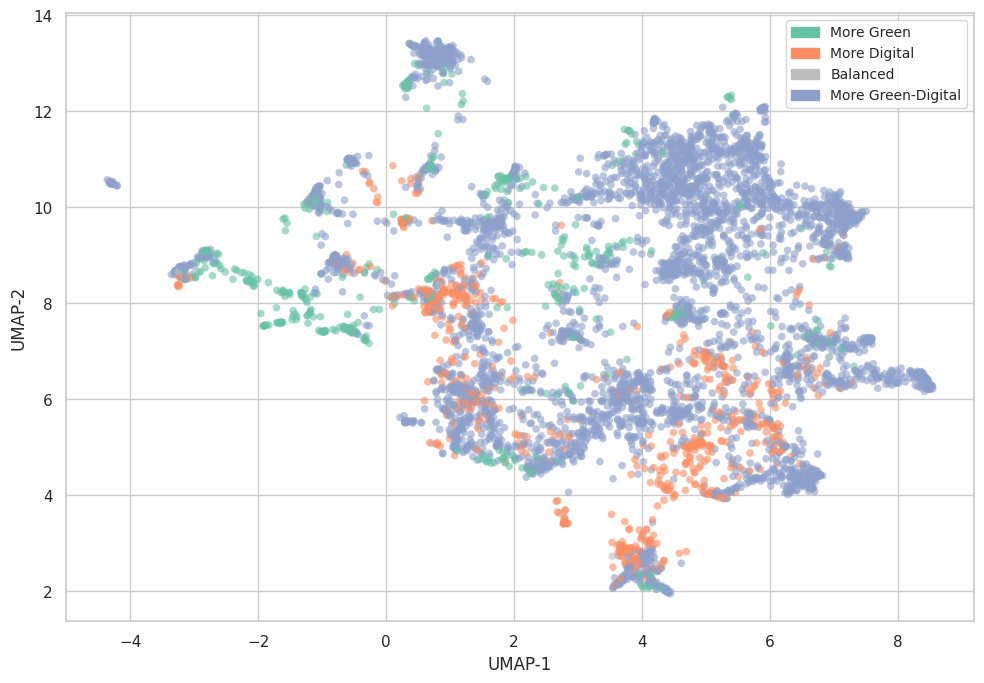

In [ ]:
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.colors import to_hex
from matplotlib.patches import Patch

# Define Set2 palette
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# Updated color palette for labels: 0: more_green, 1: more_digital, 2: balanced, 3: more_green_digital
palette = {
    0: custom_palette['G'],
    1: custom_palette['D'],
    2: '#bdbdbd',                 # light grey for balanced
    3: custom_palette['GD']
}

# Reduce the Green Digital embeddings to 2D using UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_GD_2d = reducer.fit_transform(normalized_GD)

# Build DataFrame for plotting
df_GD_plot = pd.DataFrame({
    'x': X_GD_2d[:, 0],
    'y': X_GD_2d[:, 1],
    'label': df_GD['gd_label'].values,
    'label_str': df_GD['gd_label_str'].values  # For nicer legend labels
})

# Plot
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_GD_plot,
    x='x', y='y',
    hue='label',
    palette=palette,
    alpha=0.6,
    linewidth=0,
    s=30
)

# Custom legend
legend_labels = {
    0: "More Green",
    1: "More Digital",
    2: "Balanced",
    3: "More Green-Digital"
}
handles = [Patch(color=palette[i], label=legend_labels[i]) for i in sorted(palette)]
plt.legend(handles=handles, fontsize=10, title_fontsize=11)

#plt.title("UMAP of GreenDigital Patents by Proximity to Green / Digital", fontsize=13)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.show()


###green

In [ ]:
from collections import Counter
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors

# Initialize results storage
label_stats = {}

# Loop over multiple k values
for k in [1, 5, 10, 20, 30, 50, 100, 200]:
    # Fit NearestNeighbors models
    nn_green = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
    nn_digital = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
    nn_gd = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

    # Compute average distances
    avg_dist_green = nn_green.kneighbors(normalized_G)[0].mean(axis=1)
    avg_dist_digital = nn_digital.kneighbors(normalized_G)[0].mean(axis=1)
    avg_dist_gd = nn_gd.kneighbors(normalized_G)[0].mean(axis=1)

    # Create a copy of the original data
    df_G_k = raw_data_G.copy()

    # Add distances to the DataFrame
    df_G_k['distance_to_green'] = avg_dist_green
    df_G_k['distance_to_digital'] = avg_dist_digital
    df_G_k['distance_to_gd'] = avg_dist_gd

    # Define "balanced" threshold
    epsilon = 0.01

    # Assign 4-way labels
    df_G_k['gd_label'] = np.where(
    avg_dist_gd < np.minimum(avg_dist_green, avg_dist_digital), 'more_green_digital',
    np.where(np.abs(avg_dist_green - avg_dist_digital) < epsilon, 'balanced',
             np.where(avg_dist_green < avg_dist_digital, 'more_green',
                      'more_digital'))
    )
    # Count and store label distribution
    label_counts = Counter(df_G_k['gd_label'])
    label_stats[k] = label_counts

    print(f"k={k}: {label_counts}")




k=1: Counter({'more_green': 5550})
k=5: Counter({'more_green': 5455, 'more_green_digital': 60, 'more_digital': 22, 'balanced': 13})
k=10: Counter({'more_green': 5212, 'more_green_digital': 242, 'more_digital': 67, 'balanced': 29})
k=20: Counter({'more_green': 4965, 'more_green_digital': 431, 'more_digital': 102, 'balanced': 52})
k=30: Counter({'more_green': 4853, 'more_green_digital': 518, 'more_digital': 130, 'balanced': 49})
k=50: Counter({'more_green': 4731, 'more_green_digital': 619, 'more_digital': 136, 'balanced': 64})
k=100: Counter({'more_green': 4586, 'more_green_digital': 749, 'more_digital': 148, 'balanced': 67})
k=200: Counter({'more_green': 4452, 'more_green_digital': 865, 'more_digital': 167, 'balanced': 66})


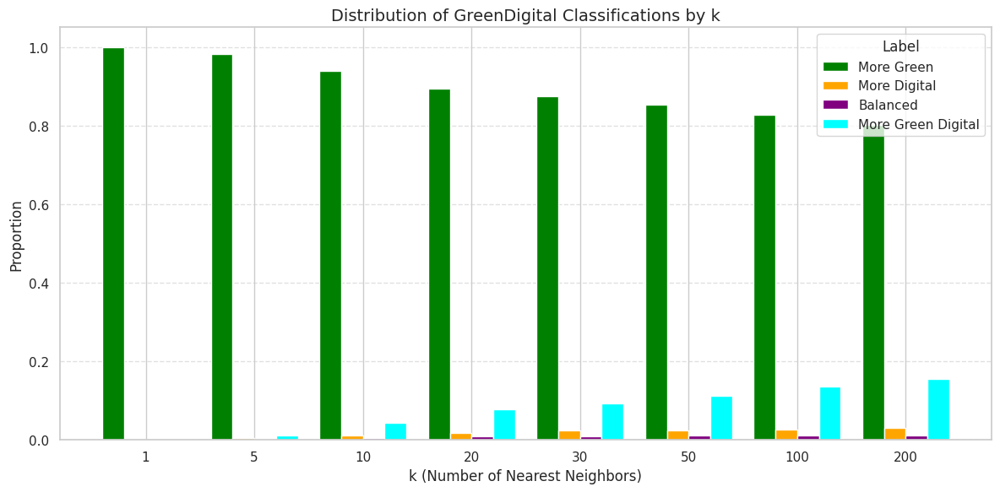

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract sorted k values and all possible labels
k_values = sorted(label_stats.keys())
all_labels = ['more_green', 'more_digital', 'balanced', 'more_green_digital']
colors = {
    'more_green': 'green',
    'more_digital': 'orange',
    'balanced': 'purple',
    'more_green_digital': 'cyan'
}

# Prepare bar heights for each label
counts_by_label = {label: [] for label in all_labels}
for k in k_values:
    total = sum(label_stats[k].values())
    for label in all_labels:
        count = label_stats[k].get(label, 0)
        counts_by_label[label].append(count / total)  # proportion

# Bar plot setup
x = np.arange(len(k_values))
bar_width = 0.2

fig, ax = plt.subplots(figsize=(12, 6))

for i, label in enumerate(all_labels):
    ax.bar(x + i * bar_width, counts_by_label[label], width=bar_width, label=label.replace('_', ' ').title(), color=colors[label])

# Formatting
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Distribution of GreenDigital Classifications by k', fontsize=14)
ax.set_xticks(x + 1.5 * bar_width)
ax.set_xticklabels(k_values)
ax.legend(title='Label')
ax.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

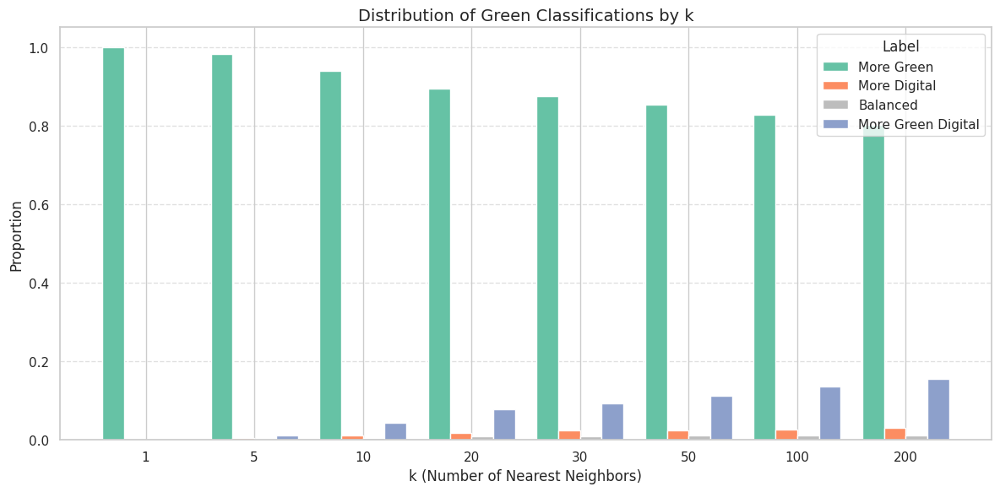

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.colors import to_hex

# Define Set2 custom palette
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# Updated colors with grey for 'balanced'
colors = {
    'more_green': custom_palette['G'],
    'more_digital': custom_palette['D'],
    'more_green_digital': custom_palette['GD'],
    'balanced': '#bdbdbd'  # light grey
}

# Extract sorted k values and all possible labels
k_values = sorted(label_stats.keys())
all_labels = ['more_green', 'more_digital', 'balanced', 'more_green_digital']

# Prepare bar heights for each label
counts_by_label = {label: [] for label in all_labels}
for k in k_values:
    total = sum(label_stats[k].values())
    for label in all_labels:
        count = label_stats[k].get(label, 0)
        counts_by_label[label].append(count / total)  # proportion

# Bar plot setup
x = np.arange(len(k_values))
bar_width = 0.2

fig, ax = plt.subplots(figsize=(12, 6))

for i, label in enumerate(all_labels):
    ax.bar(x + i * bar_width, counts_by_label[label],
           width=bar_width,
           label=label.replace('_', ' ').title(),
           color=colors[label])

# Formatting
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Distribution of Green Classifications by k', fontsize=14)
ax.set_xticks(x + 1.5 * bar_width)
ax.set_xticklabels(k_values)
ax.legend(title='Label')
ax.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


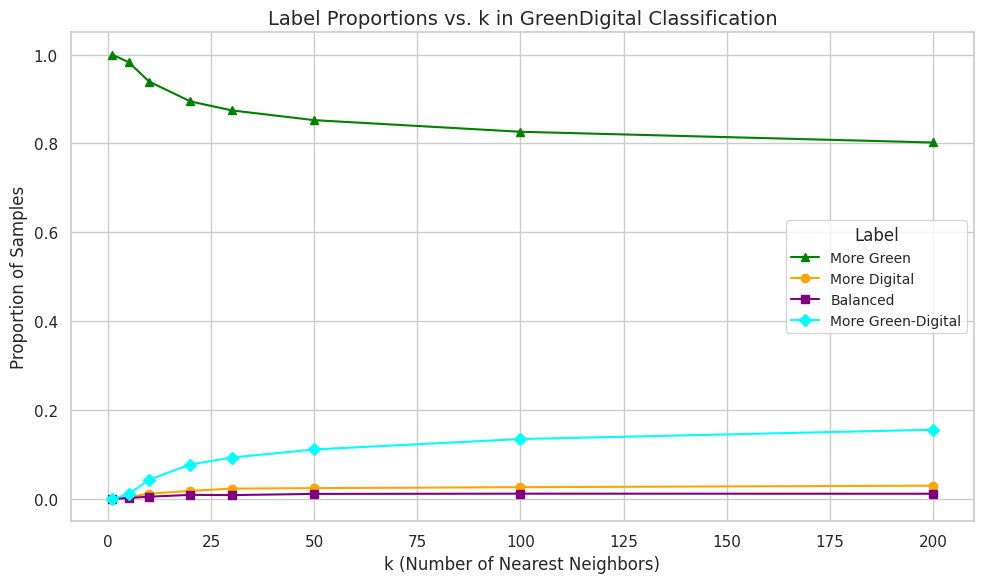

In [ ]:
import matplotlib.pyplot as plt

# Extract proportions from label_stats
k_values = sorted(label_stats.keys())
prop_green = []
prop_digital = []
prop_balanced = []
prop_green_digital = []

for k in k_values:
    counts = label_stats[k]
    total = sum(counts.values())
    prop_green.append(counts.get('more_green', 0) / total)
    prop_digital.append(counts.get('more_digital', 0) / total)
    prop_balanced.append(counts.get('balanced', 0) / total)
    prop_green_digital.append(counts.get('more_green_digital', 0) / total)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_values, prop_green, marker='^', label='More Green', color='green')
ax.plot(k_values, prop_digital, marker='o', label='More Digital', color='orange')
ax.plot(k_values, prop_balanced, marker='s', label='Balanced', color='purple')
ax.plot(k_values, prop_green_digital, marker='D', label='More Green-Digital', color='cyan')

# Customize
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion of Samples', fontsize=12)
ax.set_title('Label Proportions vs. k in GreenDigital Classification', fontsize=14)
ax.legend(title='Label', fontsize=10)
ax.grid(True)
plt.tight_layout()
plt.show()

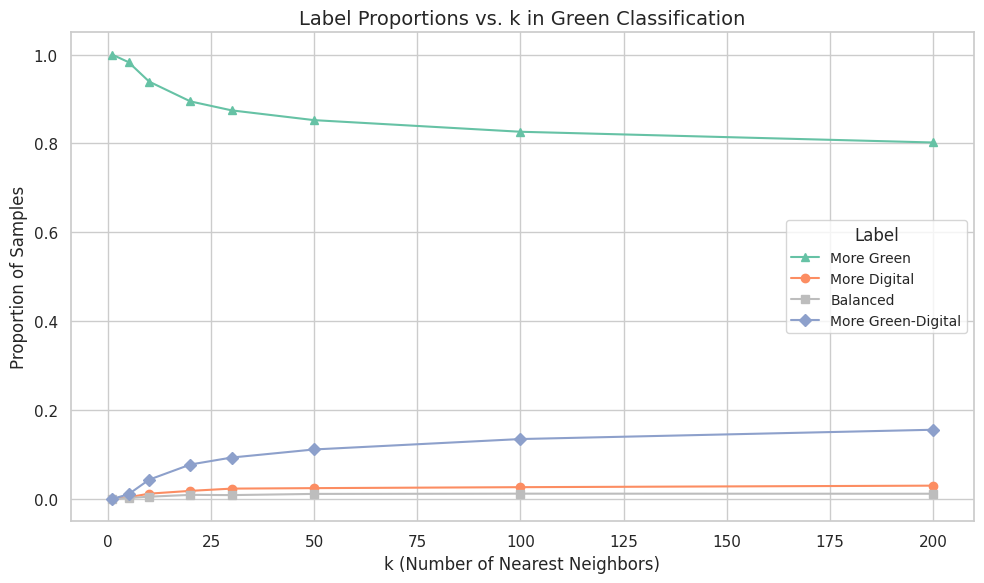

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import to_hex

# Define custom Set2 palette
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# Updated colors
colors = {
    'more_green': custom_palette['G'],
    'more_digital': custom_palette['D'],
    'more_green_digital': custom_palette['GD'],
    'balanced': '#bdbdbd'  # light grey
}

# Extract proportions from label_stats
k_values = sorted(label_stats.keys())
prop_green = []
prop_digital = []
prop_balanced = []
prop_green_digital = []

for k in k_values:
    counts = label_stats[k]
    total = sum(counts.values())
    prop_green.append(counts.get('more_green', 0) / total)
    prop_digital.append(counts.get('more_digital', 0) / total)
    prop_balanced.append(counts.get('balanced', 0) / total)
    prop_green_digital.append(counts.get('more_green_digital', 0) / total)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_values, prop_green, marker='^', label='More Green', color=colors['more_green'])
ax.plot(k_values, prop_digital, marker='o', label='More Digital', color=colors['more_digital'])
ax.plot(k_values, prop_balanced, marker='s', label='Balanced', color=colors['balanced'])
ax.plot(k_values, prop_green_digital, marker='D', label='More Green-Digital', color=colors['more_green_digital'])

# Customize
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion of Samples', fontsize=12)
ax.set_title('Label Proportions vs. k in Green Classification', fontsize=14)
ax.legend(title='Label', fontsize=10)
ax.grid(True)
plt.tight_layout()
plt.show()


k=50: Counter({'more_green': 4731, 'more_green_digital': 619, 'more_digital': 136, 'balanced': 64})


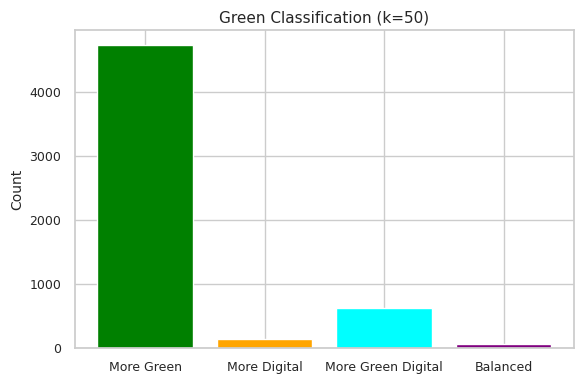

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import NearestNeighbors

# Parameters
k = 50
epsilon = 0.01
colors = {"more_green": "green", "more_digital": "orange", "balanced": "purple", "more_green_digital": "cyan"}

# Fit models
nn_G = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
nn_D = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
nn_GD = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

# Compute average distances to neighbors in G, D, and GD
avg_G = nn_G.kneighbors(normalized_G)[0].mean(axis=1)
avg_D = nn_D.kneighbors(normalized_G)[0].mean(axis=1)
avg_GD = nn_GD.kneighbors(normalized_G)[0].mean(axis=1)

# Assign labels based on distance comparisons
labels = np.where(
    avg_GD < np.minimum(avg_G, avg_D), 'more_green_digital',
    np.where(np.abs(avg_G - avg_D) < epsilon, 'balanced',
             np.where( avg_G< avg_D , 'more_green',
                      'more_digital'))
)

# Count label occurrences
counts = Counter(labels)
print(f"k={k}: {counts}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar([label.replace('_', ' ').title() for label in counts.keys()],
        counts.values(),
        color=[colors[l] for l in counts.keys()])
plt.ylabel('Count', fontsize=10)
plt.title(f'Green Classification (k={k})', fontsize=11)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()


k=50: Counter({'more_green': 4731, 'more_green_digital': 619, 'more_digital': 136, 'balanced': 64})


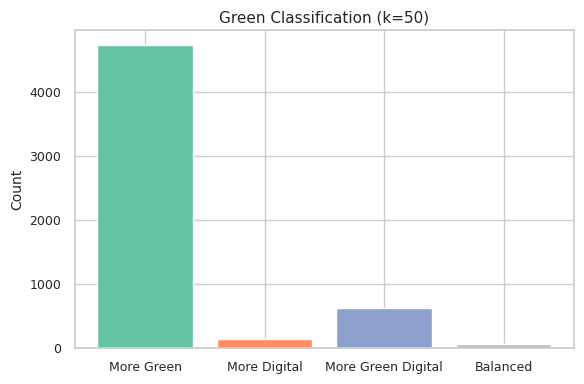

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.colors import to_hex
from sklearn.neighbors import NearestNeighbors

# Parameters
k = 50
epsilon = 0.01

# Define Set2-based custom colors
set2_colors = sns.color_palette("Set2", n_colors=3)
custom_palette = {
    'G': to_hex(set2_colors[0]),    # pastel green
    'D': to_hex(set2_colors[1]),    # pastel orange
    'GD': to_hex(set2_colors[2])    # pastel purple
}

# Final label color mapping
colors = {
    'more_green': custom_palette['G'],
    'more_digital': custom_palette['D'],
    'more_green_digital': custom_palette['GD'],
    'balanced': '#bdbdbd'  # light grey
}

# Fit models
nn_G = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
nn_D = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
nn_GD = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

# Compute average distances to neighbors in G, D, and GD
avg_G = nn_G.kneighbors(normalized_G)[0].mean(axis=1)
avg_D = nn_D.kneighbors(normalized_G)[0].mean(axis=1)
avg_GD = nn_GD.kneighbors(normalized_G)[0].mean(axis=1)

# Assign labels
labels = np.where(
    avg_GD < np.minimum(avg_G, avg_D), 'more_green_digital',
    np.where(np.abs(avg_G - avg_D) < epsilon, 'balanced',
             np.where(avg_G < avg_D, 'more_green', 'more_digital'))
)

# Count label occurrences
counts = Counter(labels)
print(f"k={k}: {counts}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar(
    [label.replace('_', ' ').title() for label in counts.keys()],
    counts.values(),
    color=[colors[label] for label in counts.keys()]
)
plt.ylabel('Count', fontsize=10)
plt.title(f'Green Classification (k={k})', fontsize=11)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()


In [ ]:
# --- Create DataFrame for further analysis ---
df_G = raw_data_G.copy()
df_G['distance_to_green'] = avg_G
df_G['distance_to_digital'] = avg_D
df_G['distance_to_gd'] = avg_GD
df_G['g_label_str'] = labels

# Optional: map string labels to numeric values
label_mapping = {'more_green': 0, 'more_digital': 1, 'balanced': 2, 'more_green_digital': 3}
df_G['g_label'] = df_G['g_label_str'].map(label_mapping)

df_G.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,g_label_str,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,The invention relates to a novel interconnecto...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,The invention relates in particular to a tank ...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,The invention provides a rechargeable battery ...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","A reactor and a method are disclosed, for the ...",230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,An aerated biofilm reactor fibre membrane comp...,357,0.4792,0.6090,0.5933,more_green,0


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


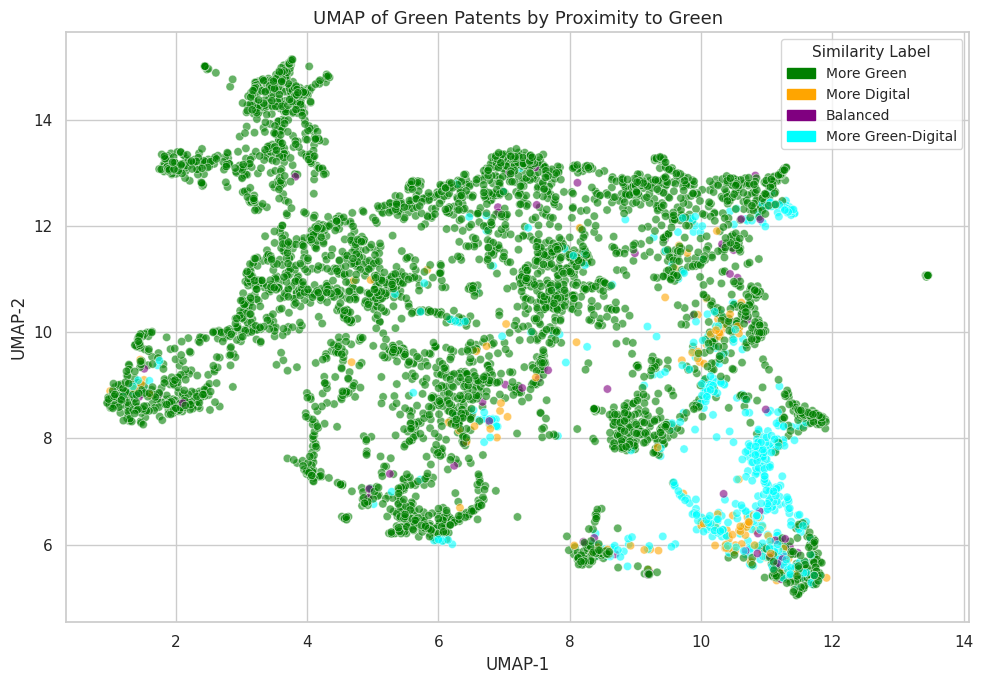

In [ ]:
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt

# Reduce the Green Digital embeddings to 2D using UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_G_2d = reducer.fit_transform(normalized_G)

# Build DataFrame for plotting
df_G_plot = pd.DataFrame({
    'x': X_G_2d[:, 0],
    'y': X_G_2d[:, 1],
    'label': df_G['g_label'].values,
    'label_str': df_G['g_label_str'].values  # For nicer legend labels
})

# Updated color palette for all 4 classes
palette = {
    0: 'green',   # more_green
    1: 'orange',  # more_digital
    2: 'purple',  # balanced
    3: 'cyan'     # more_green_digital
}

# Plot
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_G_plot,
    x='x', y='y',
    hue='label',
    palette=palette,
    alpha=0.6
)

# Optional: use custom legend with string labels
from matplotlib.patches import Patch
legend_labels = {
    0: "More Green",
    1: "More Digital",
    2: "Balanced",
    3: "More Green-Digital"
}
handles = [Patch(color=palette[i], label=legend_labels[i]) for i in sorted(palette)]
plt.legend(handles=handles, title="Similarity Label", fontsize=10, title_fontsize=11)

plt.title("UMAP of Green Patents by Proximity to Green", fontsize=13)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


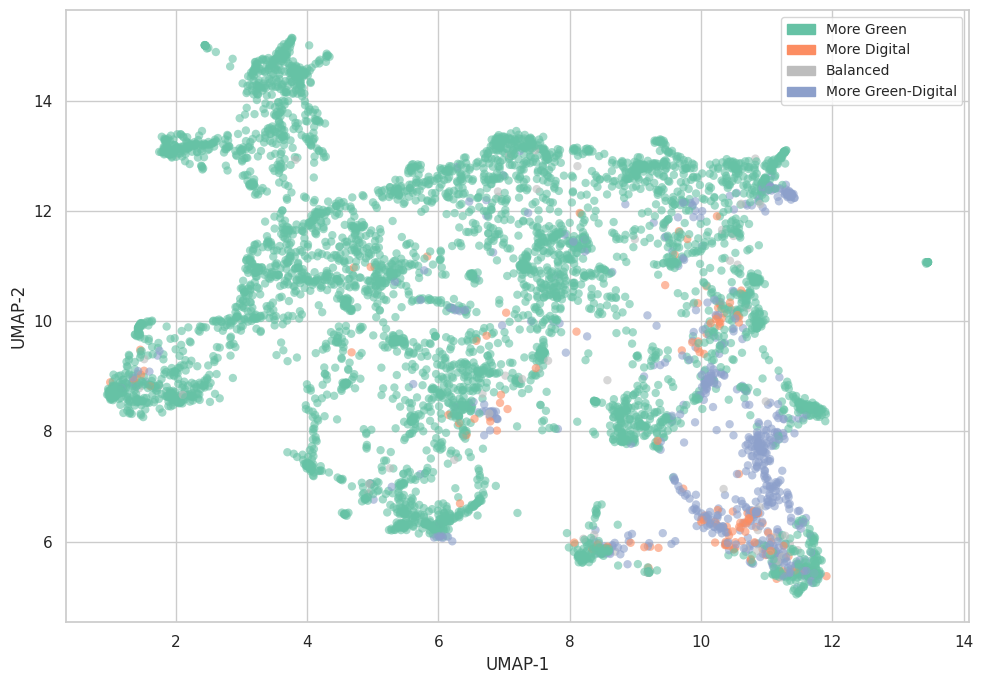

In [ ]:
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import to_hex

# Reduce the Green embeddings to 2D using UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_G_2d = reducer.fit_transform(normalized_G)

# Build DataFrame for plotting
df_G_plot = pd.DataFrame({
    'x': X_G_2d[:, 0],
    'y': X_G_2d[:, 1],
    'label': df_G['g_label'].values,
    'label_str': df_G['g_label_str'].values
})

# Custom pastel-style palette using seaborn Set2 + grey for balanced
set2_colors = sns.color_palette("Set2", n_colors=3)
palette = {
    0: to_hex(set2_colors[0]),  # More Green
    1: to_hex(set2_colors[1]),  # More Digital
    2: '#bdbdbd',               # Balanced (light grey)
    3: to_hex(set2_colors[2])   # More Green-Digital
}

# Plot
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_G_plot,
    x='x', y='y',
    hue='label',
    palette=palette,
    alpha=0.6,
    linewidth=0
)

# Custom legend
legend_labels = {
    0: "More Green",
    1: "More Digital",
    2: "Balanced",
    3: "More Green-Digital"
}
handles = [Patch(color=palette[i], label=legend_labels[i]) for i in sorted(palette)]
plt.legend(handles=handles, fontsize=10, title_fontsize=11)

#plt.title("UMAP of Green Patents by Proximity to Green", fontsize=13)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.show()


###DIGITAL

In [ ]:
from collections import Counter
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors

# Initialize results storage
label_stats = {}

# Loop over multiple k values
for k in [1, 5, 10, 20, 30, 50, 100, 200]:
    # Fit NearestNeighbors models
    nn_green = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
    nn_digital = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
    nn_gd = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

    # Compute average distances
    avg_dist_green = nn_green.kneighbors(normalized_D)[0].mean(axis=1)
    avg_dist_digital = nn_digital.kneighbors(normalized_D)[0].mean(axis=1)
    avg_dist_gd = nn_gd.kneighbors(normalized_D)[0].mean(axis=1)

    # Create a copy of the original data
    df_D_k = raw_data_D.copy()

    # Add distances to the DataFrame
    df_D_k['distance_to_green'] = avg_dist_green
    df_D_k['distance_to_digital'] = avg_dist_digital
    df_D_k['distance_to_gd'] = avg_dist_gd

    # Define "balanced" threshold
    epsilon = 0.01

    # Assign 4-way labels
    df_D_k['gd_label'] = np.where(
    avg_dist_gd < np.minimum(avg_dist_green, avg_dist_digital), 'more_green_digital',
    np.where(np.abs(avg_dist_green - avg_dist_digital) < epsilon, 'balanced',
             np.where(avg_dist_green < avg_dist_digital, 'more_green',
                      'more_digital'))
    )

    # Count and store label distribution
    label_counts = Counter(df_D_k['gd_label'])
    label_stats[k] = label_counts

    print(f"k={k}: {label_counts}")

k=1: Counter({'more_digital': 5550})
k=5: Counter({'more_digital': 5451, 'more_green_digital': 58, 'more_green': 22, 'balanced': 19})
k=10: Counter({'more_digital': 5248, 'more_green_digital': 196, 'more_green': 66, 'balanced': 40})
k=20: Counter({'more_digital': 5008, 'more_green_digital': 383, 'more_green': 111, 'balanced': 48})
k=30: Counter({'more_digital': 4878, 'more_green_digital': 488, 'more_green': 127, 'balanced': 57})
k=50: Counter({'more_digital': 4707, 'more_green_digital': 639, 'more_green': 147, 'balanced': 57})
k=100: Counter({'more_digital': 4535, 'more_green_digital': 806, 'more_green': 150, 'balanced': 59})
k=200: Counter({'more_digital': 4442, 'more_green_digital': 889, 'more_green': 153, 'balanced': 66})


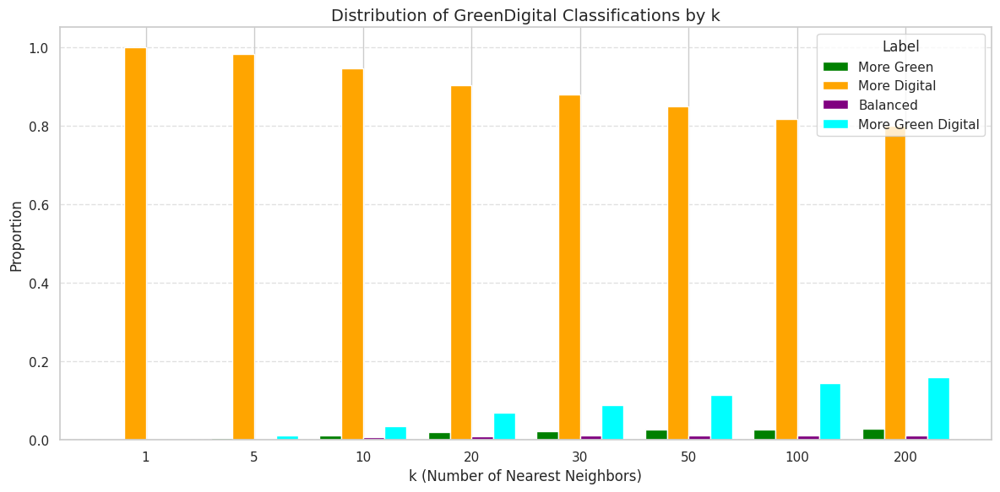

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract sorted k values and all possible labels
k_values = sorted(label_stats.keys())
all_labels = ['more_green', 'more_digital', 'balanced', 'more_green_digital']
colors = {
    'more_green': 'green',
    'more_digital': 'orange',
    'balanced': 'purple',
    'more_green_digital': 'cyan'
}

# Prepare bar heights for each label
counts_by_label = {label: [] for label in all_labels}
for k in k_values:
    total = sum(label_stats[k].values())
    for label in all_labels:
        count = label_stats[k].get(label, 0)
        counts_by_label[label].append(count / total)  # proportion

# Bar plot setup
x = np.arange(len(k_values))
bar_width = 0.2

fig, ax = plt.subplots(figsize=(12, 6))

for i, label in enumerate(all_labels):
    ax.bar(x + i * bar_width, counts_by_label[label], width=bar_width, label=label.replace('_', ' ').title(), color=colors[label])

# Formatting
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Distribution of GreenDigital Classifications by k', fontsize=14)
ax.set_xticks(x + 1.5 * bar_width)
ax.set_xticklabels(k_values)
ax.legend(title='Label')
ax.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

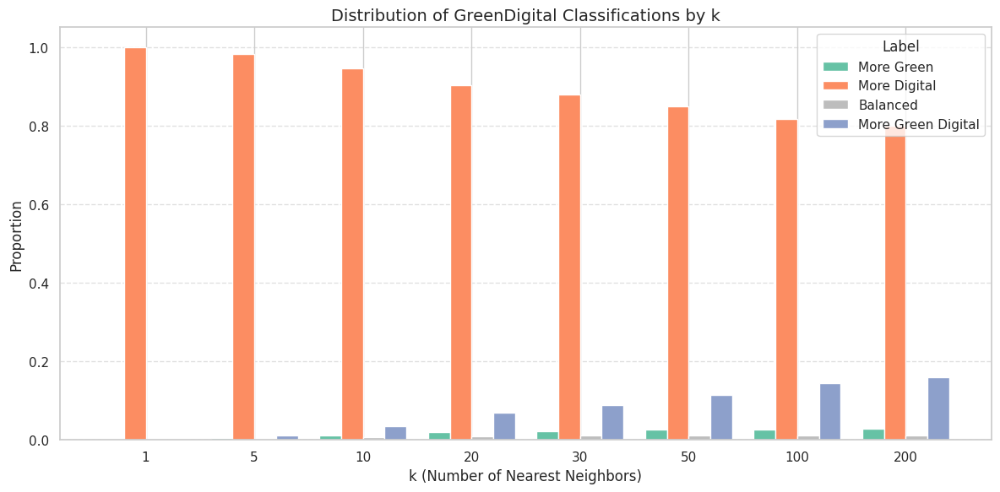

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract sorted k values and all possible labels
k_values = sorted(label_stats.keys())
all_labels = ['more_green', 'more_digital', 'balanced', 'more_green_digital']
colors = {
    'more_green': '#66c2a5',         # pastel green
    'more_digital': '#fc8d62',       # pastel orange
    'balanced': '#bdbdbd',           # light grey
    'more_green_digital': '#8da0cb'  # pastel bluish purple
}

# Prepare bar heights for each label
counts_by_label = {label: [] for label in all_labels}
for k in k_values:
    total = sum(label_stats[k].values())
    for label in all_labels:
        count = label_stats[k].get(label, 0)
        counts_by_label[label].append(count / total)  # proportion

# Bar plot setup
x = np.arange(len(k_values))
bar_width = 0.2

fig, ax = plt.subplots(figsize=(12, 6))

for i, label in enumerate(all_labels):
    ax.bar(x + i * bar_width, counts_by_label[label], width=bar_width,
           label=label.replace('_', ' ').title(), color=colors[label])

# Formatting
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Distribution of GreenDigital Classifications by k', fontsize=14)
ax.set_xticks(x + 1.5 * bar_width)
ax.set_xticklabels(k_values)
ax.legend(title='Label')
ax.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


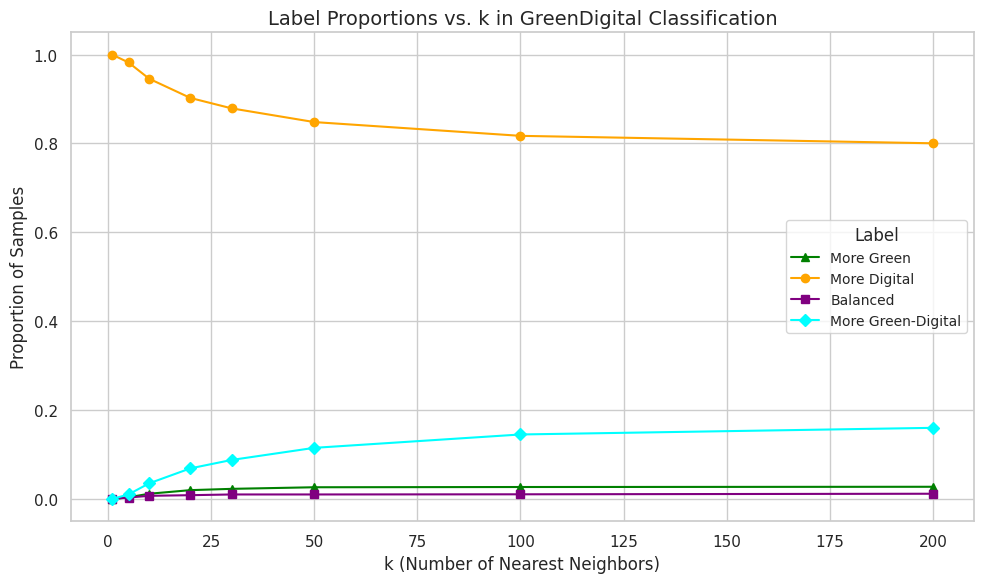

In [ ]:
import matplotlib.pyplot as plt

# Extract proportions from label_stats
k_values = sorted(label_stats.keys())
prop_green = []
prop_digital = []
prop_balanced = []
prop_green_digital = []

for k in k_values:
    counts = label_stats[k]
    total = sum(counts.values())
    prop_green.append(counts.get('more_green', 0) / total)
    prop_digital.append(counts.get('more_digital', 0) / total)
    prop_balanced.append(counts.get('balanced', 0) / total)
    prop_green_digital.append(counts.get('more_green_digital', 0) / total)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_values, prop_green, marker='^', label='More Green', color='green')
ax.plot(k_values, prop_digital, marker='o', label='More Digital', color='orange')
ax.plot(k_values, prop_balanced, marker='s', label='Balanced', color='purple')
ax.plot(k_values, prop_green_digital, marker='D', label='More Green-Digital', color='cyan')

# Customize
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion of Samples', fontsize=12)
ax.set_title('Label Proportions vs. k in GreenDigital Classification', fontsize=14)
ax.legend(title='Label', fontsize=10)
ax.grid(True)
plt.tight_layout()
plt.show()

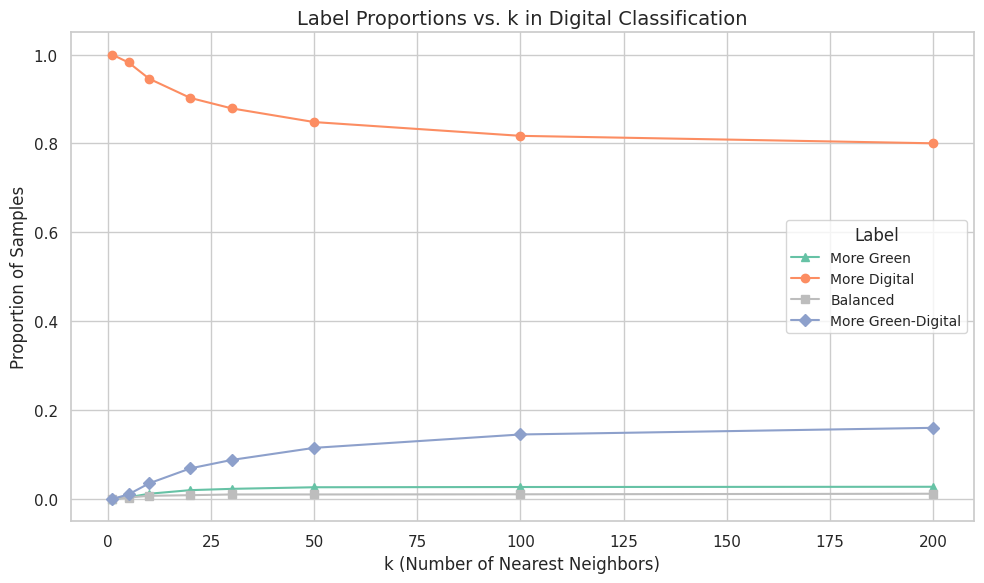

In [ ]:
import matplotlib.pyplot as plt

# Extract proportions from label_stats
k_values = sorted(label_stats.keys())
prop_green = []
prop_digital = []
prop_balanced = []
prop_green_digital = []

for k in k_values:
    counts = label_stats[k]
    total = sum(counts.values())
    prop_green.append(counts.get('more_green', 0) / total)
    prop_digital.append(counts.get('more_digital', 0) / total)
    prop_balanced.append(counts.get('balanced', 0) / total)
    prop_green_digital.append(counts.get('more_green_digital', 0) / total)

# Color palette
colors = {
    'more_green': '#66c2a5',
    'more_digital': '#fc8d62',
    'balanced': '#bdbdbd',
    'more_green_digital': '#8da0cb'
}

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_values, prop_green, marker='^', label='More Green', color=colors['more_green'])
ax.plot(k_values, prop_digital, marker='o', label='More Digital', color=colors['more_digital'])
ax.plot(k_values, prop_balanced, marker='s', label='Balanced', color=colors['balanced'])
ax.plot(k_values, prop_green_digital, marker='D', label='More Green-Digital', color=colors['more_green_digital'])

# Customize
ax.set_xlabel('k (Number of Nearest Neighbors)', fontsize=12)
ax.set_ylabel('Proportion of Samples', fontsize=12)
ax.set_title('Label Proportions vs. k in Digital Classification', fontsize=14)
ax.legend(title='Label', fontsize=10)
ax.grid(True)
plt.tight_layout()
plt.show()


k=50: Counter({'more_digital': 4707, 'more_green_digital': 639, 'more_green': 147, 'balanced': 57})


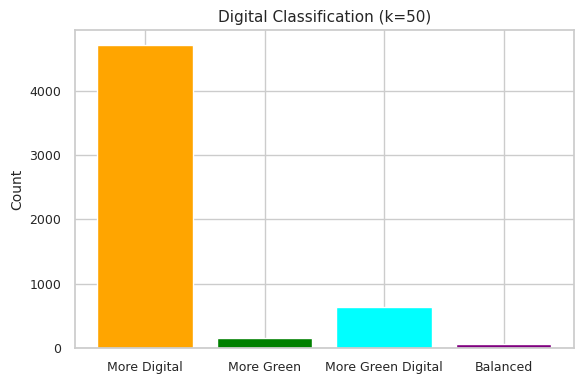

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import NearestNeighbors

# Parameters
k = 50
epsilon = 0.01
colors = {"more_green": "green", "more_digital": "orange", "balanced": "purple", "more_green_digital": "cyan"}

# Fit models
nn_G = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
nn_D = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
nn_GD = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

# Compute average distances to neighbors in G, D, and GD
avg_G = nn_G.kneighbors(normalized_D)[0].mean(axis=1)
avg_D = nn_D.kneighbors(normalized_D)[0].mean(axis=1)
avg_GD = nn_GD.kneighbors(normalized_D)[0].mean(axis=1)

# Assign labels based on distance comparisons
labels = np.where(
    avg_GD < np.minimum(avg_G, avg_D), 'more_green_digital',
    np.where(np.abs(avg_G - avg_D) < epsilon, 'balanced',
             np.where( avg_G< avg_D , 'more_green',
                      'more_digital'))
)

# Count label occurrences
counts = Counter(labels)
print(f"k={k}: {counts}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar([label.replace('_', ' ').title() for label in counts.keys()],
        counts.values(),
        color=[colors[l] for l in counts.keys()])
plt.ylabel('Count', fontsize=10)
plt.title(f'Digital Classification (k={k})', fontsize=11)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()


k=50: Counter({'more_digital': 4707, 'more_green_digital': 639, 'more_green': 147, 'balanced': 57})


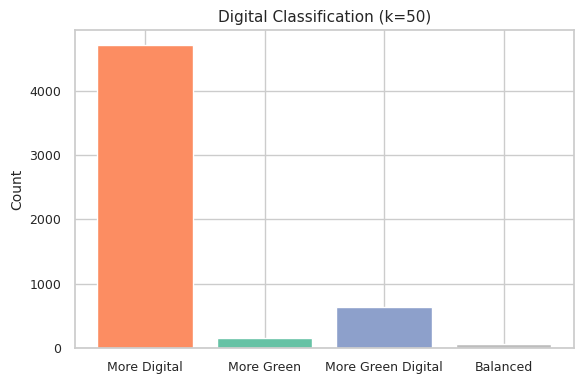

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import NearestNeighbors

# Parameters
k = 50
epsilon = 0.01
colors = {
    "more_green": "#66c2a5",
    "more_digital": "#fc8d62",
    "balanced": "#bdbdbd",
    "more_green_digital": "#8da0cb"
}

# Fit models
nn_G = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_G)
nn_D = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_D)
nn_GD = NearestNeighbors(n_neighbors=k, metric='cosine').fit(normalized_GD)

# Compute average distances to neighbors in G, D, and GD
avg_G = nn_G.kneighbors(normalized_D)[0].mean(axis=1)
avg_D = nn_D.kneighbors(normalized_D)[0].mean(axis=1)
avg_GD = nn_GD.kneighbors(normalized_D)[0].mean(axis=1)

# Assign labels based on distance comparisons
labels = np.where(
    avg_GD < np.minimum(avg_G, avg_D), 'more_green_digital',
    np.where(np.abs(avg_G - avg_D) < epsilon, 'balanced',
             np.where(avg_G < avg_D, 'more_green', 'more_digital'))
)

# Count label occurrences
counts = Counter(labels)
print(f"k={k}: {counts}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar([label.replace('_', ' ').title() for label in counts.keys()],
        counts.values(),
        color=[colors[l] for l in counts.keys()])
plt.ylabel('Count', fontsize=10)
plt.title(f'Digital Classification (k={k})', fontsize=11)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()


In [ ]:
# --- Create DataFrame for further analysis ---
df_D = raw_data_D.copy()
df_D['distance_to_green'] = avg_G
df_D['distance_to_digital'] = avg_D
df_D['distance_to_gd'] = avg_GD
df_D['d_label_str'] = labels

# Optional: map string labels to numeric values
label_mapping = {'more_green': 0, 'more_digital': 1, 'balanced': 2, 'more_green_digital': 3}
df_D['d_label'] = df_D['d_label_str'].map(label_mapping)

df_D.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,d_label_str,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,Systems and methods for positioning a cut guid...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...","Method and system for automatically detecting,...",156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,A system includes circuitry for cryptographic ...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,According to an example aspect of the present ...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,A system for providing security functions to a...,93,0.5503,0.4318,0.4594,more_digital,1


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


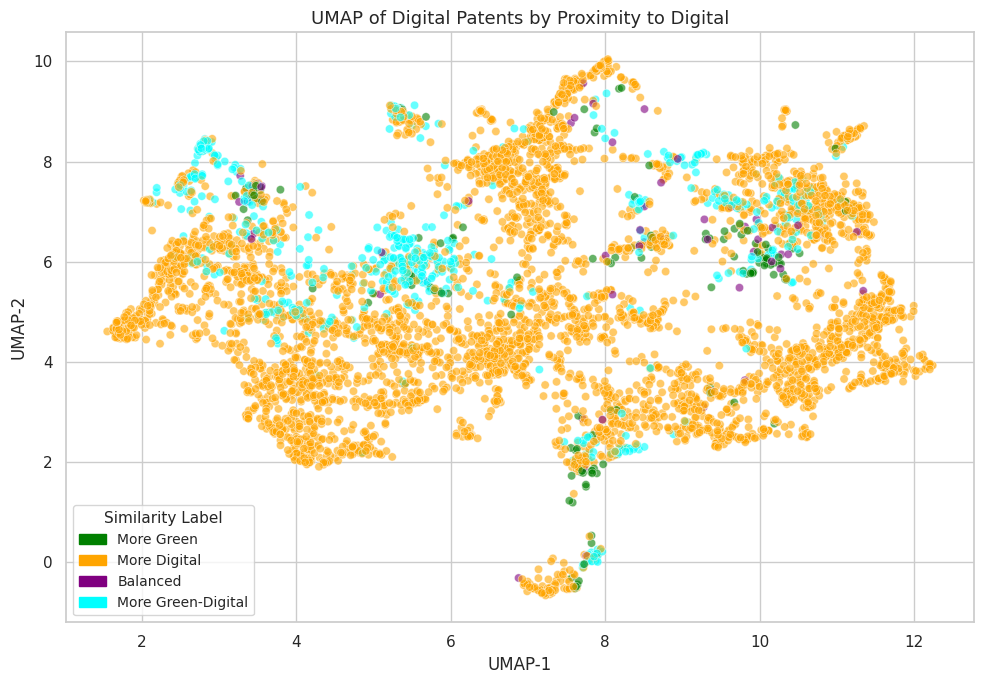

In [ ]:
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt

# Reduce the Green Digital embeddings to 2D using UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_D_2d = reducer.fit_transform(normalized_D)

# Build DataFrame for plotting
df_D_plot = pd.DataFrame({
    'x': X_D_2d[:, 0],
    'y': X_D_2d[:, 1],
    'label': df_D['d_label'].values,
    'label_str': df_D['d_label_str'].values  # For nicer legend labels
})

# Updated color palette for all 4 classes
palette = {
    0: 'green',   # more_green
    1: 'orange',  # more_digital
    2: 'purple',  # balanced
    3: 'cyan'     # more_green_digital
}

# Plot
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_D_plot,
    x='x', y='y',
    hue='label',
    palette=palette,
    alpha=0.6
)

# Optional: use custom legend with string labels
from matplotlib.patches import Patch
legend_labels = {
    0: "More Green",
    1: "More Digital",
    2: "Balanced",
    3: "More Green-Digital"
}
handles = [Patch(color=palette[i], label=legend_labels[i]) for i in sorted(palette)]
plt.legend(handles=handles, title="Similarity Label", fontsize=10, title_fontsize=11)

plt.title("UMAP of Digital Patents by Proximity to Digital", fontsize=13)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


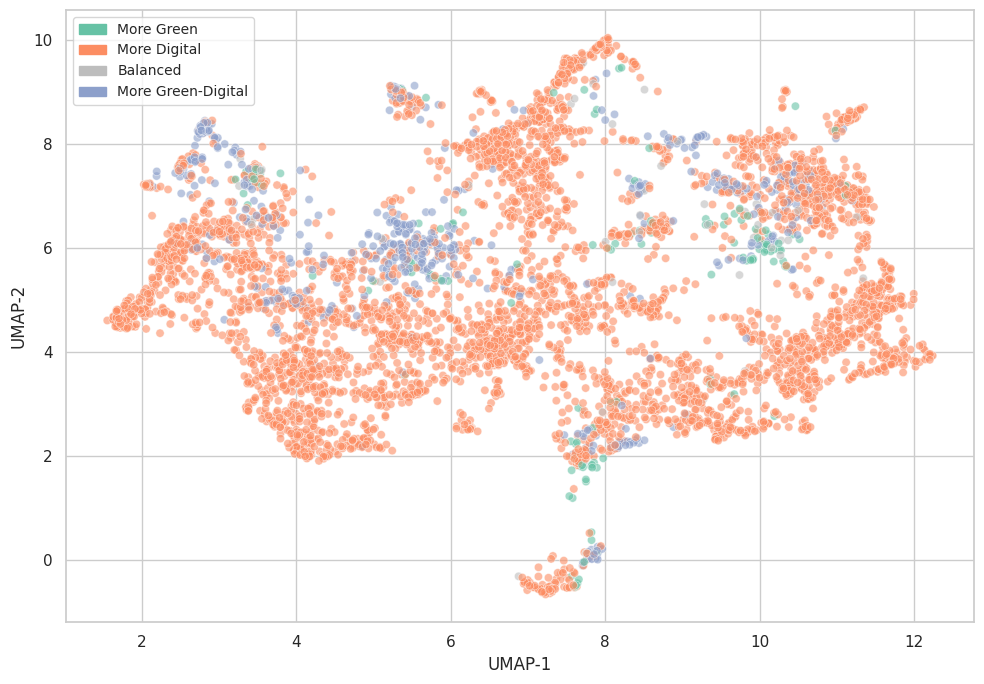

In [ ]:
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Reduce the Digital embeddings to 2D using UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_D_2d = reducer.fit_transform(normalized_D)

# Build DataFrame for plotting
df_D_plot = pd.DataFrame({
    'x': X_D_2d[:, 0],
    'y': X_D_2d[:, 1],
    'label': df_D['d_label'].values,
    'label_str': df_D['d_label_str'].values  # For nicer legend labels
})

# Refined pastel color palette for 4 classes
palette = {
    0: "#66c2a5",   # More Green
    1: "#fc8d62",   # More Digital
    2: "#bdbdbd",   # Balanced
    3: "#8da0cb"    # More Green-Digital
}

# Plot
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_D_plot,
    x='x', y='y',
    hue='label',
    palette=palette,
    alpha=0.6
)

# Custom legend
legend_labels = {
    0: "More Green",
    1: "More Digital",
    2: "Balanced",
    3: "More Green-Digital"
}
handles = [Patch(color=palette[i], label=legend_labels[i]) for i in sorted(palette)]
plt.legend(handles=handles, fontsize=10, title_fontsize=11)

#plt.title("UMAP of Digital Patents by Proximity to Digital", fontsize=13)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.show()


#Figure 7

In [ ]:
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.colors import to_hex

# Step 1: UMAP reduction
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_2d = reducer.fit_transform(normalized_U)

# Step 2: Create plotting DataFrame
df_plot = pd.DataFrame({
    'x': X_2d[:, 0],
    'y': X_2d[:, 1],
    'source': df_r['source'].values,  # G, D, or GD
    'label': df_r['label'].values     # Assume this exists and is categorical
})

# Step 3: Set up subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

# Define categories
sources = ['G', 'D', 'GD']
titles = ['Green Patents', 'Digital Patents', 'Green-Digital Patents']

# Step 4: Plot by source, color by label
for ax, src, title in zip(axs, sources, titles):
    subset = df_plot[df_plot['source'] == src]
    sns.scatterplot(
        data=subset,
        x='x', y='y',
        hue='label',
        palette='Set2',  # You can define a custom palette here
        alpha=0.6,
        ax=ax,
        legend=False  # Suppress repeated legends
    )
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('')

# Optional: Add a shared legend from the first subplot
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=len(set(df_plot['label'])))

# Layout adjustments
plt.tight_layout(rect=[0, 0, 1, 0.92])
#plt.suptitle('UMAP Projection of Patent Embeddings Colored by Label', fontsize=18)
plt.show()


#Clustering HDBSCAN

In [ ]:
import hdbscan

# Use normalized embeddings of all your documents (not just centroids)
all_embeddings = np.vstack([normalized_D, normalized_G, normalized_GD])

# Optional: build a label array if you want to track types
labels = (['D'] * len(normalized_D) +
          ['G'] * len(normalized_G) +
          ['GD'] * len(normalized_GD))

# Run HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=30, min_samples=10, metric='euclidean')
cluster_labels = clusterer.fit_predict(normalized_U)

# Analyze clusters
import pandas as pd
df = pd.DataFrame({'label': cluster_labels, 'category': labels})
print(df.groupby(['label', 'category']).size().unstack(fill_value=0))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
# Group and create the table
table = df.groupby(['label', 'category']).size().unstack(fill_value=0)

# Convert to a clean text table
print(table.to_string())

category     D     G    GD
label                     
-1        5061  5219  5023
 0           0    17    27
 1         100    24    57
 2          12     1    20
 3           0    71     3
 4         104     0   121
 5          65     1     9
 6           7   120    21
 7          41     0     2
 8         129     0     7
 9           4    72    91
 10          0    25    10
 11         16     0    33
 12         11     0   126


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


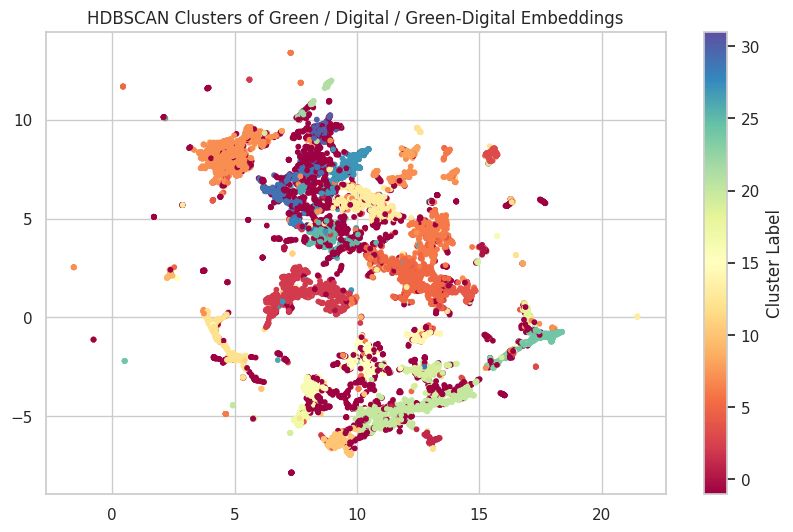

In [ ]:
import umap
import matplotlib.pyplot as plt

# Reduce to 2D for plotting
reducer = umap.UMAP(n_neighbors=5, min_dist=0.01)
embedding_2d = reducer.fit_transform(normalized_U)

plt.figure(figsize=(10, 6))
plt.scatter(embedding_2d[:, 0], embedding_2d[:, 1], c=cluster_labels, cmap='Spectral', s=10)
plt.title('HDBSCAN Clusters of Green / Digital / Green-Digital Embeddings')
plt.colorbar(label='Cluster Label')
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


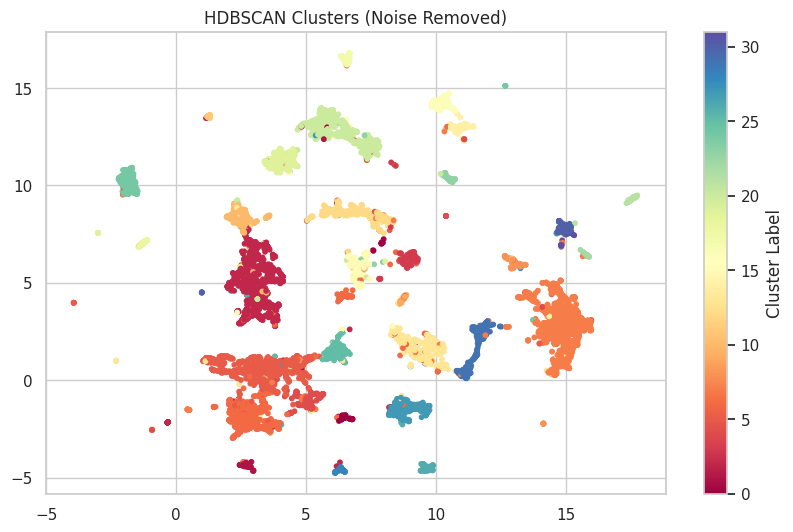

In [ ]:
import umap
import matplotlib.pyplot as plt
import numpy as np

# Filter out noise
mask = cluster_labels != -1
filtered_embeddings = normalized_U[mask]
filtered_labels = cluster_labels[mask]

# UMAP for 2D projection
reducer = umap.UMAP(n_neighbors=5, min_dist=0.01, metric='cosine')
embedding_2d = reducer.fit_transform(filtered_embeddings)

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(
    embedding_2d[:, 0], embedding_2d[:, 1],
    c=filtered_labels, cmap='Spectral', s=10
)
plt.title('HDBSCAN Clusters (Noise Removed)')
plt.colorbar(label='Cluster Label')
plt.show()


In [ ]:
import hdbscan

# Use normalized embeddings of all your documents (not just centroids)
all_embeddings = np.vstack([normalized_G, normalized_D, normalized_GD])

# Optional: build a label array if you want to track types
labels = (['G'] * len(normalized_G) +
          ['D'] * len(normalized_D) +
          ['GD'] * len(normalized_GD))

# Run HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=15, min_samples=5, metric='euclidean')
cluster_labels = clusterer.fit_predict(normalized_U)

# Analyze clusters
import pandas as pd
df = pd.DataFrame({'label': cluster_labels, 'category': labels})
print(df.groupby(['label', 'category']).size().unstack(fill_value=0))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


category     D     G    GD
label                     
-1        4921  5042  4829
 0          14     0     1
 1          13     1     1
 2          15     1     1
 3           0    24     3
 4          20     0     0
 5          29     2     3
 6           1     1    17
 7          10     0     5
 8          21     0     4
 9           0    17     5
 10          1     7    25
 11          0    18     2
 12         13     3    12
 13          0     1    17
 14        144    24    66
 15          0   136     3
 16          0    15    24
 17          0    16    17
 18         14     0    15
 19          0    18     9
 20          1    15    34
 21          3     1    17
 22          4     6     5
 23          8   111    26
 24         20     0     1
 25         72     0   115
 26         31     1     7
 27         22     0     0
 28          0     1    16
 29         48     0     2
 30         71     0     1
 31         27     0     0
 32          0    30    22
 33         17     0    36
 

In [ ]:
# Group and create the table
table = df.groupby(['label', 'category']).size().unstack(fill_value=0)

# Convert to a clean text table
print(table.to_string())

category     D     G    GD
label                     
-1        4921  5042  4829
 0          14     0     1
 1          13     1     1
 2          15     1     1
 3           0    24     3
 4          20     0     0
 5          29     2     3
 6           1     1    17
 7          10     0     5
 8          21     0     4
 9           0    17     5
 10          1     7    25
 11          0    18     2
 12         13     3    12
 13          0     1    17
 14        144    24    66
 15          0   136     3
 16          0    15    24
 17          0    16    17
 18         14     0    15
 19          0    18     9
 20          1    15    34
 21          3     1    17
 22          4     6     5
 23          8   111    26
 24         20     0     1
 25         72     0   115
 26         31     1     7
 27         22     0     0
 28          0     1    16
 29         48     0     2
 30         71     0     1
 31         27     0     0
 32          0    30    22
 33         17     0    36
 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


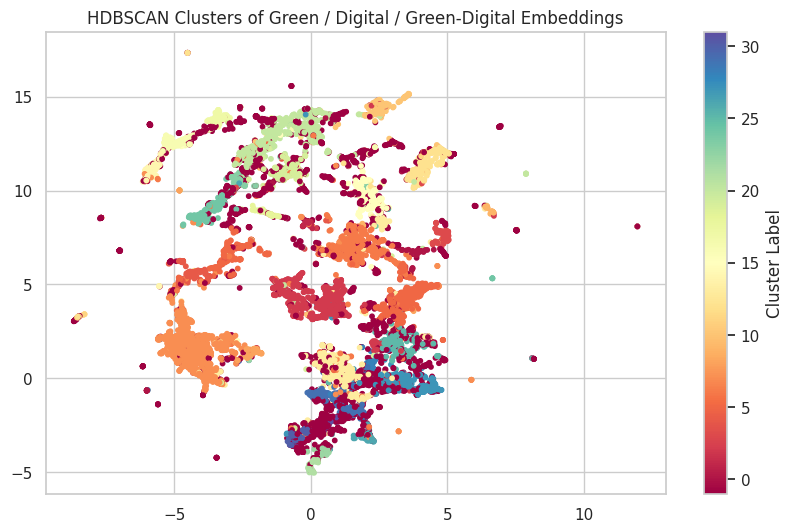

In [ ]:
import umap
import matplotlib.pyplot as plt

# Reduce to 2D for plotting
reducer = umap.UMAP(n_neighbors=5, min_dist=0.01)
embedding_2d = reducer.fit_transform(normalized_U)

plt.figure(figsize=(10, 6))
plt.scatter(embedding_2d[:, 0], embedding_2d[:, 1], c=cluster_labels, cmap='Spectral', s=10)
plt.title('HDBSCAN Clusters of Green / Digital / Green-Digital Embeddings')
plt.colorbar(label='Cluster Label')
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


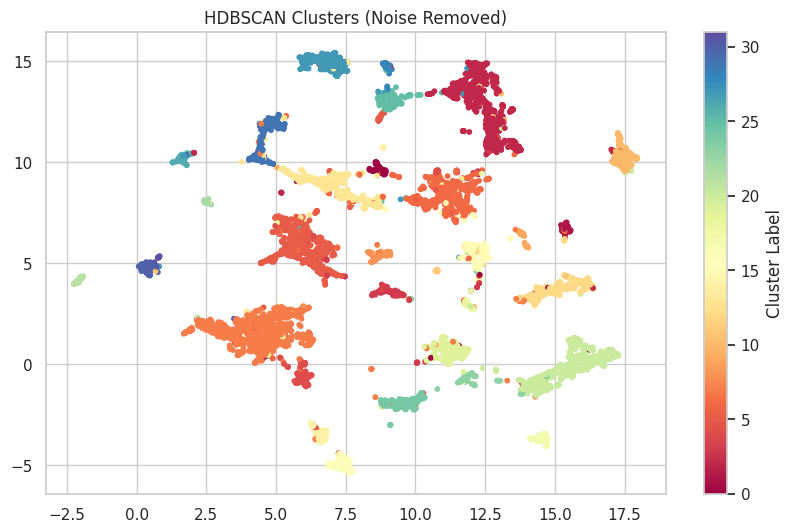

In [ ]:
import umap
import matplotlib.pyplot as plt
import numpy as np

# Filter out noise
mask = cluster_labels != -1
filtered_embeddings = normalized_U[mask]
filtered_labels = cluster_labels[mask]

# UMAP for 2D projection
reducer = umap.UMAP(n_neighbors=5, min_dist=0.01, metric='cosine')
embedding_2d = reducer.fit_transform(filtered_embeddings)

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(
    embedding_2d[:, 0], embedding_2d[:, 1],
    c=filtered_labels, cmap='Spectral', s=10
)
plt.title('HDBSCAN Clusters (Noise Removed)')
plt.colorbar(label='Cluster Label')
plt.show()

In [ ]:
import umap
reducer = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=15, metric='cosine')
reduced = reducer.fit_transform(all_embeddings)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
import hdbscan

# Run HDBSCAN on the reduced data
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=150,     # try 10–30 depending on your needs
    min_samples=5,           # adjust to control strictness
    metric='euclidean'       # UMAP output is in Euclidean space
)

cluster_labels = clusterer.fit_predict(reduced)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
import pandas as pd

df = pd.DataFrame({
    'label': cluster_labels,
    'category': labels  # This is the ground-truth list you created earlier
})

print(df.groupby(['label', 'category']).size().unstack(fill_value=0))

category     D    G    GD
label                    
-1        1135  826   758
 0          91   46   146
 1         117   48    83
 2          70  420   200
 3           5   97   151
 4           7  102    83
 5          67  301  1464
 6        1002   49   265
 7          20  353    21
 8          53  344    83
 9           0  217    26
 10          1  197    49
 11          2  304    19
 12         27  339    71
 13         26   80    58
 14          1  170    15
 15          2  204   199
 16          8  373    58
 17         13  512    46
 18         69    2   123
 19        149   57   376
 20        104    0    52
 21        581   16    71
 22          8  126    23
 23        158    2    14
 24        227    5    21
 25        551   68   242
 26        434   23   323
 27        154    1    36
 28         83   42   175
 29        212    1    84
 30        173  225   215


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


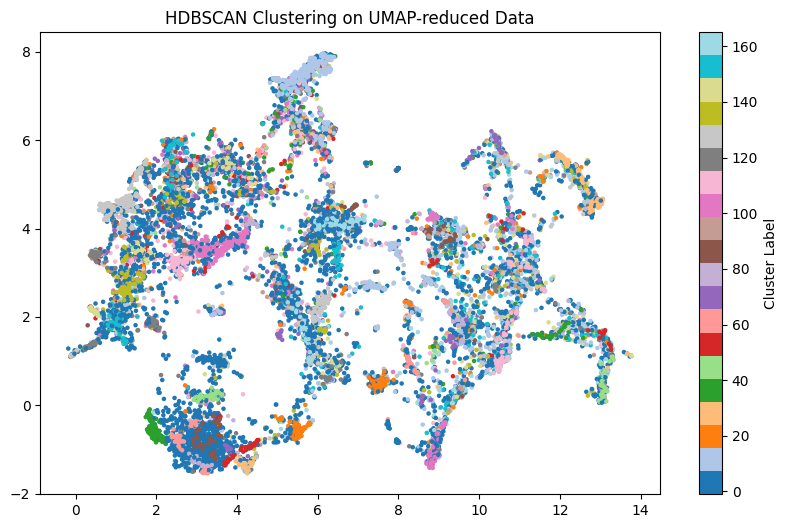

In [ ]:
reducer_2d = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=2, metric='cosine')
reduced_2d = reducer_2d.fit_transform(normalized_U)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(reduced_2d[:, 0], reduced_2d[:, 1], c=cluster_labels, cmap='tab20', s=5)
plt.title("HDBSCAN Clustering on UMAP-reduced Data")
plt.colorbar(label='Cluster Label')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

# Define ranges of parameters to test
min_cluster_sizes = [10, 20, 30, 40, 50, 100, 150, 200, 300, 500, 600, 800]
min_samples_values = [1, 5, 10, 15]
metrics = ['euclidean']

best_score = -1
best_params = None

for min_cluster_size in min_cluster_sizes:
    for min_samples in min_samples_values:
        for metric in metrics:
            # Run HDBSCAN
            clusterer = hdbscan.HDBSCAN(
                min_cluster_size=min_cluster_size,
                min_samples=min_samples,
                metric=metric
            )
            cluster_labels = clusterer.fit_predict(reduced)

            # Calculate silhouette score
            valid_labels = cluster_labels[cluster_labels != -1]
            valid_embeddings = reduced[cluster_labels != -1]
            if len(valid_labels) > 1:  # Avoid silhouette score error with single cluster
                score = silhouette_score(valid_embeddings, valid_labels)

                # Check if it's the best score
                if score > best_score:
                    best_score = score
                    best_params = (min_cluster_size, min_samples, metric)

print(f"Best Parameters: {best_params} with Silhouette Score: {best_score}")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

Best Parameters: (30, 15, 'euclidean') with Silhouette Score: 0.597952663898468


In [ ]:
import umap
reducer = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=15, metric='cosine')
reduced = reducer.fit_transform(normalized_U)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
import hdbscan

# Run HDBSCAN on the reduced data
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=40,     # try 10–30 depending on your needs
    min_samples=15,           # adjust to control strictness
    metric='euclidean'       # UMAP output is in Euclidean space
)

cluster_labels = clusterer.fit_predict(reduced)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
import pandas as pd

df = pd.DataFrame({
    'label': cluster_labels,
    'category': labels  # This is the ground-truth list you created earlier
})

print(df.groupby(['label', 'category']).size().unstack(fill_value=0))

category     D     G   GD
label                    
-1        1473  1218  971
 0          10     2   30
 1          27    26   62
 2           5    98   86
 3           5    97  154
...        ...   ...  ...
 57         42     0    5
 58         43     0    3
 59         76     1   14
 60         71     2   22
 61         32     1   12

[63 rows x 3 columns]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


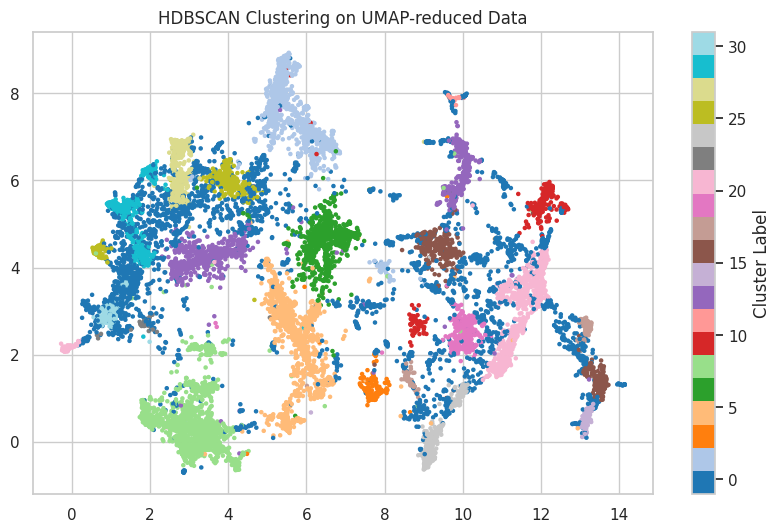

In [ ]:
reducer_2d = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=2, metric='cosine')
reduced_2d = reducer_2d.fit_transform(normalized_U)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(reduced_2d[:, 0], reduced_2d[:, 1], c=cluster_labels, cmap='tab20', s=5)
plt.title("HDBSCAN Clustering on UMAP-reduced Data")
plt.colorbar(label='Cluster Label')
plt.show()

In [ ]:
normalized_U.shape

(16650, 768)

In [ ]:
from sklearn.decomposition import PCA
import umap
import hdbscan
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 3: UMAP on PCA-reduced embeddings
reducer = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=15, metric='cosine', random_state=42)
reduced = reducer.fit_transform(normalized_U)

# Step 4: HDBSCAN Grid Search
min_cluster_sizes = [10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100]
min_samples_values = [5, 10, 15, 20, 25, 30, 40, 50, 60, 70, 80,90, 100]
metrics = ['euclidean']

best_score = -1
best_params = None
best_labels = None

for min_cluster_size in min_cluster_sizes:
    for min_samples in min_samples_values:
        for metric in metrics:
            clusterer = hdbscan.HDBSCAN(
                min_cluster_size=min_cluster_size,
                min_samples=min_samples,
                metric=metric
            )
            cluster_labels = clusterer.fit_predict(reduced)

            valid_labels = cluster_labels[cluster_labels != -1]
            valid_embeddings = reduced[cluster_labels != -1]

            if len(valid_labels) > 1:
                score = silhouette_score(valid_embeddings, valid_labels)
                if score > best_score:
                    best_score = score
                    best_params = (min_cluster_size, min_samples, metric)
                    best_labels = cluster_labels

print(f"Best Parameters: {best_params} with Silhouette Score: {best_score}")

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Best Parameters: (15, 90, 'euclidean') with Silhouette Score: 0.6173049211502075


In [ ]:
import umap
import hdbscan
from sklearn.metrics import silhouette_score
import numpy as np

# Assuming normalized_U is your input data matrix (already normalized embeddings)

# Step 1: UMAP dimensionality reduction (same as your original)
reducer = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=15, metric='cosine', random_state=42)
reduced = reducer.fit_transform(normalized_U)

# Step 2: HDBSCAN clustering with fixed parameters
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=10,
    min_samples=100,
    metric='euclidean'
)

cluster_labels = clusterer.fit_predict(reduced)

# Filter out noise points (-1 label) for silhouette score calculation
valid_labels = cluster_labels[cluster_labels != -1]
valid_embeddings = reduced[cluster_labels != -1]

if len(valid_labels) > 1:
    score = silhouette_score(valid_embeddings, valid_labels, metric='euclidean')
    print(f"Silhouette Score with fixed params (min_cluster_size=10, min_samples=100, metric='euclidean'): {score:.4f}")
else:
    print("Not enough clusters for silhouette score calculation.")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Silhouette Score with fixed params (min_cluster_size=10, min_samples=100, metric='euclidean'): 0.5883


Cluster Majority Category: 
 label
0     GD
1      G
2     GD
3     GD
4     GD
5      D
6      D
7      G
8      D
9      D
10     G
11     D
12     D
13     G
14    GD
15     G
16     G
17     G
18     G
19    GD
20     G
21    GD
22     G
23     G
24    GD
25     D
26     D
27     D
28     D
29     D
30     G
31    GD
32     D
Name: category, dtype: object

Cluster Category Distribution: 
 category    D    G    GD
label                   
0           5   94   153
1           5   99    83
2          72  284  1445
3          82   41   112
4          27   27    61
5          69    6    45
6         992   46   266
7          23  349    18
8         506   45   411
9         615  240   300
10         62  335   191
11         65    1     8
12         87   10    11
13         40  290    56
14         23   49    52
15          1  168    35
16          2  252    16
17          0  149    16
18         21  318    59
19        149   55   394
20          1  142    10
21          3  196   198
22  

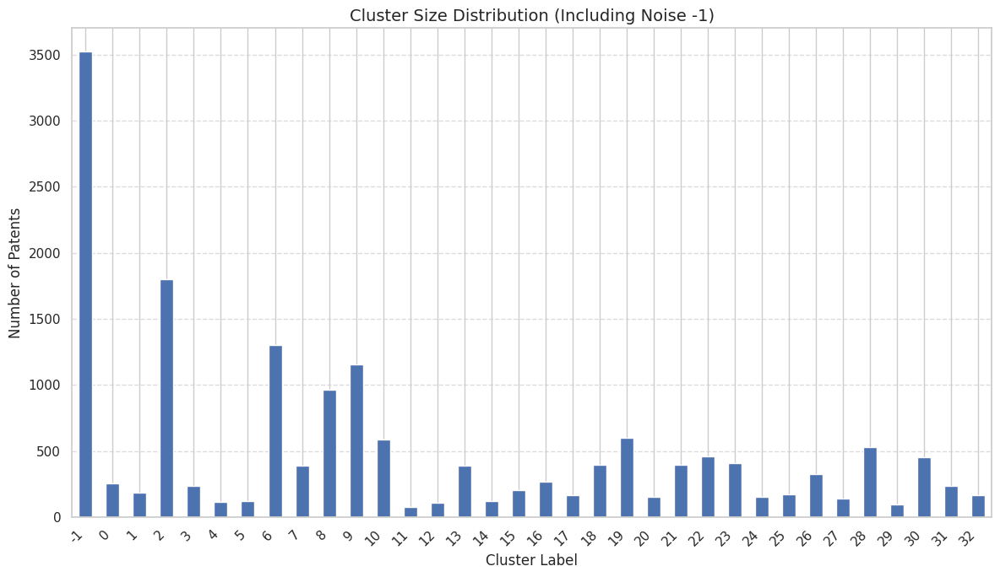

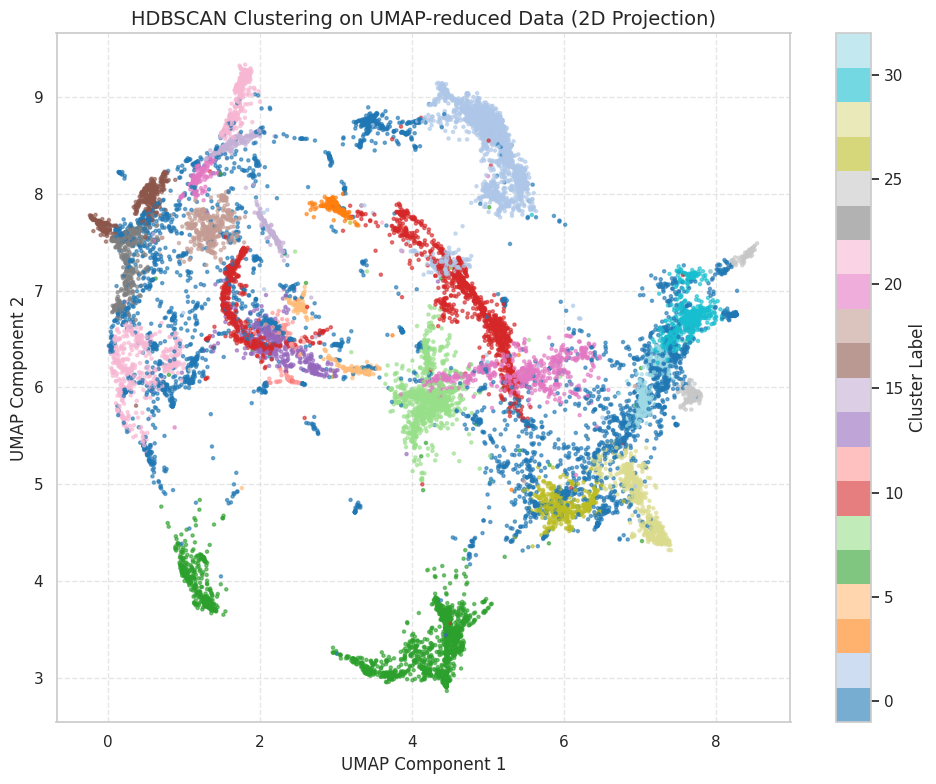

In [ ]:
# Now with the best parameters, evaluate the clusters:
# 1. **Purity**: Cluster purity to evaluate how well each cluster corresponds to categories
# Use the 'source' column from the original DataFrame 'df' which matches the size of embeddings
df_eval = pd.DataFrame({'label': best_labels, 'category': df['source'].values})

# Filter out noise points (-1) for purity calculation if needed, or include them if the definition allows
# For simplicity, let's calculate purity for points *assigned* to a cluster (label != -1)
df_eval_clustered = df_eval[df_eval['label'] != -1]

if not df_eval_clustered.empty:
    # Calculate purity: For each cluster label, find the most frequent category
    purity_counts = df_eval_clustered.groupby('label')['category'].apply(lambda x: x.mode()[0])
    print("Cluster Majority Category: \n", purity_counts)

    # Optionally, count how many in each cluster belong to the majority category
    # and the total size to get a percentage purity per cluster
    cluster_category_counts = df_eval_clustered.groupby(['label', 'category']).size().unstack(fill_value=0)
    print("\nCluster Category Distribution: \n", cluster_category_counts)

else:
    print("No points assigned to clusters (all labeled as -1). Cannot calculate purity.")


# 2. **Cluster Size Distribution**: Visualize the number of points in each cluster
cluster_sizes = pd.Series(best_labels).value_counts().sort_index() # Sort by label for cleaner plot

# Plot the distribution of cluster sizes
plt.figure(figsize=(12, 7)) # Increased figure size for potentially many clusters
cluster_sizes.plot(kind='bar')
plt.title("Cluster Size Distribution (Including Noise -1)", fontsize=14)
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Number of Patents", fontsize=12)
plt.xticks(rotation=45, ha='right') # Rotate labels for readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 3. **Cluster Visualization**: Visualize the clusters in 2D using the *first two* UMAP components
# Ensure 'reduced' has at least 2 dimensions.
if reduced.shape[1] >= 2:
    plt.figure(figsize=(10, 8))
    # Using the first two components of 'reduced' from the best_params UMAP
    scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=best_labels, cmap='tab20', s=5, alpha=0.6)
    plt.colorbar(label='Cluster Label')
    plt.title("HDBSCAN Clustering on UMAP-reduced Data (2D Projection)", fontsize=14)
    plt.xlabel("UMAP Component 1", fontsize=12)
    plt.ylabel("UMAP Component 2", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
else:
    print("UMAP was reduced to less than 2 dimensions. Cannot create a 2D scatter plot.")

Cluster Majority Category: 
 label
0      D
1     GD
2     GD
3      D
4      D
5      D
6      G
7      G
8      G
9     GD
10    GD
11     D
12     D
13     G
14    GD
15     G
16     G
17     D
18     G
19     G
20     G
21     G
22     G
23     G
24     G
25     G
26     G
27    GD
28     D
29     D
30     D
31     D
32     D
33    GD
34     D
35    GD
36     G
Name: category, dtype: object

Cluster Category Distribution: 
 category    D    G    GD
label                   
0          69    7    46
1          84   44   122
2          27   27    62
3         553   10    33
4         329   32   225
5          73   12    18
6          58  331   188
7          15  343    15
8           5   96    83
9           5   92   147
10         61  276  1398
11        469   39   385
12         87   10    12
13         42  287    56
14        162   60   415
15         25   52    49
16          8  104    15
17        515   46   187
18          2  167    43
19          0  148    17
20          2  263

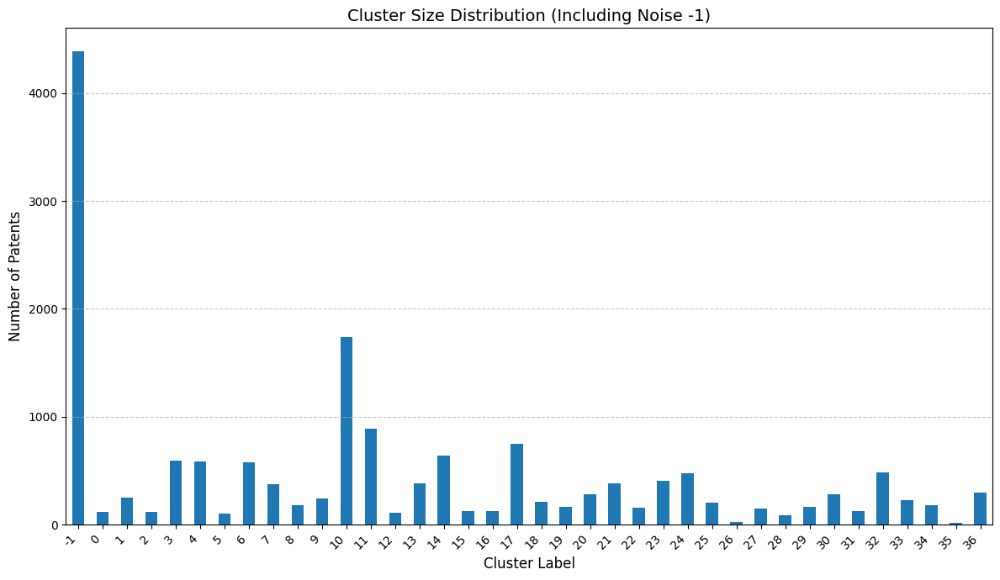

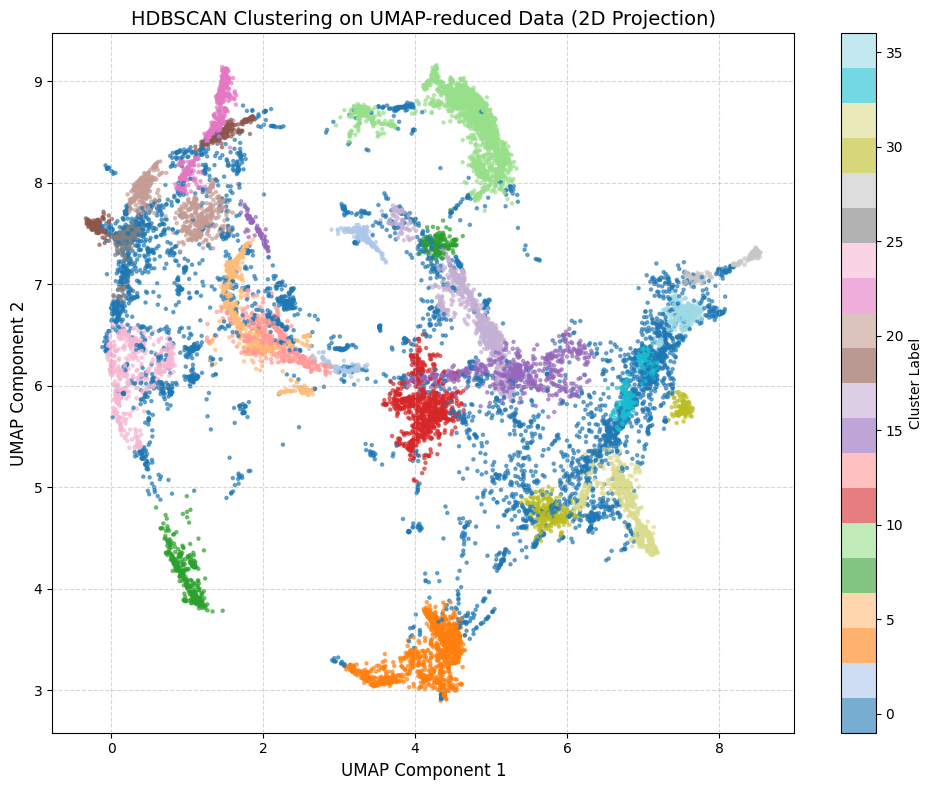

In [ ]:
# Now with the best parameters, evaluate the clusters:
# 1. **Purity**: Cluster purity to evaluate how well each cluster corresponds to categories
# Use the 'source' column from the original DataFrame 'df' which matches the size of embeddings
df_eval = pd.DataFrame({'label': best_labels, 'category': df['source'].values})

# Filter out noise points (-1) for purity calculation if needed, or include them if the definition allows
# For simplicity, let's calculate purity for points *assigned* to a cluster (label != -1)
df_eval_clustered = df_eval[df_eval['label'] != -1]

if not df_eval_clustered.empty:
    # Calculate purity: For each cluster label, find the most frequent category
    purity_counts = df_eval_clustered.groupby('label')['category'].apply(lambda x: x.mode()[0])
    print("Cluster Majority Category: \n", purity_counts)

    # Optionally, count how many in each cluster belong to the majority category
    # and the total size to get a percentage purity per cluster
    cluster_category_counts = df_eval_clustered.groupby(['label', 'category']).size().unstack(fill_value=0)
    print("\nCluster Category Distribution: \n", cluster_category_counts)

else:
    print("No points assigned to clusters (all labeled as -1). Cannot calculate purity.")


# 2. **Cluster Size Distribution**: Visualize the number of points in each cluster
cluster_sizes = pd.Series(best_labels).value_counts().sort_index() # Sort by label for cleaner plot

# Plot the distribution of cluster sizes
plt.figure(figsize=(12, 7)) # Increased figure size for potentially many clusters
cluster_sizes.plot(kind='bar')
plt.title("Cluster Size Distribution (Including Noise -1)", fontsize=14)
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Number of Patents", fontsize=12)
plt.xticks(rotation=45, ha='right') # Rotate labels for readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 3. **Cluster Visualization**: Visualize the clusters in 2D using the *first two* UMAP components
# Ensure 'reduced' has at least 2 dimensions.
if reduced.shape[1] >= 2:
    plt.figure(figsize=(10, 8))
    # Using the first two components of 'reduced' from the best_params UMAP
    scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=best_labels, cmap='tab20', s=5, alpha=0.6)
    plt.colorbar(label='Cluster Label')
    plt.title("HDBSCAN Clustering on UMAP-reduced Data (2D Projection)", fontsize=14)
    plt.xlabel("UMAP Component 1", fontsize=12)
    plt.ylabel("UMAP Component 2", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
else:
    print("UMAP was reduced to less than 2 dimensions. Cannot create a 2D scatter plot.")

In [ ]:
# Filter the noise points (label -1)
df_noise = df_eval[df_eval['label'] == -1]

# Count occurrences of each category in the noise
noise_category_distribution = df_noise['category'].value_counts()

print("Distribution of g, d, gd in noise (-1 label):")
print(noise_category_distribution)


Distribution of g, d, gd in noise (-1 label):
category
D     1646
G     1622
GD    1115
Name: count, dtype: int64


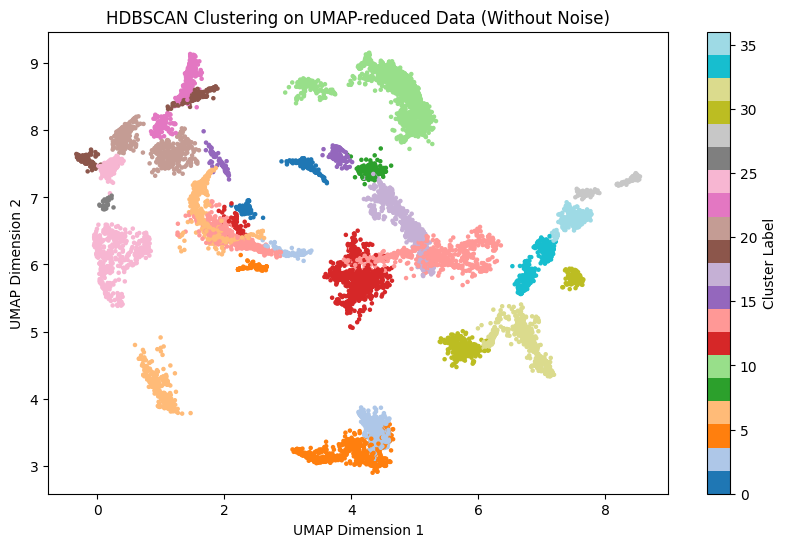

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming `reduced` contains your UMAP-reduced data and `best_labels` contains the cluster labels
# Exclude noise points (label == -1)
mask = best_labels != -1
filtered_reduced = reduced[mask]  # Data without noise
filtered_labels = best_labels[mask]  # Corresponding labels without noise

# Plotting the clusters without noise
plt.figure(figsize=(10, 6))
plt.scatter(filtered_reduced[:, 0], filtered_reduced[:, 1], c=filtered_labels, cmap='tab20', s=5)
plt.colorbar(label='Cluster Label')
plt.title("HDBSCAN Clustering on UMAP-reduced Data (Without Noise)")
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()


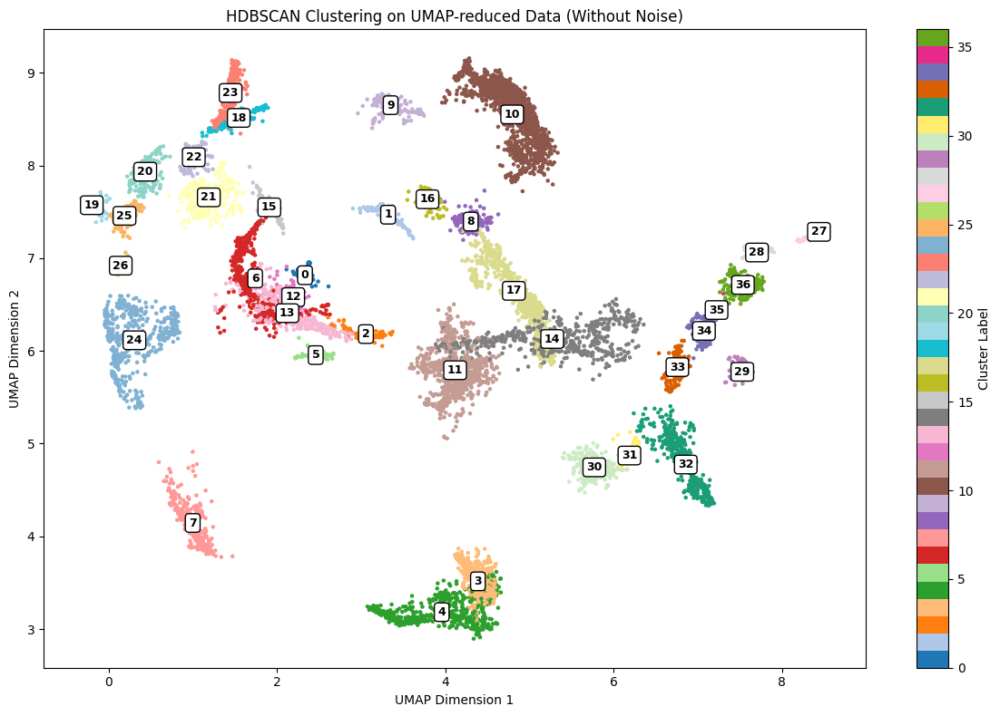

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
import seaborn as sns
from collections import defaultdict

# Generate a palette with 37 distinct and visually separated colors
base_palette = sns.color_palette("tab20", 20) \
               + sns.color_palette("Set3", 12) \
               + sns.color_palette("Dark2", 8)  # 20 + 12 + 8 = 40
colors = base_palette[:37]
custom_cmap = ListedColormap(colors)

# Filter noise
mask = best_labels != -1
filtered_reduced = reduced[mask]
filtered_labels = best_labels[mask]

# Plotting
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    filtered_reduced[:, 0],
    filtered_reduced[:, 1],
    c=filtered_labels,
    cmap=custom_cmap,
    s=5
)
plt.colorbar(scatter, label='Cluster Label')

# Add cluster numbers at the centroid
unique_labels = np.unique(filtered_labels)
for label in unique_labels:
    cluster_points = filtered_reduced[filtered_labels == label]
    centroid = cluster_points.mean(axis=0)
    plt.text(centroid[0], centroid[1], str(label), fontsize=9, weight='bold',
             ha='center', va='center', color='black',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

plt.title("HDBSCAN Clustering on UMAP-reduced Data (Without Noise)")
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.tight_layout()
plt.show()


In [ ]:
# Display the unique cluster labels (excluding noise)
unique_labels = np.unique(best_labels)
print(f"Number of clusters (excluding noise): {len(unique_labels)}")
print("Cluster labels:", unique_labels)


Number of clusters (excluding noise): 38
Cluster labels: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34 35 36]


In [ ]:
filtered_labels

array([ 3, 29, 17, ..., 10, 10, 11])

In [ ]:
df_union

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,cluster_label
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D,28
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D,17
...,...,...,...,...,...,...,...,...
16645,38951298,2007,The invention relates to a stand-alone shuttle...,en,The invention relates to a stand-alone shuttle...,144,GD,-1
16646,40474199,2007,The arrangement has an electric device (2) e.g...,en,The arrangement has an electric device e.g. el...,79,GD,10
16647,37875493,2006,"A method of determining, for each of one or mo...",en,"A method of determining, for each of one or mo...",255,GD,10
16648,67438865,2019,A method operates a technical or non-technical...,en,A method operates a technical or non-technical...,147,GD,-1


In [ ]:
# prompt: df_union cluster label

df_union['cluster_label'] = best_labels

In [ ]:
df_union

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,cluster_label
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D,17
...,...,...,...,...,...,...,...,...
16645,38951298,2007,The invention relates to a stand-alone shuttle...,en,The invention relates to a stand-alone shuttle...,144,GD,-1
16646,40474199,2007,The arrangement has an electric device (2) e.g...,en,The arrangement has an electric device e.g. el...,79,GD,10
16647,37875493,2006,"A method of determining, for each of one or mo...",en,"A method of determining, for each of one or mo...",255,GD,10
16648,67438865,2019,A method operates a technical or non-technical...,en,A method operates a technical or non-technical...,147,GD,-1


In [ ]:
# prompt: print cluster label

print(df_union['cluster_label'].value_counts())

cluster_label
-1     4383
 10    1735
 11     893
 17     748
 14     637
 3      596
 4      586
 6      577
 32     488
 24     480
 23     407
 13     385
 21     383
 7      373
 36     299
 20     282
 30     279
 1      250
 9      244
 33     231
 18     212
 25     207
 8      184
 34     184
 29     167
 19     165
 22     158
 27     153
 16     127
 15     126
 31     125
 0      122
 2      116
 12     109
 5      103
 28      87
 26      28
 35      21
Name: count, dtype: int64


# Paste k_labels with the embeddings-GD

In [ ]:
partition_pca_umap=df_GD

In [ ]:
partition_pca_umap

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,gd_label_str,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,The present invention discloses an unmanned ae...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,The present invention provides an accelerator ...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,A controlling method executes an auto-calculat...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,"In an embodiment, a computer-implemented metho...",62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,Systems and methods that analyze blood-based c...,310,0.6778,0.5075,0.4690,more_green_digital,3
...,...,...,...,...,...,...,...,...,...,...,...
5545,38951298,The invention relates to a stand-alone shuttle...,en,2007,The invention relates to a stand-alone shuttle...,144,0.4762,0.5306,0.4299,more_green_digital,3
5546,40474199,The arrangement has an electric device (2) e.g...,en,2007,The arrangement has an electric device e.g. el...,79,0.4636,0.4788,0.4084,more_green_digital,3
5547,37875493,"A method of determining, for each of one or mo...",en,2006,"A method of determining, for each of one or mo...",255,0.4651,0.4653,0.3248,more_green_digital,3
5548,67438865,A method operates a technical or non-technical...,en,2019,A method operates a technical or non-technical...,147,0.4630,0.4062,0.4189,more_digital,1


In [ ]:
# prompt: count number of means in partition

# Count the occurrences of each cluster label in the 'kmeans' column
cluster_counts = partition_pca_umap['gd_label_str'].value_counts()

# Print the cluster counts
print(cluster_counts)

#Alternatively, if you want to know the number of *unique* means (clusters):
num_means = len(cluster_counts)
print(f"Number of unique means (clusters): {num_means}")


gd_label_str
more_green_digital    4319
more_digital           743
more_green             477
balanced                11
Name: count, dtype: int64
Number of unique means (clusters): 4


In [ ]:
# prompt: GENERATE A DF WITH CLUSTER_COUNTS SAVE

# Assuming 'partition_pca_umap' DataFrame is already created as in your provided code.
cluster_counts = partition_pca_umap['gd_label_str'].value_counts().reset_index()
cluster_counts.columns = ['gd_label_str', 'count']
cluster_counts.to_csv(root_dir2+ "cluster_counts.csv", index=False) # Save to current working directory


# Topic modelling (abstracts)


In [ ]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')  # Download stopwords data if not already downloaded

stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
stop_words

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

In [ ]:
additional_stopwords1  = ['fig', 'than', 'hadn', 'either', 'am', 'himself', 'are', 'our', 'the', 'model', 'thereon', 'much', 'whereby', 'd', 'be', 'same', 'suitable', 'vice', 'can',
              "hasn't", 'prefer', 'comprise', 'sha', 'preferably', 'yours', 'described', 'being', 'accordingly', 'yet', 'essentially', 'he', 've', 'new', 'between', 'various',
              'able', 'his/her', 'toward', 'therebetween', 'had', 'wouldn', 'just', 'there', 'ie', 'anywhere', 'correspond', 'useful', 'use', 'mention', 'one another', 'together',
              'few', 'remarkably', 'typical', 'due', 'as', 'not', 'well', 'provides', 'straight forward', 'and', 'to', 'describe', "should've", "haven't", 'wherever', 'when', 'on', 'them',
              '-', 'however', 'preferred', 'me', 'and/or', 'below', 'more', 'does', 'need', 'kind', 'didn', 'another', 'thereafter', 'an', 'since', 'rather', 'present', 'once', "don't",
              'therewith', 'al', 'so', "'ve", 'particularly', 'ain', 'out', 'thereto', 'among', 'into', "that'll", 'better', 'here', 'towards', 'ourselves', "mustn't", 'off',
              'corresponding', 'moreover', 'whose', 'll', 'haven', 'in', 'disclosure', 'don', 'little', 'above-mentioned', 'good', 'would', 't', 'but', 'you', 'said', 'easily', 'wrt',
              'onto', 'is', 'sometimes', 'versa', 'only', "hadn't", 'again', 'already', 'y', 'were', 'under', 'his', 'method', "weren't", 'their', 'these', 'won', 'possibly', 'whom',
              'has', "isn't", 'therefor', 'him', 'they', 'therefrom', 'et al', 'some', 'enough', 'whereas', "you're", 'whereat', 'it', "mightn't", "won't", 'also', 'et', 'hers',
              'later', 'he/she', 'down', 'did', 'do', 'will', 'whether', 'itself', 'may', 'thereof', 'after', 'claim', 'or', 'nor', 'figs', "wasn't", "you'd", "it's", 'always',
              'overall', 'thereinto', 'yourselve', 'alternatively', 'about', 'along', 'within', 'others', 'was', 'therein', 'we', 'at', 'further', 'provide', 'this', '/',
              'straight', 'now', 'especially', 'above', 'mightn', 'yourselves', 's', 'many', 'through', 'a', 'should', 'her', 'say', 'those', 'accordance', 'during', 'desired',
              'iii', 'aren', 'then', 'until', 'substantially', 'accord', "didn't", 'according', 'o', 're', 'why', 'invention', 'from', 'for', 'like', 'significantly', 'having',
              'weren', "she's", 'via', 'with', 'eventually', 'specifically', 'no', 'respectively', 'shan', 'vice versa', "needn't", 'therefore', 'wasn', 'own', "you'll", 'hence',
              'relatively', 'therethrough', 'might', 'whatever', 'anything', 'which', 'finally', 'where', 'herself', "aren't", 'often', "wouldn't", 'needn', 'without', 'thus',
              'because', 'excellent', 'I', 'provided', 'one', 'up', 'forward', 'etc', 'been', 'ii', 'otherwise', 'instead', 'typically', "shouldn't", 'simply', 'your', 'means',
              'each', 'generally', 'have', 'thereby', 'what', 'any', 'across', 'shouldn', 'who', 'easy', 'both', 'i', 'how', 'embodiment', 'themselves', 'she', 'desire', 'while',
              'hasn', 'utility', "couldn't", 'could', 'before', 'isn', 'theirs', 'eg', 'all', 'never', 'wherein', 'against', 'other', 'doing', "shan't", 'allow', 'mustn', 'must',
              'such', "doesn't", 'very', 'herein', 'most', 'couldn', 'by', 'ours', 'furthermore', 'yourself', 'too', 'its', 'mean', 'myself', 'him/her', 'over', 'm', "you've", 'ma',
              'meanwhile', 'doesn', 'my', 'that', 'if', 'elsewhere', 'far', 'upon', 'based', 'using']

In [ ]:
additional_stopwords2  = ["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again",
"against","ain't","all","allow","allows","almost","alone","along","already","also","although","always", "am","among","amongst","an","and","another",
"any","anybody","anyhow","anyone","anything","anyway", "anyways","anywhere","apart","appear","appreciate","appropriate", "are","aren't","around","as","aside","ask",
"asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being",
"believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't",
"cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing",
"contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't",
"different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even",
"ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far", "few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets",
"getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have",
"haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him",
"himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch",
"inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept",
"know","knows","known","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly",
"many","may","maybe","me","mean","meanwhile",
"merely","might","more","moreover","most","mostly",
"much","must","my","myself","n","name",
"namely","nd","near","nearly","necessary","need",
"needs","neither","never","nevertheless","new","next",
"nine","no","nobody","non","none","noone",
"nor","normally","not","nothing","novel","now",
"nowhere","o","obviously","of","off","often",
"oh","ok","okay","old","on","once",
"one","ones","only","onto","or","other",
"others","otherwise","ought","our","ours","ourselves",
"out","outside","over","overall","own","p",
"particular","particularly","per","perhaps","placed","please",
"plus","possible","presumably","probably","provides","q",
"que","quite","qv","r","rather","rd",
"re","really","reasonably","regarding","regardless","regards",
"relatively","respectively","right","s","said","same",
"saw","say","saying","says","second","secondly",
"see","seeing","seem","seemed","seeming","seems",
"seen","self","selves","sensible","sent","serious",
"seriously","seven","several","shall","she","should",
"shouldn't","since","six","so","some","somebody",
"somehow","someone","something","sometime","sometimes","somewhat",
"somewhere","soon","sorry","specified","specify","specifying",
"still","sub","such","sup","sure","t",
"t's","take","taken","tell","tends","th",
"than","thank","thanks","thanx","that","that's",
"thats","the","their","theirs","them","themselves",
"then","thence","there","there's","thereafter","thereby",
"therefore","therein","theres","thereupon","these","they",
"they'd","they'll","they're","they've","think","third",
"this","thorough","thoroughly","those","though","three",
"through","throughout","thru","thus","to","together",
"too","took","toward","towards","tried","tries",
"truly","try","trying","twice","two","u",
"un","under","unfortunately","unless","unlikely","until",
"unto","up","upon","us","use","used",
"useful","uses","using","usually","uucp","v",
"value","various","very","via","viz","vs",
"w","want","wants","was","wasn't","way",
"we","we'd","we'll","we're","we've","welcome",
"well","went","were","weren't","what","what's",
"whatever","when","whence","whenever","where","where's",
"whereafter","whereas","whereby","wherein","whereupon","wherever",
"whether","which","while","whither","who","who's",
"whoever","whole","whom","whose","why","will",
"willing","wish","with","within","without","won't",
"wonder","would","would","wouldn't","x","y",
"yes","yet","you","you'd","you'll","you're",
"you've","your","yours","yourself","yourselves","z",
"zero"]

In [ ]:
stop_words = stopwords.words('english') + additional_stopwords1 + additional_stopwords2


In [ ]:
#more packages
import pandas as pd
from multiprocessing import Pool

In [ ]:
from gensim.utils import simple_preprocess

In [ ]:
#I use CPC codes

In [ ]:
partition_pca_umap.shape

(5550, 11)

In [ ]:
partition_pca_umap.head()

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,gd_label_str,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,The present invention discloses an unmanned ae...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,The present invention provides an accelerator ...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,A controlling method executes an auto-calculat...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,"In an embodiment, a computer-implemented metho...",62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,Systems and methods that analyze blood-based c...,310,0.6778,0.5075,0.4690,more_green_digital,3


In [ ]:
partition_pca_umap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5550 entries, 0 to 5549
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   docdb_family_id       5550 non-null   int64  
 1   appln_abstract        5550 non-null   object 
 2   appln_abstract_lg     5550 non-null   object 
 3   earliest_filing_year  5550 non-null   int64  
 4   cleaned               5550 non-null   object 
 5   length                5550 non-null   int64  
 6   distance_to_green     5550 non-null   float64
 7   distance_to_digital   5550 non-null   float64
 8   distance_to_gd        5550 non-null   float64
 9   gd_label_str          5550 non-null   object 
 10  gd_label              5550 non-null   int64  
dtypes: float64(3), int64(4), object(4)
memory usage: 477.1+ KB


In [ ]:
partition=partition_pca_umap

In [ ]:
#CLEAN ABSTRACT
desc = partition.cleaned
#Convert to lower case
desc = desc.str.lower()
#Keep only alphabets and numbers
desc = desc.str.replace('[^0-9a-zA-Z]+', ' ')
desc.fillna('', inplace = True)
partition.cleaned = desc

In [ ]:
#Remove return and other things
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)

#Removing leading and trailing spaces
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


<ipython-input-123-7f48dd03abab>:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)
<ipython-input-123-7f48dd03abab>:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
#Removing Extra Spaces
partition['cleaned'] = partition['cleaned'].replace('\s+', ' ', regex=True)

In [ ]:
partition.head()

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,gd_label_str,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,the present invention discloses an unmanned ae...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,the present invention provides an accelerator ...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,a controlling method executes an auto-calculat...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,"in an embodiment, a computer-implemented metho...",62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,systems and methods that analyze blood-based c...,310,0.6778,0.5075,0.4690,more_green_digital,3


In [ ]:
from gensim.utils import simple_preprocess
import nltk

In [ ]:
# Stop word removal
partition['cleaned'] = [[word for word in simple_preprocess(str(doc),deacc=False, min_len=2, max_len=30) if word not in stop_words] for doc in partition['cleaned']]
partition['cleaned'] = partition['cleaned'].map(lambda tokens: ' '.join(tokens))

In [ ]:
partition['cleaned']

,cleaned
0,discloses unmanned aerial vehicle including fu...
1,accelerator chip artificial intelligence accel...
2,controlling executes auto calculation procedur...
3,computer implemented generating displaying com...
4,systems methods analyze blood cancer diagnosti...
...,...
5545,relates stand shuttle conveyor intended storag...
5546,arrangement electric device electrical socket ...
5547,determining elemental periods statistically re...
5548,operates technical technical system informatio...


In [ ]:
from gensim.models.phrases import Phrases, ENGLISH_CONNECTOR_WORDS

In [ ]:
sentences = partition['cleaned'].to_list()
sentences = [doc.split(" ") for doc in sentences]

phrase_model = Phrases(sentences, connector_words=ENGLISH_CONNECTOR_WORDS, scoring = 'npmi', threshold=0.1)

In [ ]:
phrase_model

In [ ]:
print(phrase_model)

Phrases<190215 vocab, min_count=5, threshold=0.1, max_vocab_size=40000000>


In [ ]:
def bigram_pasting(sentence):
  return " ".join(phrase_model[sentence.split(" ")])

In [ ]:
print(bigram_pasting)

<function bigram_pasting at 0x7faed9f5ac00>


In [ ]:
dt = partition

p = Pool(10)
dt['cleaned'] = p.map(bigram_pasting, dt['cleaned'])
p.close()
p.join()

In [ ]:
dt

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,gd_label_str,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,discloses unmanned_aerial vehicle_including fu...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,accelerator_chip artificial_intelligence accel...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,controlling executes auto calculation procedur...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,computer_implemented generating displaying com...,62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,systems_methods analyze blood cancer diagnosti...,310,0.6778,0.5075,0.4690,more_green_digital,3
...,...,...,...,...,...,...,...,...,...,...,...
5545,38951298,The invention relates to a stand-alone shuttle...,en,2007,relates stand shuttle conveyor intended storag...,144,0.4762,0.5306,0.4299,more_green_digital,3
5546,40474199,The arrangement has an electric device (2) e.g...,en,2007,arrangement electric device electrical socket ...,79,0.4636,0.4788,0.4084,more_green_digital,3
5547,37875493,"A method of determining, for each of one or mo...",en,2006,determining elemental periods statistically re...,255,0.4651,0.4653,0.3248,more_green_digital,3
5548,67438865,A method operates a technical or non-technical...,en,2019,operates technical technical_system informatio...,147,0.4630,0.4062,0.4189,more_digital,1


In [ ]:
dt.head()

,docdb_family_id,appln_abstract,appln_abstract_lg,earliest_filing_year,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,gd_label_str,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,discloses unmanned_aerial vehicle_including fu...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,accelerator_chip artificial_intelligence accel...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,controlling executes auto calculation procedur...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,computer_implemented generating displaying com...,62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,systems_methods analyze blood cancer diagnosti...,310,0.6778,0.5075,0.4690,more_green_digital,3


In [ ]:
dt.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',	'appln_abstract_lg',	'cleaned',	'length',	'distance_to_green',	'distance_to_digital',	'distance_to_gd',	'labels',	'gd_label'] # Added 'cpc_7' and 'raw_data_length' to the column names

In [ ]:
docs_per_topic_mpnet_gd = dt.groupby(['labels'], as_index = False).agg({'cleaned': ' '.join}) # Remove 'cpc_4' from agg since it has been dropped
# changing columns using .columns()
docs_per_topic_mpnet_gd.columns = ['labels', 'cleaned'] # Adjust columns accordingly

In [ ]:
docs_per_topic_mpnet_gd

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# changing columns using .columns()
docs_per_topic_mpnet_gd.columns = ['labels', 'cleaned']

In [ ]:
docs_per_topic_mpnet_gd

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,discloses unmanned_aerial vehicle_including fu...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,accelerator_chip artificial_intelligence accel...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,controlling executes auto calculation procedur...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,computer_implemented generating displaying com...,62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,systems_methods analyze blood cancer diagnosti...,310,0.6778,0.5075,0.4690,more_green_digital,3


In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,gd_label
0,58785336,The present invention discloses an unmanned ae...,en,2016,discloses unmanned_aerial vehicle_including fu...,479,0.5409,0.4390,0.3429,more_green_digital,3
1,74869014,The present invention provides an accelerator ...,en,2019,accelerator_chip artificial_intelligence accel...,257,0.5780,0.4707,0.4337,more_green_digital,3
2,54601667,A controlling method executes an auto-calculat...,en,2014,controlling executes auto calculation procedur...,417,0.5205,0.4892,0.4517,more_green_digital,3
3,72603855,"In an embodiment, a computer-implemented metho...",en,2019,computer_implemented generating displaying com...,62,0.5966,0.5225,0.4861,more_green_digital,3
4,68163332,Systems and methods that analyze blood-based c...,en,2018,systems_methods analyze blood cancer diagnosti...,310,0.6778,0.5075,0.4690,more_green_digital,3


In [ ]:
# prompt: count partition[labels] in each category

# Assuming 'partition' DataFrame and 'labels' column exist as in your provided code.

# prompt: count partition[kmeans] in each category

# Assuming 'partition' DataFrame and 'kmeans' column exist as in your provided code.

label_counts = partition['labels'].value_counts()
label_counts
#closer_to_green_digital': 0, 'closer_to_digital': 1, 'balanced': 2}

,count
labels,
more_green_digital,4319
more_digital,743
more_green,477
balanced,11


##Model 3_1

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

stop_words = stop_words  # Replace with your list of stop words

vectorizer = CountVectorizer(stop_words=stop_words)

In [ ]:
def c_tf_idf(documents, m, ngram_range=(2,3)):
    count = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words).fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)

    return tf_idf, count

tf_idf, count = c_tf_idf(docs_per_topic_mpnet_gd.cleaned.values, m=len(partition))

/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['mentioned', 'mon'] not in stop_words.
  warnings.warn(


In [ ]:
def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic_mpnet_gd.labels)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(partition):
    topic_sizes = (partition.groupby('labels')
                     .appln_abstract
                     .count()
                     .reset_index()
                     .rename({"labels": "labels", "appln_abstract": "Size"}, axis='columns')
                     .sort_values("Size", ascending=False))
    return topic_sizes

In [ ]:
topic_sizes_mpnet__gd=extract_topic_sizes(partition)

In [ ]:
topic_sizes_mpnet__gd

,labels,Size
3,more_green_digital,4319
1,more_digital,743
2,more_green,477
0,balanced,11


In [ ]:
topic_sizes_mpnet__gd["labels"]=topic_sizes_mpnet__gd.index

In [ ]:
topic_sizes_mpnet__gd

,labels,Size
3,3,4319
1,1,743
2,2,477
0,0,11


In [ ]:
docs_per_topic_mpnet_gd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   labels   4 non-null      object
 1   cleaned  4 non-null      object
dtypes: object(2)
memory usage: 196.0+ bytes


In [ ]:
#docs_per_topic_mpnet_gds.columns = ['labels', 'appln_abstract', 'cpc_class_symbol']

In [ ]:
print(docs_per_topic_mpnet_gd)

               labels                                            cleaned
0            balanced  methods design engineered polypeptides recapit...
1        more_digital  hull robot hull robot_autonomous operate vesse...
2          more_green  methods_detecting hydrogen leak quantifying ra...
3  more_green_digital  discloses unmanned_aerial vehicle_including fu...


In [ ]:
import sklearn
print(sklearn.__version__)

1.6.1


In [ ]:
top_n_words_mpnet_gd = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100)

In [ ]:
top_n_words_mpnet_gd

{'balanced': [('selected preamble', 0.025679711963160923),
  ('set blueprint_records', 0.025679711963160923),
  ('preamble subset', 0.025679711963160923),
  ('recommended tire', 0.025679711963160923),
  ('driving condition', 0.025679711963160923),
  ('light coupling', 0.02002557475973124),
  ('guidance body', 0.02002557475973124),
  ('selected preamble subset', 0.02002557475973124),
  ('temperature motor', 0.02002557475973124),
  ('dome switching', 0.014069930836167765),
  ('diagnosed risk_developing', 0.014069930836167765),
  ('adenosine activity upregulator', 0.014069930836167765),
  ('multilayer structure', 0.014069930836167765),
  ('multilayer structure quantum', 0.014069930836167765),
  ('administering patient', 0.014069930836167765),
  ('activity upregulator', 0.014069930836167765),
  ('adenosine activity', 0.014069930836167765),
  ('impairment mobility soft', 0.014069930836167765),
  ('impairment mobility', 0.014069930836167765),
  ('coupling region', 0.014069930836167765),
  ('

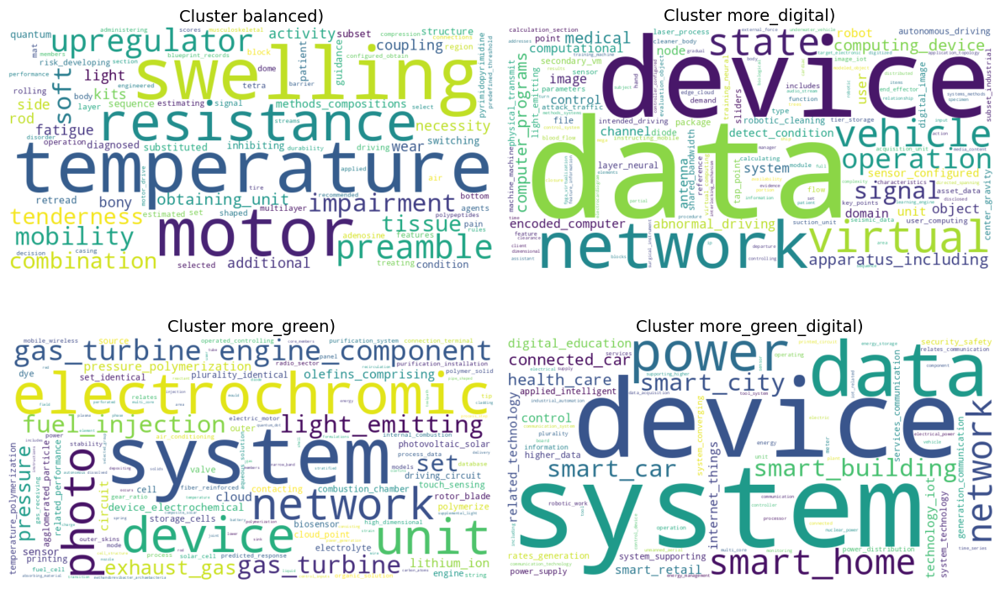

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_gd.keys())
num_topics = len(topics)
rows = math.ceil(num_topics / 2)  # Number of rows needed

fig, axes = plt.subplots(rows, 2, figsize=(12, rows * 4))  # 2 columns layout
axes = axes.flatten()  # Flatten to loop easily

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_gd[topic]]  # Extract words
    topic_size = len(topics)  # Compute topic size (number of words)

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic})", fontsize=14)  # Include topic size

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



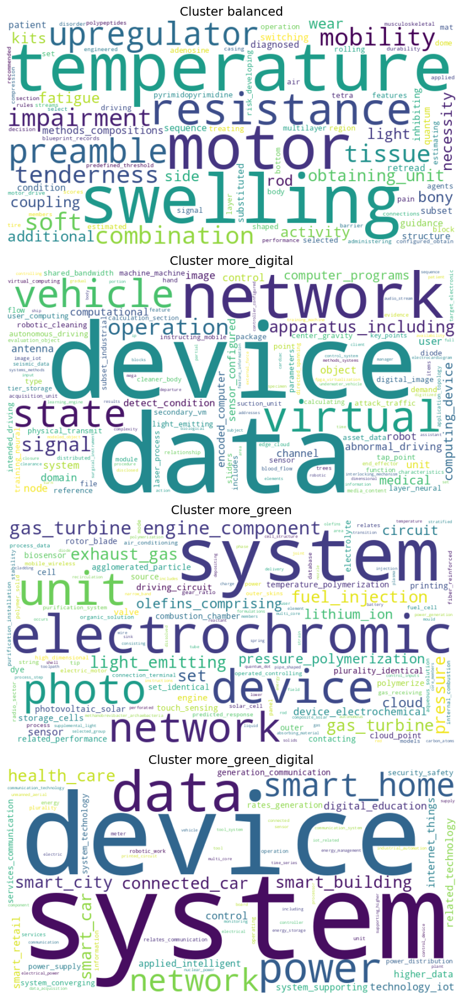

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_gd.keys())
num_topics = len(topics)

fig, axes = plt.subplots(num_topics, 1, figsize=(8, num_topics * 4))  # 1 column layout
if num_topics == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one subplot

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_gd[topic]]  # Extract words

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic}", fontsize=14)

plt.tight_layout()
plt.show()


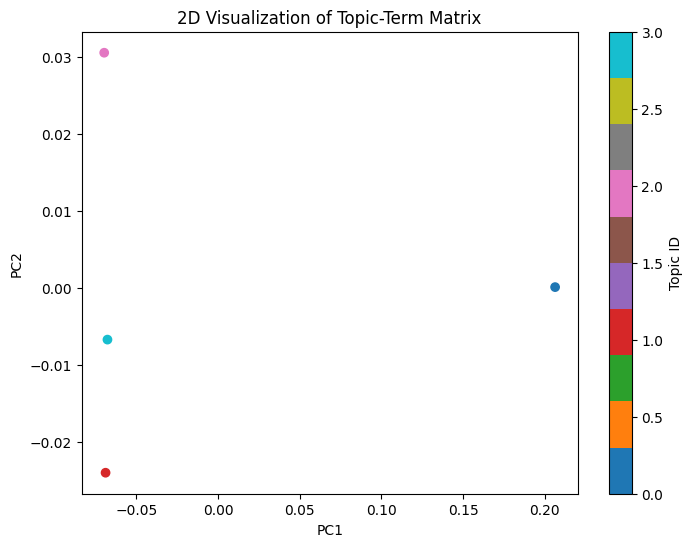

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce dimensionality
reduced = PCA(n_components=2).fit_transform(tf_idf.T)

# Map string labels to integers
label_mapping = {label: idx for idx, label in enumerate(docs_per_topic_mpnet_gd.labels.unique())}
numeric_labels = docs_per_topic_mpnet_gd.labels.map(label_mapping)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(reduced[:, 0], reduced[:, 1], c=numeric_labels, cmap='tab10')
plt.title("2D Visualization of Topic-Term Matrix")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.colorbar(label="Topic ID")
plt.show()


In [ ]:
def get_representative_docs(tf_idf, docs, labels, count, top_n_words):
    words = count.get_feature_names_out()
    reps = {}

    docs = docs.reset_index(drop=True)
    labels = pd.Series(labels).reset_index(drop=True)

    for topic, top_words in top_n_words.items():
        # Get indices of top words in vocabulary
        word_indices = [np.where(words == w)[0][0] for w, _ in top_words if w in words]

        # Get indices of documents in the current topic
        topic_doc_indices = labels[labels == topic].index.tolist()
        topic_docs = docs.iloc[topic_doc_indices]

        # Extract relevant TF-IDF values
        topic_tfidf = tf_idf[:, topic_doc_indices]  # shape: (terms, topic_docs)

        # Compute scores by summing TF-IDF scores of top words
        topic_scores = topic_tfidf[word_indices, :].sum(axis=0)

        # Pick the best doc
        best_doc_idx = topic_doc_indices[np.argmax(topic_scores)]
        reps[topic] = docs[best_doc_idx]

    return reps


In [ ]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100)

In [ ]:
reps = get_representative_docs(tf_idf, docs_per_topic_mpnet_gd.cleaned,
                               docs_per_topic_mpnet_gd.labels, count, top_n_words)

# Print a few examples
for topic, doc in reps.items():
    print(f"Topic: {topic}")
    print(doc)
    print("-" * 80)

Output hidden; open in https://colab.research.google.com to view.

# Paste k_labels with the embeddings-D

In [ ]:
partition_pca_umap=df_D

In [ ]:
partition_pca_umap

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,d_label_str,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,Systems and methods for positioning a cut guid...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...","Method and system for automatically detecting,...",156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,A system includes circuitry for cryptographic ...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,According to an example aspect of the present ...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,A system for providing security functions to a...,93,0.5503,0.4318,0.4594,more_digital,1
...,...,...,...,...,...,...,...,...,...,...,...
5545,22996608,2001,en,A method for reducing the bandwidth required t...,A method for reducing the bandwidth required t...,118,0.4436,0.4982,0.4752,more_green,0
5546,23981004,2000,en,A skateboard (10) is movable in response to us...,A skateboard is movable in response to user co...,109,0.6674,0.6410,0.6628,more_digital,1
5547,70166170,2019,en,A system and method for surfacing content rele...,A system and method for surfacing content rele...,96,0.5910,0.4061,0.5383,more_digital,1
5548,54347850,2014,en,Region of interest detection in raw time of fl...,Region of interest detection in raw time of fl...,128,0.6711,0.4603,0.5438,more_digital,1


In [ ]:
# prompt: count number of means in partition

# Count the occurrences of each cluster label in the 'kmeans' column
cluster_counts = partition_pca_umap['d_label_str'].value_counts()

# Print the cluster counts
print(cluster_counts)

#Alternatively, if you want to know the number of *unique* means (clusters):
num_means = len(cluster_counts)
print(f"Number of unique means (clusters): {num_means}")


d_label_str
more_digital          4707
more_green_digital     639
more_green             147
balanced                57
Name: count, dtype: int64
Number of unique means (clusters): 4


In [ ]:
# prompt: GENERATE A DF WITH CLUSTER_COUNTS SAVE

# Assuming 'partition_pca_umap' DataFrame is already created as in your provided code.
cluster_counts = partition_pca_umap['d_label_str'].value_counts().reset_index()
cluster_counts.columns = ['green_label_num', 'count']
cluster_counts.to_csv(root_dir2+ "cluster_counts.csv", index=False) # Save to current working directory


# Topic modelling (abstracts)


In [ ]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')  # Download stopwords data if not already downloaded

stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
stop_words

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

In [ ]:
additional_stopwords1  = ['fig', 'than', 'hadn', 'either', 'am', 'himself', 'are', 'our', 'the', 'model', 'thereon', 'much', 'whereby', 'd', 'be', 'same', 'suitable', 'vice', 'can',
              "hasn't", 'prefer', 'comprise', 'sha', 'preferably', 'yours', 'described', 'being', 'accordingly', 'yet', 'essentially', 'he', 've', 'new', 'between', 'various',
              'able', 'his/her', 'toward', 'therebetween', 'had', 'wouldn', 'just', 'there', 'ie', 'anywhere', 'correspond', 'useful', 'use', 'mention', 'one another', 'together',
              'few', 'remarkably', 'typical', 'due', 'as', 'not', 'well', 'provides', 'straight forward', 'and', 'to', 'describe', "should've", "haven't", 'wherever', 'when', 'on', 'them',
              '-', 'however', 'preferred', 'me', 'and/or', 'below', 'more', 'does', 'need', 'kind', 'didn', 'another', 'thereafter', 'an', 'since', 'rather', 'present', 'once', "don't",
              'therewith', 'al', 'so', "'ve", 'particularly', 'ain', 'out', 'thereto', 'among', 'into', "that'll", 'better', 'here', 'towards', 'ourselves', "mustn't", 'off',
              'corresponding', 'moreover', 'whose', 'll', 'haven', 'in', 'disclosure', 'don', 'little', 'above-mentioned', 'good', 'would', 't', 'but', 'you', 'said', 'easily', 'wrt',
              'onto', 'is', 'sometimes', 'versa', 'only', "hadn't", 'again', 'already', 'y', 'were', 'under', 'his', 'method', "weren't", 'their', 'these', 'won', 'possibly', 'whom',
              'has', "isn't", 'therefor', 'him', 'they', 'therefrom', 'et al', 'some', 'enough', 'whereas', "you're", 'whereat', 'it', "mightn't", "won't", 'also', 'et', 'hers',
              'later', 'he/she', 'down', 'did', 'do', 'will', 'whether', 'itself', 'may', 'thereof', 'after', 'claim', 'or', 'nor', 'figs', "wasn't", "you'd", "it's", 'always',
              'overall', 'thereinto', 'yourselve', 'alternatively', 'about', 'along', 'within', 'others', 'was', 'therein', 'we', 'at', 'further', 'provide', 'this', '/',
              'straight', 'now', 'especially', 'above', 'mightn', 'yourselves', 's', 'many', 'through', 'a', 'should', 'her', 'say', 'those', 'accordance', 'during', 'desired',
              'iii', 'aren', 'then', 'until', 'substantially', 'accord', "didn't", 'according', 'o', 're', 'why', 'invention', 'from', 'for', 'like', 'significantly', 'having',
              'weren', "she's", 'via', 'with', 'eventually', 'specifically', 'no', 'respectively', 'shan', 'vice versa', "needn't", 'therefore', 'wasn', 'own', "you'll", 'hence',
              'relatively', 'therethrough', 'might', 'whatever', 'anything', 'which', 'finally', 'where', 'herself', "aren't", 'often', "wouldn't", 'needn', 'without', 'thus',
              'because', 'excellent', 'I', 'provided', 'one', 'up', 'forward', 'etc', 'been', 'ii', 'otherwise', 'instead', 'typically', "shouldn't", 'simply', 'your', 'means',
              'each', 'generally', 'have', 'thereby', 'what', 'any', 'across', 'shouldn', 'who', 'easy', 'both', 'i', 'how', 'embodiment', 'themselves', 'she', 'desire', 'while',
              'hasn', 'utility', "couldn't", 'could', 'before', 'isn', 'theirs', 'eg', 'all', 'never', 'wherein', 'against', 'other', 'doing', "shan't", 'allow', 'mustn', 'must',
              'such', "doesn't", 'very', 'herein', 'most', 'couldn', 'by', 'ours', 'furthermore', 'yourself', 'too', 'its', 'mean', 'myself', 'him/her', 'over', 'm', "you've", 'ma',
              'meanwhile', 'doesn', 'my', 'that', 'if', 'elsewhere', 'far', 'upon', 'based', 'using']

In [ ]:
additional_stopwords2  = ["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again",
"against","ain't","all","allow","allows","almost","alone","along","already","also","although","always", "am","among","amongst","an","and","another",
"any","anybody","anyhow","anyone","anything","anyway", "anyways","anywhere","apart","appear","appreciate","appropriate", "are","aren't","around","as","aside","ask",
"asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being",
"believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't",
"cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing",
"contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't",
"different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even",
"ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far", "few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets",
"getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have",
"haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him",
"himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch",
"inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept",
"know","knows","known","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly",
"many","may","maybe","me","mean","meanwhile",
"merely","might","more","moreover","most","mostly",
"much","must","my","myself","n","name",
"namely","nd","near","nearly","necessary","need",
"needs","neither","never","nevertheless","new","next",
"nine","no","nobody","non","none","noone",
"nor","normally","not","nothing","novel","now",
"nowhere","o","obviously","of","off","often",
"oh","ok","okay","old","on","once",
"one","ones","only","onto","or","other",
"others","otherwise","ought","our","ours","ourselves",
"out","outside","over","overall","own","p",
"particular","particularly","per","perhaps","placed","please",
"plus","possible","presumably","probably","provides","q",
"que","quite","qv","r","rather","rd",
"re","really","reasonably","regarding","regardless","regards",
"relatively","respectively","right","s","said","same",
"saw","say","saying","says","second","secondly",
"see","seeing","seem","seemed","seeming","seems",
"seen","self","selves","sensible","sent","serious",
"seriously","seven","several","shall","she","should",
"shouldn't","since","six","so","some","somebody",
"somehow","someone","something","sometime","sometimes","somewhat",
"somewhere","soon","sorry","specified","specify","specifying",
"still","sub","such","sup","sure","t",
"t's","take","taken","tell","tends","th",
"than","thank","thanks","thanx","that","that's",
"thats","the","their","theirs","them","themselves",
"then","thence","there","there's","thereafter","thereby",
"therefore","therein","theres","thereupon","these","they",
"they'd","they'll","they're","they've","think","third",
"this","thorough","thoroughly","those","though","three",
"through","throughout","thru","thus","to","together",
"too","took","toward","towards","tried","tries",
"truly","try","trying","twice","two","u",
"un","under","unfortunately","unless","unlikely","until",
"unto","up","upon","us","use","used",
"useful","uses","using","usually","uucp","v",
"value","various","very","via","viz","vs",
"w","want","wants","was","wasn't","way",
"we","we'd","we'll","we're","we've","welcome",
"well","went","were","weren't","what","what's",
"whatever","when","whence","whenever","where","where's",
"whereafter","whereas","whereby","wherein","whereupon","wherever",
"whether","which","while","whither","who","who's",
"whoever","whole","whom","whose","why","will",
"willing","wish","with","within","without","won't",
"wonder","would","would","wouldn't","x","y",
"yes","yet","you","you'd","you'll","you're",
"you've","your","yours","yourself","yourselves","z",
"zero"]

In [ ]:
stop_words = stopwords.words('english') + additional_stopwords1 + additional_stopwords2


In [ ]:
#more packages
import pandas as pd
from multiprocessing import Pool

In [ ]:
from gensim.utils import simple_preprocess

In [ ]:
#I use CPC codes

In [ ]:
partition_pca_umap.shape

(5550, 11)

In [ ]:
partition_pca_umap.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,d_label_str,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,Systems and methods for positioning a cut guid...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...","Method and system for automatically detecting,...",156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,A system includes circuitry for cryptographic ...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,According to an example aspect of the present ...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,A system for providing security functions to a...,93,0.5503,0.4318,0.4594,more_digital,1


In [ ]:
partition_pca_umap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5550 entries, 0 to 5549
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   docdb_family_id       5550 non-null   int64  
 1   earliest_filing_year  5550 non-null   int64  
 2   appln_abstract_lg     5550 non-null   object 
 3   appln_abstract        5550 non-null   object 
 4   cleaned               5550 non-null   object 
 5   length                5550 non-null   int64  
 6   distance_to_green     5550 non-null   float64
 7   distance_to_digital   5550 non-null   float64
 8   distance_to_gd        5550 non-null   float64
 9   d_label_str           5550 non-null   object 
 10  d_label               5550 non-null   int64  
dtypes: float64(3), int64(4), object(4)
memory usage: 477.1+ KB


In [ ]:
partition=partition_pca_umap

In [ ]:
#CLEAN ABSTRACT
desc = partition.cleaned
#Convert to lower case
desc = desc.str.lower()
#Keep only alphabets and numbers
desc = desc.str.replace('[^0-9a-zA-Z]+', ' ')
desc.fillna('', inplace = True)
partition.cleaned = desc

In [ ]:
#Remove return and other things
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)

#Removing leading and trailing spaces
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


<ipython-input-179-7f48dd03abab>:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)
<ipython-input-179-7f48dd03abab>:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
#Removing Extra Spaces
partition['cleaned'] = partition['cleaned'].replace('\s+', ' ', regex=True)

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,d_label_str,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,systems and methods for positioning a cut guid...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...","method and system for automatically detecting,...",156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,a system includes circuitry for cryptographic ...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,according to an example aspect of the present ...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,a system for providing security functions to a...,93,0.5503,0.4318,0.4594,more_digital,1


In [ ]:
from gensim.utils import simple_preprocess
import nltk

In [ ]:
# Stop word removal
partition['cleaned'] = [[word for word in simple_preprocess(str(doc),deacc=False, min_len=2, max_len=30) if word not in stop_words] for doc in partition['cleaned']]
partition['cleaned'] = partition['cleaned'].map(lambda tokens: ' '.join(tokens))

In [ ]:
partition['cleaned']

,cleaned
0,systems methods positioning cut guide navigati...
1,system automatically detecting locating identi...
2,system includes circuitry cryptographic data s...
3,aspect comprising receiving target pose data i...
4,system providing security functions vehicle ch...
...,...
5545,reducing bandwidth required transmit data pack...
5546,skateboard movable response user commands remo...
5547,system surfacing content relevant system compu...
5548,region interest detection raw time flight imag...


In [ ]:
from gensim.models.phrases import Phrases, ENGLISH_CONNECTOR_WORDS

In [ ]:
sentences = partition['cleaned'].to_list()
sentences = [doc.split(" ") for doc in sentences]

phrase_model = Phrases(sentences, connector_words=ENGLISH_CONNECTOR_WORDS, scoring = 'npmi', threshold=0.1)

In [ ]:
phrase_model

In [ ]:
print(phrase_model)

Phrases<210635 vocab, min_count=5, threshold=0.1, max_vocab_size=40000000>


In [ ]:
def bigram_pasting(sentence):
  return " ".join(phrase_model[sentence.split(" ")])

In [ ]:
print(bigram_pasting)

<function bigram_pasting at 0x7faed9f58cc0>


In [ ]:
dt = partition

p = Pool(10)
dt['cleaned'] = p.map(bigram_pasting, dt['cleaned'])
p.close()
p.join()

In [ ]:
dt

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,d_label_str,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,systems_methods positioning cut_guide navigati...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...",system_automatically detecting locating identi...,156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,system_includes circuitry cryptographic data s...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,aspect comprising_receiving target_pose data_i...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,system_providing security functions vehicle ch...,93,0.5503,0.4318,0.4594,more_digital,1
...,...,...,...,...,...,...,...,...,...,...,...
5545,22996608,2001,en,A method for reducing the bandwidth required t...,reducing bandwidth required transmit_data pack...,118,0.4436,0.4982,0.4752,more_green,0
5546,23981004,2000,en,A skateboard (10) is movable in response to us...,skateboard movable response_user commands remo...,109,0.6674,0.6410,0.6628,more_digital,1
5547,70166170,2019,en,A system and method for surfacing content rele...,system surfacing content relevant system compu...,96,0.5910,0.4061,0.5383,more_digital,1
5548,54347850,2014,en,Region of interest detection in raw time of fl...,region_interest detection raw time_flight imag...,128,0.6711,0.4603,0.5438,more_digital,1


In [ ]:
dt.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,d_label_str,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,systems_methods positioning cut_guide navigati...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...",system_automatically detecting locating identi...,156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,system_includes circuitry cryptographic data s...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,aspect comprising_receiving target_pose data_i...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,system_providing security functions vehicle ch...,93,0.5503,0.4318,0.4594,more_digital,1


In [ ]:
dt.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',	'appln_abstract_lg',	'cleaned',	'length',	'distance_to_green',	'distance_to_digital',	'distance_to_gd',	'labels',	'd_label']

In [ ]:
docs_per_topic_mpnet_d = dt.groupby(['labels'], as_index = False).agg({'cleaned': ' '.join}) # Remove 'cpc_4' from agg since it has been dropped
# changing columns using .columns()
docs_per_topic_mpnet_d.columns = ['labels', 'cleaned'] # Adjust columns accordingly

In [ ]:
docs_per_topic_mpnet_d

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# changing columns using .columns()
docs_per_topic_mpnet_d.columns = ['labels', 'cleaned']

In [ ]:
docs_per_topic_mpnet_d

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,systems_methods positioning cut_guide navigati...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...",system_automatically detecting locating identi...,156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,system_includes circuitry cryptographic data s...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,aspect comprising_receiving target_pose data_i...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,system_providing security functions vehicle ch...,93,0.5503,0.4318,0.4594,more_digital,1


In [ ]:
#partition.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',	'appln_abstract_lg',	'cleaned',	'length',	'cpc_4',	'cpc_6',	'source',	'labels',	'cluster6']
# Update the list of column names to match the expected 9 columns based on Global variables and previous code.
# Make sure the column names accurately reflect the content of the columns in 'partition'.

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,d_label
0,54006212,2014,en,Systems and methods for positioning a cut guid...,systems_methods positioning cut_guide navigati...,202,0.6283,0.3618,0.5116,more_digital,1
1,69190842,2019,en,"Method and system for automatically detecting,...",system_automatically detecting locating identi...,156,0.5701,0.4118,0.5054,more_digital,1
2,68470408,2018,en,A system includes circuitry for cryptographic ...,system_includes circuitry cryptographic data s...,115,0.5989,0.4255,0.4804,more_digital,1
3,65903982,2019,en,According to an example aspect of the present ...,aspect comprising_receiving target_pose data_i...,137,0.6096,0.4708,0.4892,more_digital,1
4,68240324,2019,en,A system for providing security functions to a...,system_providing security functions vehicle ch...,93,0.5503,0.4318,0.4594,more_digital,1


In [ ]:
# prompt: count partition[labels] in each category

# Assuming 'partition' DataFrame and 'labels' column exist as in your provided code.

# prompt: count partition[kmeans] in each category

# Assuming 'partition' DataFrame and 'kmeans' column exist as in your provided code.

label_counts = partition['labels'].value_counts()
label_counts
#closer_to_green_digital': 0, 'closer_to_digital': 1, 'balanced': 2}

,count
labels,
more_digital,4707
more_green_digital,639
more_green,147
balanced,57


##Model 3_1

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

stop_words = stop_words  # Replace with your list of stop words

vectorizer = CountVectorizer(stop_words=stop_words)

In [ ]:
def c_tf_idf(documents, m, ngram_range=(2,3)):
    count = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words).fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)

    return tf_idf, count

tf_idf, count = c_tf_idf(docs_per_topic_mpnet_d.cleaned.values, m=len(partition))

/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['mentioned', 'mon'] not in stop_words.
  warnings.warn(


In [ ]:
def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic_mpnet_d.labels)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(partition):
    topic_sizes = (partition.groupby('labels')
                     .appln_abstract
                     .count()
                     .reset_index()
                     .rename({"labels": "labels", "appln_abstract": "Size"}, axis='columns')
                     .sort_values("Size", ascending=False))
    return topic_sizes

In [ ]:
topic_sizes_mpnet__d=extract_topic_sizes(partition)

In [ ]:
topic_sizes_mpnet__d

,labels,Size
1,more_digital,4707
3,more_green_digital,639
2,more_green,147
0,balanced,57


In [ ]:
topic_sizes_mpnet__d["labels"]=topic_sizes_mpnet__d.index

In [ ]:
topic_sizes_mpnet__d

,labels,Size
1,1,4707
3,3,639
2,2,147
0,0,57


In [ ]:
docs_per_topic_mpnet_gd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   labels   4 non-null      object
 1   cleaned  4 non-null      object
dtypes: object(2)
memory usage: 196.0+ bytes


In [ ]:
#docs_per_topic_mpnet_gds.columns = ['labels', 'appln_abstract', 'cpc_class_symbol']

In [ ]:
print(docs_per_topic_mpnet_d)

               labels                                            cleaned
0            balanced  spatial environment management_system comforta...
1        more_digital  systems_methods positioning cut_guide navigati...
2          more_green  relates producing crystals hydrated aluminum o...
3  more_green_digital  standalone_light emitting_element display_tile...


In [ ]:
import sklearn
print(sklearn.__version__)

1.6.1


In [ ]:
top_n_words_mpnet_d = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_d, n=80)

In [ ]:
top_n_words_mpnet_d

{'balanced': [('transmit_spatial streams', 0.006555553099516005),
  ('fluid_dispensing system', 0.006555553099516005),
  ('fastening_element carrier_component', 0.006555553099516005),
  ('regulating_nuclear reactor', 0.00560879482827258),
  ('spraying_control points', 0.00560879482827258),
  ('optical data', 0.005462960916263338),
  ('line_segment edge', 0.0046298248892149025),
  ('primary channels', 0.0046298248892149025),
  ('unlicensed rf_spectrum', 0.0046298248892149025),
  ('pump port', 0.0046298248892149025),
  ('manual interflow', 0.0046298248892149025),
  ('antibody interest', 0.0046298248892149025),
  ('motion_vector parameters', 0.0046298248892149025),
  ('transport_robot takes', 0.0046298248892149025),
  ('mobile wharf', 0.0046298248892149025),
  ('organic_light emitting_device', 0.0046298248892149025),
  ('composite packets', 0.0046298248892149025),
  ('differential planet', 0.0046298248892149025),
  ('differential planet gear', 0.0046298248892149025),
  ('boom crane', 0.00

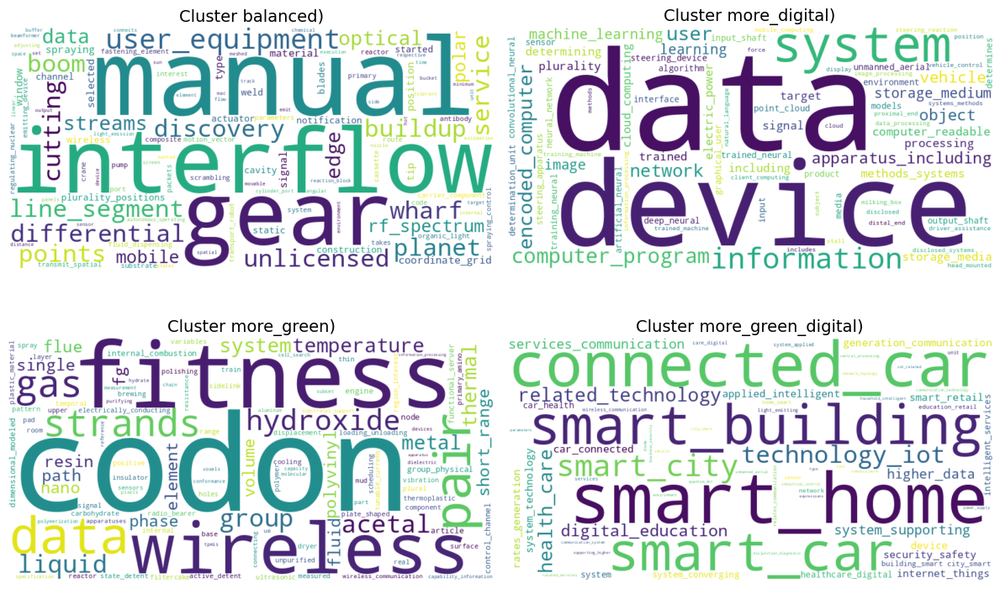

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_d.keys())
num_topics = len(topics)
rows = math.ceil(num_topics / 2)  # Number of rows needed

fig, axes = plt.subplots(rows, 2, figsize=(12, rows * 4))  # 2 columns layout
axes = axes.flatten()  # Flatten to loop easily

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_d[topic]]  # Extract words
    topic_size = len(topics)  # Compute topic size (number of words)

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic})", fontsize=14)  # Include topic size

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



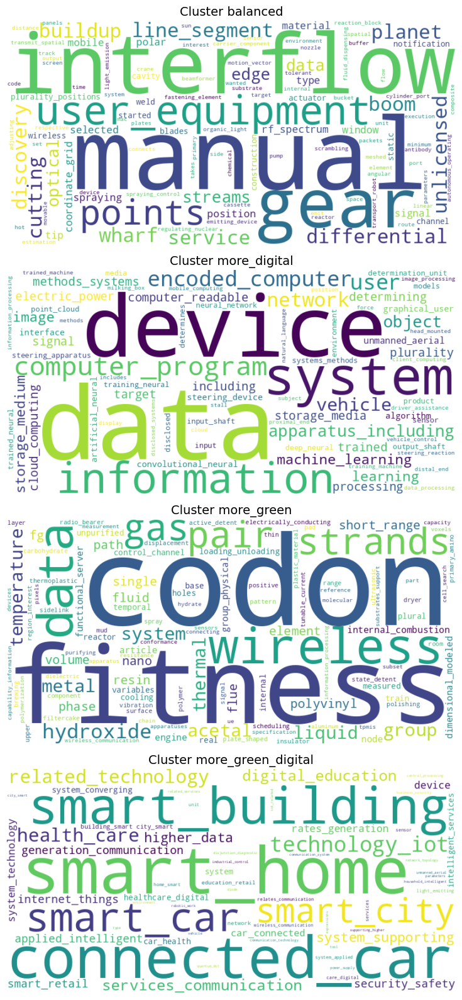

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_d.keys())
num_topics = len(topics)

fig, axes = plt.subplots(num_topics, 1, figsize=(8, num_topics * 4))  # 1 column layout
if num_topics == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one subplot

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_d[topic]]  # Extract words

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic}", fontsize=14)

plt.tight_layout()
plt.show()



# Paste k_labels with the embeddings-G

In [ ]:
partition_pca_umap=df_G

In [ ]:
partition_pca_umap

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,g_label_str,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,The invention relates to a novel interconnecto...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,The invention relates in particular to a tank ...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,The invention provides a rechargeable battery ...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","A reactor and a method are disclosed, for the ...",230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,An aerated biofilm reactor fibre membrane comp...,357,0.4792,0.6090,0.5933,more_green,0
...,...,...,...,...,...,...,...,...,...,...,...
5545,47832108,2011,en,A first selective reduction catalyst that is c...,A first selective reduction catalyst that is c...,463,0.3575,0.5995,0.5297,more_green,0
5546,45371357,2010,en,A lithium ion secondary battery which meets th...,A lithium ion secondary battery which meets th...,390,0.2264,0.6906,0.5033,more_green,0
5547,63370315,2017,en,In an aggregation control system which adjusts...,In an aggregation control system which adjusts...,450,0.4206,0.5660,0.3983,more_green_digital,3
5548,56096881,2015,en,The invention provides a lightning protection ...,The invention provides a lightning protection ...,339,0.4763,0.6539,0.5253,more_green,0


In [ ]:
# prompt: count number of means in partition

# Count the occurrences of each cluster label in the 'kmeans' column
cluster_counts = partition_pca_umap['g_label_str'].value_counts()

# Print the cluster counts
print(cluster_counts)

#Alternatively, if you want to know the number of *unique* means (clusters):
num_means = len(cluster_counts)
print(f"Number of unique means (clusters): {num_means}")


g_label_str
more_green            4731
more_green_digital     619
more_digital           136
balanced                64
Name: count, dtype: int64
Number of unique means (clusters): 4


In [ ]:
# prompt: GENERATE A DF WITH CLUSTER_COUNTS SAVE

# Assuming 'partition_pca_umap' DataFrame is already created as in your provided code.
cluster_counts = partition_pca_umap['g_label_str'].value_counts().reset_index()
cluster_counts.columns = ['green_label_num', 'count']
cluster_counts.to_csv(root_dir2+ "cluster_counts.csv", index=False) # Save to current working directory


# Topic modelling (abstracts)


In [ ]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')  # Download stopwords data if not already downloaded

stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
stop_words

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

In [ ]:
additional_stopwords1  = ['fig', 'than', 'hadn', 'either', 'am', 'himself', 'are', 'our', 'the', 'model', 'thereon', 'much', 'whereby', 'd', 'be', 'same', 'suitable', 'vice', 'can',
              "hasn't", 'prefer', 'comprise', 'sha', 'preferably', 'yours', 'described', 'being', 'accordingly', 'yet', 'essentially', 'he', 've', 'new', 'between', 'various',
              'able', 'his/her', 'toward', 'therebetween', 'had', 'wouldn', 'just', 'there', 'ie', 'anywhere', 'correspond', 'useful', 'use', 'mention', 'one another', 'together',
              'few', 'remarkably', 'typical', 'due', 'as', 'not', 'well', 'provides', 'straight forward', 'and', 'to', 'describe', "should've", "haven't", 'wherever', 'when', 'on', 'them',
              '-', 'however', 'preferred', 'me', 'and/or', 'below', 'more', 'does', 'need', 'kind', 'didn', 'another', 'thereafter', 'an', 'since', 'rather', 'present', 'once', "don't",
              'therewith', 'al', 'so', "'ve", 'particularly', 'ain', 'out', 'thereto', 'among', 'into', "that'll", 'better', 'here', 'towards', 'ourselves', "mustn't", 'off',
              'corresponding', 'moreover', 'whose', 'll', 'haven', 'in', 'disclosure', 'don', 'little', 'above-mentioned', 'good', 'would', 't', 'but', 'you', 'said', 'easily', 'wrt',
              'onto', 'is', 'sometimes', 'versa', 'only', "hadn't", 'again', 'already', 'y', 'were', 'under', 'his', 'method', "weren't", 'their', 'these', 'won', 'possibly', 'whom',
              'has', "isn't", 'therefor', 'him', 'they', 'therefrom', 'et al', 'some', 'enough', 'whereas', "you're", 'whereat', 'it', "mightn't", "won't", 'also', 'et', 'hers',
              'later', 'he/she', 'down', 'did', 'do', 'will', 'whether', 'itself', 'may', 'thereof', 'after', 'claim', 'or', 'nor', 'figs', "wasn't", "you'd", "it's", 'always',
              'overall', 'thereinto', 'yourselve', 'alternatively', 'about', 'along', 'within', 'others', 'was', 'therein', 'we', 'at', 'further', 'provide', 'this', '/',
              'straight', 'now', 'especially', 'above', 'mightn', 'yourselves', 's', 'many', 'through', 'a', 'should', 'her', 'say', 'those', 'accordance', 'during', 'desired',
              'iii', 'aren', 'then', 'until', 'substantially', 'accord', "didn't", 'according', 'o', 're', 'why', 'invention', 'from', 'for', 'like', 'significantly', 'having',
              'weren', "she's", 'via', 'with', 'eventually', 'specifically', 'no', 'respectively', 'shan', 'vice versa', "needn't", 'therefore', 'wasn', 'own', "you'll", 'hence',
              'relatively', 'therethrough', 'might', 'whatever', 'anything', 'which', 'finally', 'where', 'herself', "aren't", 'often', "wouldn't", 'needn', 'without', 'thus',
              'because', 'excellent', 'I', 'provided', 'one', 'up', 'forward', 'etc', 'been', 'ii', 'otherwise', 'instead', 'typically', "shouldn't", 'simply', 'your', 'means',
              'each', 'generally', 'have', 'thereby', 'what', 'any', 'across', 'shouldn', 'who', 'easy', 'both', 'i', 'how', 'embodiment', 'themselves', 'she', 'desire', 'while',
              'hasn', 'utility', "couldn't", 'could', 'before', 'isn', 'theirs', 'eg', 'all', 'never', 'wherein', 'against', 'other', 'doing', "shan't", 'allow', 'mustn', 'must',
              'such', "doesn't", 'very', 'herein', 'most', 'couldn', 'by', 'ours', 'furthermore', 'yourself', 'too', 'its', 'mean', 'myself', 'him/her', 'over', 'm', "you've", 'ma',
              'meanwhile', 'doesn', 'my', 'that', 'if', 'elsewhere', 'far', 'upon', 'based', 'using']

In [ ]:
additional_stopwords2  = ["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again",
"against","ain't","all","allow","allows","almost","alone","along","already","also","although","always", "am","among","amongst","an","and","another",
"any","anybody","anyhow","anyone","anything","anyway", "anyways","anywhere","apart","appear","appreciate","appropriate", "are","aren't","around","as","aside","ask",
"asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being",
"believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't",
"cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing",
"contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't",
"different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even",
"ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far", "few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets",
"getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have",
"haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him",
"himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch",
"inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept",
"know","knows","known","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly",
"many","may","maybe","me","mean","meanwhile",
"merely","might","more","moreover","most","mostly",
"much","must","my","myself","n","name",
"namely","nd","near","nearly","necessary","need",
"needs","neither","never","nevertheless","new","next",
"nine","no","nobody","non","none","noone",
"nor","normally","not","nothing","novel","now",
"nowhere","o","obviously","of","off","often",
"oh","ok","okay","old","on","once",
"one","ones","only","onto","or","other",
"others","otherwise","ought","our","ours","ourselves",
"out","outside","over","overall","own","p",
"particular","particularly","per","perhaps","placed","please",
"plus","possible","presumably","probably","provides","q",
"que","quite","qv","r","rather","rd",
"re","really","reasonably","regarding","regardless","regards",
"relatively","respectively","right","s","said","same",
"saw","say","saying","says","second","secondly",
"see","seeing","seem","seemed","seeming","seems",
"seen","self","selves","sensible","sent","serious",
"seriously","seven","several","shall","she","should",
"shouldn't","since","six","so","some","somebody",
"somehow","someone","something","sometime","sometimes","somewhat",
"somewhere","soon","sorry","specified","specify","specifying",
"still","sub","such","sup","sure","t",
"t's","take","taken","tell","tends","th",
"than","thank","thanks","thanx","that","that's",
"thats","the","their","theirs","them","themselves",
"then","thence","there","there's","thereafter","thereby",
"therefore","therein","theres","thereupon","these","they",
"they'd","they'll","they're","they've","think","third",
"this","thorough","thoroughly","those","though","three",
"through","throughout","thru","thus","to","together",
"too","took","toward","towards","tried","tries",
"truly","try","trying","twice","two","u",
"un","under","unfortunately","unless","unlikely","until",
"unto","up","upon","us","use","used",
"useful","uses","using","usually","uucp","v",
"value","various","very","via","viz","vs",
"w","want","wants","was","wasn't","way",
"we","we'd","we'll","we're","we've","welcome",
"well","went","were","weren't","what","what's",
"whatever","when","whence","whenever","where","where's",
"whereafter","whereas","whereby","wherein","whereupon","wherever",
"whether","which","while","whither","who","who's",
"whoever","whole","whom","whose","why","will",
"willing","wish","with","within","without","won't",
"wonder","would","would","wouldn't","x","y",
"yes","yet","you","you'd","you'll","you're",
"you've","your","yours","yourself","yourselves","z",
"zero"]

In [ ]:
stop_words = stopwords.words('english') + additional_stopwords1 + additional_stopwords2


In [ ]:
#more packages
import pandas as pd
from multiprocessing import Pool

In [ ]:
from gensim.utils import simple_preprocess

In [ ]:
#I use CPC codes

In [ ]:
partition_pca_umap.shape

(5550, 11)

In [ ]:
partition_pca_umap.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,g_label_str,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,The invention relates to a novel interconnecto...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,The invention relates in particular to a tank ...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,The invention provides a rechargeable battery ...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","A reactor and a method are disclosed, for the ...",230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,An aerated biofilm reactor fibre membrane comp...,357,0.4792,0.6090,0.5933,more_green,0


In [ ]:
partition_pca_umap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5550 entries, 0 to 5549
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   docdb_family_id       5550 non-null   int64  
 1   earliest_filing_year  5550 non-null   int64  
 2   appln_abstract_lg     5550 non-null   object 
 3   appln_abstract        5550 non-null   object 
 4   cleaned               5550 non-null   object 
 5   length                5550 non-null   int64  
 6   distance_to_green     5550 non-null   float64
 7   distance_to_digital   5550 non-null   float64
 8   distance_to_gd        5550 non-null   float64
 9   g_label_str           5550 non-null   object 
 10  g_label               5550 non-null   int64  
dtypes: float64(3), int64(4), object(4)
memory usage: 477.1+ KB


In [ ]:
partition=partition_pca_umap

In [ ]:
#CLEAN ABSTRACT
desc = partition.cleaned
#Convert to lower case
desc = desc.str.lower()
#Keep only alphabets and numbers
desc = desc.str.replace('[^0-9a-zA-Z]+', ' ')
desc.fillna('', inplace = True)
partition.cleaned = desc

In [ ]:
#Remove return and other things
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)

#Removing leading and trailing spaces
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


<ipython-input-236-7f48dd03abab>:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)
<ipython-input-236-7f48dd03abab>:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
#Removing Extra Spaces
partition['cleaned'] = partition['cleaned'].replace('\s+', ' ', regex=True)

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,g_label_str,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,the invention relates to a novel interconnecto...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,the invention relates in particular to a tank ...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,the invention provides a rechargeable battery ...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","a reactor and a method are disclosed, for the ...",230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,an aerated biofilm reactor fibre membrane comp...,357,0.4792,0.6090,0.5933,more_green,0


In [ ]:
from gensim.utils import simple_preprocess
import nltk

In [ ]:
# Stop word removal
partition['cleaned'] = [[word for word in simple_preprocess(str(doc),deacc=False, min_len=2, max_len=30) if word not in stop_words] for doc in partition['cleaned']]
partition['cleaned'] = partition['cleaned'].map(lambda tokens: ' '.join(tokens))

In [ ]:
partition['cleaned']

,cleaned
0,relates interconnector reactor high temperatur...
1,relates tank urea reducing agent built heating...
2,rechargeable battery unit insertion portable e...
3,reactor disclosed anaerobic treatment liquids ...
4,aerated biofilm reactor fibre membrane compris...
...,...
5545,selective reduction catalyst composed silver c...
5546,lithium ion secondary battery meets requiremen...
5547,aggregation control system adjusts electric po...
5548,lightning protection system wind turbine blade...


In [ ]:
from gensim.models.phrases import Phrases, ENGLISH_CONNECTOR_WORDS

In [ ]:
sentences = partition['cleaned'].to_list()
sentences = [doc.split(" ") for doc in sentences]

phrase_model = Phrases(sentences, connector_words=ENGLISH_CONNECTOR_WORDS, scoring = 'npmi', threshold=0.1)

In [ ]:
phrase_model

In [ ]:
print(phrase_model)

Phrases<184329 vocab, min_count=5, threshold=0.1, max_vocab_size=40000000>


In [ ]:
def bigram_pasting(sentence):
 return " ".join(phrase_model[sentence.split(" ")])

In [ ]:
print(bigram_pasting)

<function bigram_pasting at 0x7fb16d754900>


In [ ]:
dt = partition

p = Pool(10)
dt['cleaned'] = p.map(bigram_pasting, dt['cleaned'])
p.close()
p.join()

In [ ]:
dt

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,g_label_str,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.4792,0.6090,0.5933,more_green,0
...,...,...,...,...,...,...,...,...,...,...,...
5545,47832108,2011,en,A first selective reduction catalyst that is c...,selective_reduction catalyst composed silver c...,463,0.3575,0.5995,0.5297,more_green,0
5546,45371357,2010,en,A lithium ion secondary battery which meets th...,lithium_ion secondary_battery meets requiremen...,390,0.2264,0.6906,0.5033,more_green,0
5547,63370315,2017,en,In an aggregation control system which adjusts...,aggregation control_system adjusts electric_po...,450,0.4206,0.5660,0.3983,more_green_digital,3
5548,56096881,2015,en,The invention provides a lightning protection ...,lightning protection system_wind turbine_blade...,339,0.4763,0.6539,0.5253,more_green,0


In [ ]:
dt.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,g_label_str,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.4792,0.6090,0.5933,more_green,0


In [ ]:
dt.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',	'appln_abstract_lg',	'cleaned',	'length',	'distance_to_green',	'distance_to_digital',	'distance_to_gd',	'labels',	'g_label'] # Added 'cpc_7' and 'raw_data_length' to the column names

In [ ]:
docs_per_topic_mpnet_g = dt.groupby(['labels'], as_index = False).agg({'cleaned': ' '.join}) # Remove 'cpc_4' from agg since it has been dropped
# changing columns using .columns()
docs_per_topic_mpnet_g.columns = ['labels', 'cleaned'] # Adjust columns accordingly

In [ ]:
docs_per_topic_mpnet_g

,labels,cleaned
0,balanced,relates rear spoiler motor_vehicle spoiler com...
1,more_digital,user_terminal characterized control_unit ident...
2,more_green,relates interconnector reactor high_temperatur...
3,more_green_digital,power_line communication_apparatus capable per...


In [ ]:
# changing columns using .columns()
docs_per_topic_mpnet_g.columns = ['labels', 'cleaned']

In [ ]:
docs_per_topic_mpnet_g

,labels,cleaned
0,balanced,relates rear spoiler motor_vehicle spoiler com...
1,more_digital,user_terminal characterized control_unit ident...
2,more_green,relates interconnector reactor high_temperatur...
3,more_green_digital,power_line communication_apparatus capable per...


In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.4792,0.6090,0.5933,more_green,0


In [ ]:
#partition.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',	'appln_abstract_lg',	'cleaned',	'length',	'cpc_4',	'cpc_6',	'source',	'labels',	'cluster6']
# Update the list of column names to match the expected 9 columns based on Global variables and previous code.
# Make sure the column names accurately reflect the content of the columns in 'partition'.

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,g_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.4850,0.5809,0.5520,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.4423,0.5993,0.5635,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.4689,0.6297,0.5176,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.4616,0.6190,0.5992,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.4792,0.6090,0.5933,more_green,0


In [ ]:
# prompt: count partition[labels] in each category

# Assuming 'partition' DataFrame and 'labels' column exist as in your provided code.

# prompt: count partition[kmeans] in each category

# Assuming 'partition' DataFrame and 'kmeans' column exist as in your provided code.

label_counts = partition['labels'].value_counts()
label_counts
#closer_to_green_digital': 0, 'closer_to_digital': 1, 'balanced': 2}

,count
labels,
more_green,4731
more_green_digital,619
more_digital,136
balanced,64


##Model 3_1

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

stop_words = stop_words  # Replace with your list of stop words

vectorizer = CountVectorizer(stop_words=stop_words)

In [ ]:
def c_tf_idf(documents, m, ngram_range=(2,3)):
    count = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words).fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)

    return tf_idf, count

tf_idf, count = c_tf_idf(docs_per_topic_mpnet_g.cleaned.values, m=len(partition))

/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['mentioned', 'mon'] not in stop_words.
  warnings.warn(


In [ ]:
def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic_mpnet_g.labels)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(partition):
    topic_sizes = (partition.groupby('labels')
                     .appln_abstract
                     .count()
                     .reset_index()
                     .rename({"labels": "labels", "appln_abstract": "Size"}, axis='columns')
                     .sort_values("Size", ascending=False))
    return topic_sizes

In [ ]:
topic_sizes_mpnet__g=extract_topic_sizes(partition)

In [ ]:
topic_sizes_mpnet__g

,labels,Size
2,more_green,4731
3,more_green_digital,619
1,more_digital,136
0,balanced,64


In [ ]:
topic_sizes_mpnet__g["labels"]=topic_sizes_mpnet__g.index

In [ ]:
topic_sizes_mpnet__g
#{'more_green': 0, 'more_digital': 1, 'balanced': 2}

,labels,Size
2,2,4731
3,3,619
1,1,136
0,0,64


In [ ]:
docs_per_topic_mpnet_g.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   labels   4 non-null      object
 1   cleaned  4 non-null      object
dtypes: object(2)
memory usage: 196.0+ bytes


In [ ]:
#docs_per_topic_mpnet_gds.columns = ['labels', 'appln_abstract', 'cpc_class_symbol']

In [ ]:
print(docs_per_topic_mpnet_g)

               labels                                            cleaned
0            balanced  relates rear spoiler motor_vehicle spoiler com...
1        more_digital  user_terminal characterized control_unit ident...
2          more_green  relates interconnector reactor high_temperatur...
3  more_green_digital  power_line communication_apparatus capable per...


In [ ]:
import sklearn
print(sklearn.__version__)

1.6.1


In [ ]:
top_n_words_mpnet_g = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_g, n=80)

In [ ]:
top_n_words_mpnet_g

{'balanced': [('volatile_memory volatile_memory', 0.006111308431502859),
  ('preform_handling tool', 0.006111308431502859),
  ('encoding_bit rate', 0.006111308431502859),
  ('rod forming', 0.005044628792484287),
  ('media stream', 0.005044628792484287),
  ('seat back', 0.005044628792484287),
  ('ack transmission_rate', 0.005044628792484287),
  ('data symbols', 0.005044628792484287),
  ('variable frame_element', 0.005044628792484287),
  ('resiliently variable', 0.005044628792484287),
  ('force_transmission fitting', 0.005044628792484287),
  ('resiliently variable frame_element', 0.005044628792484287),
  ('repeating audio', 0.005044628792484287),
  ('stage registers', 0.005044628792484287),
  ('front hatch', 0.005044628792484287),
  ('bit positions', 0.005044628792484287),
  ('rod forming portion', 0.005044628792484287),
  ('nucleic_acid complex', 0.005044628792484287),
  ('forming portion', 0.005044628792484287),
  ('intelligibility audio_signal', 0.005044628792484287),
  ('travel mode'

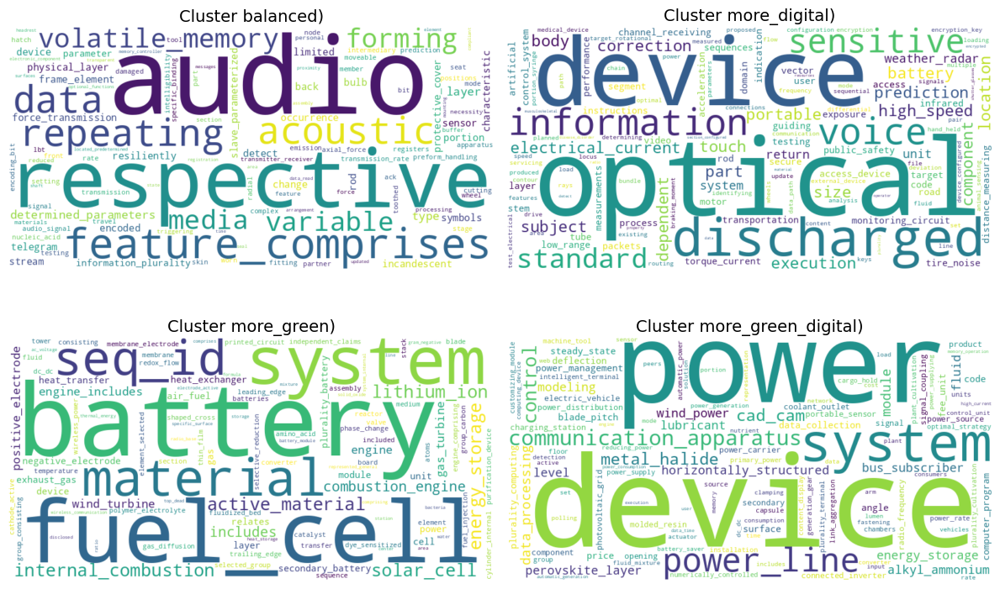

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_g.keys())
num_topics = len(topics)
rows = math.ceil(num_topics / 2)  # Number of rows needed

fig, axes = plt.subplots(rows, 2, figsize=(12, rows * 4))  # 2 columns layout
axes = axes.flatten()  # Flatten to loop easily

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_g[topic]]  # Extract words
    topic_size = len(topics)  # Compute topic size (number of words)

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic})", fontsize=14)  # Include topic size

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



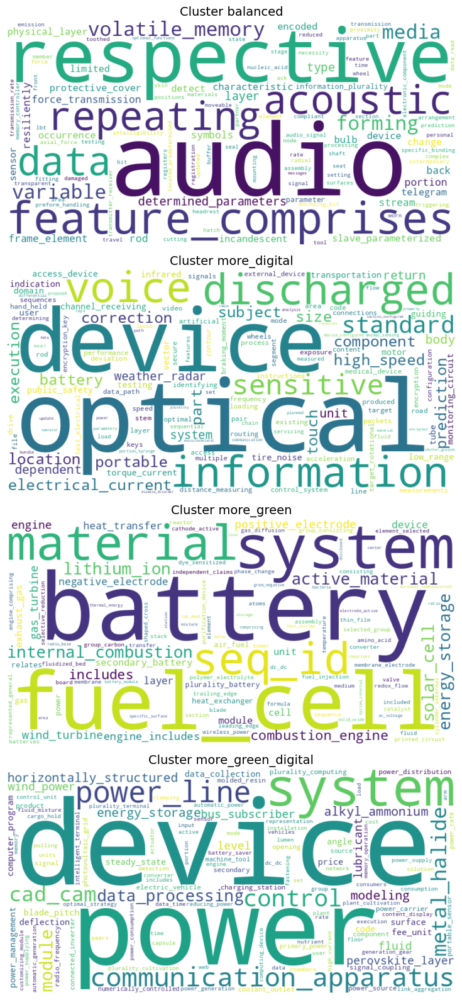

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_g.keys())
num_topics = len(topics)

fig, axes = plt.subplots(num_topics, 1, figsize=(8, num_topics * 4))  # 1 column layout
if num_topics == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one subplot

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_g[topic]]  # Extract words

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic}", fontsize=14)

plt.tight_layout()
plt.show()




#Overlapping

In [ ]:
####overlapping

In [ ]:
# prompt: PRINT COLUMNS OF  df_G, df_D, df_GD

print("Columns of df_G:", df_G.columns.tolist())
print("Columns of df_D:", df_D.columns.tolist())
print("Columns of df_GD:", df_GD.columns.tolist())


Columns of df_G: ['docdb_family_id', 'earliest_filing_year', 'appln_abstract_lg', 'appln_abstract', 'cleaned', 'length', 'distance_to_green', 'distance_to_digital', 'distance_to_gd', 'g_label_str', 'g_label']
Columns of df_D: ['docdb_family_id', 'earliest_filing_year', 'appln_abstract_lg', 'appln_abstract', 'cleaned', 'length', 'distance_to_green', 'distance_to_digital', 'distance_to_gd', 'd_label_str', 'd_label']
Columns of df_GD: ['docdb_family_id', 'appln_abstract', 'appln_abstract_lg', 'earliest_filing_year', 'cleaned', 'length', 'distance_to_green', 'distance_to_digital', 'distance_to_gd', 'gd_label_str', 'gd_label']


In [ ]:
df_G.rename(columns={'g_label_str': 'all_label_str', 'g_label': 'all_label'}, inplace=True)

In [ ]:
df_D.rename(columns={'d_label_str': 'all_label_str', 'd_label': 'all_label'}, inplace=True)

In [ ]:
df_GD.rename(columns={'gd_label_str': 'all_label_str', 'gd_label': 'all_label'}, inplace=True)

In [ ]:
# prompt: stack df_G, df_D, df_GD

import pandas as pd
# Concatenate the DataFrames
df_stacked = pd.concat([df_G, df_D, df_GD], ignore_index=True)

# Display the first few rows of the stacked DataFrame
print(df_stacked.head())

# Display the shape of the stacked DataFrame
print("\nShape of the stacked DataFrame:", df_stacked.shape)

# Display value counts for the new 'all_label_str' column to see the distribution
print("\nValue counts for combined labels:\n", df_stacked['all_label_str'].value_counts())
df_stacked

   docdb_family_id  earliest_filing_year appln_abstract_lg  \
0         42732849                  2010                en   
1         43027483                  2010                en   
2         41566409                  2008                en   
3         32010960                  2002                en   
4         50554875                  2014                en   

                                      appln_abstract  \
0  The invention relates to a novel interconnecto...   
1  The invention relates in particular to a tank ...   
2  The invention provides a rechargeable battery ...   
3  A reactor and a method are disclosed, for the ...   
4  An aerated biofilm reactor fibre membrane comp...   

                                             cleaned  length  \
0  the invention relates to a novel interconnecto...     111   
1  the invention relates in particular to a tank ...     137   
2  the invention provides a rechargeable battery ...      87   
3  a reactor and a method are disc

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,all_label_str,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,the invention relates to a novel interconnecto...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,the invention relates in particular to a tank ...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,the invention provides a rechargeable battery ...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","a reactor and a method are disclosed, for the ...",230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,an aerated biofilm reactor fibre membrane comp...,357,0.479235,0.608962,0.593311,more_green,0
...,...,...,...,...,...,...,...,...,...,...,...
16645,38951298,2007,en,The invention relates to a stand-alone shuttle...,the invention relates to a stand-alone shuttle...,144,0.476156,0.530608,0.429942,more_green,0
16646,40474199,2007,en,The arrangement has an electric device (2) e.g...,the arrangement has an electric device e.g. el...,79,0.463621,0.478759,0.408373,more_green,0
16647,37875493,2006,en,"A method of determining, for each of one or mo...","a method of determining, for each of one or mo...",255,0.465064,0.465269,0.324795,balanced,2
16648,67438865,2019,en,A method operates a technical or non-technical...,a method operates a technical or non-technical...,147,0.462961,0.406249,0.418888,more_digital,1


# Paste k_labels with the embeddings

In [ ]:
partition_pca_umap=df_stacked

In [ ]:
partition_pca_umap

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,all_label_str,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,the invention relates to a novel interconnecto...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,the invention relates in particular to a tank ...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,the invention provides a rechargeable battery ...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","a reactor and a method are disclosed, for the ...",230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,an aerated biofilm reactor fibre membrane comp...,357,0.479235,0.608962,0.593311,more_green,0
...,...,...,...,...,...,...,...,...,...,...,...
16645,38951298,2007,en,The invention relates to a stand-alone shuttle...,the invention relates to a stand-alone shuttle...,144,0.476156,0.530608,0.429942,more_green,0
16646,40474199,2007,en,The arrangement has an electric device (2) e.g...,the arrangement has an electric device e.g. el...,79,0.463621,0.478759,0.408373,more_green,0
16647,37875493,2006,en,"A method of determining, for each of one or mo...","a method of determining, for each of one or mo...",255,0.465064,0.465269,0.324795,balanced,2
16648,67438865,2019,en,A method operates a technical or non-technical...,a method operates a technical or non-technical...,147,0.462961,0.406249,0.418888,more_digital,1


In [ ]:
# prompt: count number of means in partition

# Count the occurrences of each cluster label in the 'kmeans' column
cluster_counts = partition_pca_umap['all_label_str'].value_counts()

# Print the cluster counts
print(cluster_counts)

#Alternatively, if you want to know the number of *unique* means (clusters):
num_means = len(cluster_counts)
print(f"Number of unique means (clusters): {num_means}")


all_label_str
more_green            7783
more_digital          5586
more_green_digital    2580
balanced               701
Name: count, dtype: int64
Number of unique means (clusters): 4


In [ ]:
# prompt: GENERATE A DF WITH CLUSTER_COUNTS SAVE

# Assuming 'partition_pca_umap' DataFrame is already created as in your provided code.
cluster_counts = partition_pca_umap['all_label_str'].value_counts().reset_index()
cluster_counts.columns = ['green_label_num', 'count']
cluster_counts.to_csv(root_dir2+ "cluster_counts.csv", index=False) # Save to current working directory


# Topic modelling (abstracts)


In [ ]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')  # Download stopwords data if not already downloaded

stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
stop_words

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

In [ ]:
additional_stopwords1  = ['fig', 'than', 'hadn', 'either', 'am', 'himself', 'are', 'our', 'the', 'model', 'thereon', 'much', 'whereby', 'd', 'be', 'same', 'suitable', 'vice', 'can',
              "hasn't", 'prefer', 'comprise', 'sha', 'preferably', 'yours', 'described', 'being', 'accordingly', 'yet', 'essentially', 'he', 've', 'new', 'between', 'various',
              'able', 'his/her', 'toward', 'therebetween', 'had', 'wouldn', 'just', 'there', 'ie', 'anywhere', 'correspond', 'useful', 'use', 'mention', 'one another', 'together',
              'few', 'remarkably', 'typical', 'due', 'as', 'not', 'well', 'provides', 'straight forward', 'and', 'to', 'describe', "should've", "haven't", 'wherever', 'when', 'on', 'them',
              '-', 'however', 'preferred', 'me', 'and/or', 'below', 'more', 'does', 'need', 'kind', 'didn', 'another', 'thereafter', 'an', 'since', 'rather', 'present', 'once', "don't",
              'therewith', 'al', 'so', "'ve", 'particularly', 'ain', 'out', 'thereto', 'among', 'into', "that'll", 'better', 'here', 'towards', 'ourselves', "mustn't", 'off',
              'corresponding', 'moreover', 'whose', 'll', 'haven', 'in', 'disclosure', 'don', 'little', 'above-mentioned', 'good', 'would', 't', 'but', 'you', 'said', 'easily', 'wrt',
              'onto', 'is', 'sometimes', 'versa', 'only', "hadn't", 'again', 'already', 'y', 'were', 'under', 'his', 'method', "weren't", 'their', 'these', 'won', 'possibly', 'whom',
              'has', "isn't", 'therefor', 'him', 'they', 'therefrom', 'et al', 'some', 'enough', 'whereas', "you're", 'whereat', 'it', "mightn't", "won't", 'also', 'et', 'hers',
              'later', 'he/she', 'down', 'did', 'do', 'will', 'whether', 'itself', 'may', 'thereof', 'after', 'claim', 'or', 'nor', 'figs', "wasn't", "you'd", "it's", 'always',
              'overall', 'thereinto', 'yourselve', 'alternatively', 'about', 'along', 'within', 'others', 'was', 'therein', 'we', 'at', 'further', 'provide', 'this', '/',
              'straight', 'now', 'especially', 'above', 'mightn', 'yourselves', 's', 'many', 'through', 'a', 'should', 'her', 'say', 'those', 'accordance', 'during', 'desired',
              'iii', 'aren', 'then', 'until', 'substantially', 'accord', "didn't", 'according', 'o', 're', 'why', 'invention', 'from', 'for', 'like', 'significantly', 'having',
              'weren', "she's", 'via', 'with', 'eventually', 'specifically', 'no', 'respectively', 'shan', 'vice versa', "needn't", 'therefore', 'wasn', 'own', "you'll", 'hence',
              'relatively', 'therethrough', 'might', 'whatever', 'anything', 'which', 'finally', 'where', 'herself', "aren't", 'often', "wouldn't", 'needn', 'without', 'thus',
              'because', 'excellent', 'I', 'provided', 'one', 'up', 'forward', 'etc', 'been', 'ii', 'otherwise', 'instead', 'typically', "shouldn't", 'simply', 'your', 'means',
              'each', 'generally', 'have', 'thereby', 'what', 'any', 'across', 'shouldn', 'who', 'easy', 'both', 'i', 'how', 'embodiment', 'themselves', 'she', 'desire', 'while',
              'hasn', 'utility', "couldn't", 'could', 'before', 'isn', 'theirs', 'eg', 'all', 'never', 'wherein', 'against', 'other', 'doing', "shan't", 'allow', 'mustn', 'must',
              'such', "doesn't", 'very', 'herein', 'most', 'couldn', 'by', 'ours', 'furthermore', 'yourself', 'too', 'its', 'mean', 'myself', 'him/her', 'over', 'm', "you've", 'ma',
              'meanwhile', 'doesn', 'my', 'that', 'if', 'elsewhere', 'far', 'upon', 'based', 'using']

In [ ]:
additional_stopwords2  = ["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again",
"against","ain't","all","allow","allows","almost","alone","along","already","also","although","always", "am","among","amongst","an","and","another",
"any","anybody","anyhow","anyone","anything","anyway", "anyways","anywhere","apart","appear","appreciate","appropriate", "are","aren't","around","as","aside","ask",
"asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being",
"believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't",
"cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing",
"contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't",
"different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even",
"ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far", "few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets",
"getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have",
"haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him",
"himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch",
"inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept",
"know","knows","known","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly",
"many","may","maybe","me","mean","meanwhile",
"merely","might","more","moreover","most","mostly",
"much","must","my","myself","n","name",
"namely","nd","near","nearly","necessary","need",
"needs","neither","never","nevertheless","new","next",
"nine","no","nobody","non","none","noone",
"nor","normally","not","nothing","novel","now",
"nowhere","o","obviously","of","off","often",
"oh","ok","okay","old","on","once",
"one","ones","only","onto","or","other",
"others","otherwise","ought","our","ours","ourselves",
"out","outside","over","overall","own","p",
"particular","particularly","per","perhaps","placed","please",
"plus","possible","presumably","probably","provides","q",
"que","quite","qv","r","rather","rd",
"re","really","reasonably","regarding","regardless","regards",
"relatively","respectively","right","s","said","same",
"saw","say","saying","says","second","secondly",
"see","seeing","seem","seemed","seeming","seems",
"seen","self","selves","sensible","sent","serious",
"seriously","seven","several","shall","she","should",
"shouldn't","since","six","so","some","somebody",
"somehow","someone","something","sometime","sometimes","somewhat",
"somewhere","soon","sorry","specified","specify","specifying",
"still","sub","such","sup","sure","t",
"t's","take","taken","tell","tends","th",
"than","thank","thanks","thanx","that","that's",
"thats","the","their","theirs","them","themselves",
"then","thence","there","there's","thereafter","thereby",
"therefore","therein","theres","thereupon","these","they",
"they'd","they'll","they're","they've","think","third",
"this","thorough","thoroughly","those","though","three",
"through","throughout","thru","thus","to","together",
"too","took","toward","towards","tried","tries",
"truly","try","trying","twice","two","u",
"un","under","unfortunately","unless","unlikely","until",
"unto","up","upon","us","use","used",
"useful","uses","using","usually","uucp","v",
"value","various","very","via","viz","vs",
"w","want","wants","was","wasn't","way",
"we","we'd","we'll","we're","we've","welcome",
"well","went","were","weren't","what","what's",
"whatever","when","whence","whenever","where","where's",
"whereafter","whereas","whereby","wherein","whereupon","wherever",
"whether","which","while","whither","who","who's",
"whoever","whole","whom","whose","why","will",
"willing","wish","with","within","without","won't",
"wonder","would","would","wouldn't","x","y",
"yes","yet","you","you'd","you'll","you're",
"you've","your","yours","yourself","yourselves","z",
"zero"]

In [ ]:
stop_words = stopwords.words('english') + additional_stopwords1 + additional_stopwords2


In [ ]:
#more packages
import pandas as pd
from multiprocessing import Pool

In [ ]:
from gensim.utils import simple_preprocess

In [ ]:
#I use CPC codes

In [ ]:
partition_pca_umap.shape

(16650, 11)

In [ ]:
partition_pca_umap.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,all_label_str,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,the invention relates to a novel interconnecto...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,the invention relates in particular to a tank ...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,the invention provides a rechargeable battery ...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","a reactor and a method are disclosed, for the ...",230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,an aerated biofilm reactor fibre membrane comp...,357,0.479235,0.608962,0.593311,more_green,0


In [ ]:
partition_pca_umap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16650 entries, 0 to 16649
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   docdb_family_id       16650 non-null  int64  
 1   earliest_filing_year  16650 non-null  int64  
 2   appln_abstract_lg     16650 non-null  object 
 3   appln_abstract        16650 non-null  object 
 4   cleaned               16650 non-null  object 
 5   length                16650 non-null  int64  
 6   distance_to_green     16650 non-null  float64
 7   distance_to_digital   16650 non-null  float64
 8   distance_to_gd        16650 non-null  float64
 9   all_label_str         16650 non-null  object 
 10  all_label             16650 non-null  int64  
dtypes: float64(3), int64(4), object(4)
memory usage: 1.4+ MB


In [ ]:
partition=partition_pca_umap

In [ ]:
#CLEAN ABSTRACT
desc = partition.cleaned
#Convert to lower case
desc = desc.str.lower()
#Keep only alphabets and numbers
desc = desc.str.replace('[^0-9a-zA-Z]+', ' ')
desc.fillna('', inplace = True)
partition.cleaned = desc

In [ ]:
#Remove return and other things
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)

#Removing leading and trailing spaces
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


<ipython-input-352-7f48dd03abab>:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)
<ipython-input-352-7f48dd03abab>:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
#Removing Extra Spaces
partition['cleaned'] = partition['cleaned'].replace('\s+', ' ', regex=True)

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,all_label_str,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,the invention relates to a novel interconnecto...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,the invention relates in particular to a tank ...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,the invention provides a rechargeable battery ...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...","a reactor and a method are disclosed, for the ...",230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,an aerated biofilm reactor fibre membrane comp...,357,0.479235,0.608962,0.593311,more_green,0


In [ ]:
from gensim.utils import simple_preprocess
import nltk

In [ ]:
# Stop word removal
partition['cleaned'] = [[word for word in simple_preprocess(str(doc),deacc=False, min_len=2, max_len=30) if word not in stop_words] for doc in partition['cleaned']]
partition['cleaned'] = partition['cleaned'].map(lambda tokens: ' '.join(tokens))

In [ ]:
partition['cleaned']

,cleaned
0,relates interconnector reactor high temperatur...
1,relates tank urea reducing agent built heating...
2,rechargeable battery unit insertion portable e...
3,reactor disclosed anaerobic treatment liquids ...
4,aerated biofilm reactor fibre membrane compris...
...,...
16645,relates stand shuttle conveyor intended storag...
16646,arrangement electric device electrical socket ...
16647,determining elemental periods statistically re...
16648,operates technical technical system informatio...


In [ ]:
from gensim.models.phrases import Phrases, ENGLISH_CONNECTOR_WORDS

In [ ]:
sentences = partition['cleaned'].to_list()
sentences = [doc.split(" ") for doc in sentences]

phrase_model = Phrases(sentences, connector_words=ENGLISH_CONNECTOR_WORDS, scoring = 'npmi', threshold=0.1)

In [ ]:
phrase_model

In [ ]:
print(phrase_model)

Phrases<504359 vocab, min_count=5, threshold=0.1, max_vocab_size=40000000>


In [ ]:
def bigram_pasting(sentence):
  return " ".join(phrase_model[sentence.split(" ")])

In [ ]:
print(bigram_pasting)

<function bigram_pasting at 0x7a7f7e813420>


In [ ]:
dt = partition

p = Pool(10)
dt['cleaned'] = p.map(bigram_pasting, dt['cleaned'])
p.close()
p.join()

In [ ]:
dt

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,all_label_str,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.479235,0.608962,0.593311,more_green,0
...,...,...,...,...,...,...,...,...,...,...,...
16645,38951298,2007,en,The invention relates to a stand-alone shuttle...,relates stand shuttle conveyor intended storag...,144,0.476156,0.530608,0.429942,more_green,0
16646,40474199,2007,en,The arrangement has an electric device (2) e.g...,arrangement_electric device electrical socket ...,79,0.463621,0.478759,0.408373,more_green,0
16647,37875493,2006,en,"A method of determining, for each of one or mo...",determining elemental periods statistically re...,255,0.465064,0.465269,0.324795,balanced,2
16648,67438865,2019,en,A method operates a technical or non-technical...,operates technical technical_system informatio...,147,0.462961,0.406249,0.418888,more_digital,1


In [ ]:
dt.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,all_label_str,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.479235,0.608962,0.593311,more_green,0


In [ ]:
dt

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,all_label_str,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.479235,0.608962,0.593311,more_green,0
...,...,...,...,...,...,...,...,...,...,...,...
16645,38951298,2007,en,The invention relates to a stand-alone shuttle...,relates stand shuttle conveyor intended storag...,144,0.476156,0.530608,0.429942,more_green,0
16646,40474199,2007,en,The arrangement has an electric device (2) e.g...,arrangement_electric device electrical socket ...,79,0.463621,0.478759,0.408373,more_green,0
16647,37875493,2006,en,"A method of determining, for each of one or mo...",determining elemental periods statistically re...,255,0.465064,0.465269,0.324795,balanced,2
16648,67438865,2019,en,A method operates a technical or non-technical...,operates technical technical_system informatio...,147,0.462961,0.406249,0.418888,more_digital,1


In [ ]:
dt.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract_lg',	'appln_abstract',	'cleaned',	'length',	'distance_to_green',	'distance_to_digital',	'distance_to_gd',	'labels',	'all_label']

In [ ]:
docs_per_topic_mpnet_gd = dt.groupby(['labels'], as_index = False).agg({'cleaned': ' '.join}) # Remove 'cpc_4' from agg since it has been dropped
# changing columns using .columns()
docs_per_topic_mpnet_gd.columns = ['labels', 'cleaned'] # Adjust columns accordingly

In [ ]:
docs_per_topic_mpnet_gd

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# changing columns using .columns()
docs_per_topic_mpnet_gd.columns = ['labels', 'cleaned']

In [ ]:
docs_per_topic_mpnet_gd

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.479235,0.608962,0.593311,more_green,0


In [ ]:
#partition.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',	'appln_abstract_lg',	'cleaned',	'length',	'cpc_4',	'cpc_6',	'source',	'labels',	'cluster6']
# Update the list of column names to match the expected 9 columns based on Global variables and previous code.
# Make sure the column names accurately reflect the content of the columns in 'partition'.

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract_lg,appln_abstract,cleaned,length,distance_to_green,distance_to_digital,distance_to_gd,labels,all_label
0,42732849,2010,en,The invention relates to a novel interconnecto...,relates interconnector reactor high_temperatur...,111,0.484962,0.580925,0.551966,more_green,0
1,43027483,2010,en,The invention relates in particular to a tank ...,relates tank urea reducing_agent built heating...,137,0.442323,0.599325,0.563452,more_green,0
2,41566409,2008,en,The invention provides a rechargeable battery ...,rechargeable_battery unit insertion portable_e...,87,0.468936,0.629655,0.517588,more_green,0
3,32010960,2002,en,"A reactor and a method are disclosed, for the ...",reactor disclosed anaerobic treatment liquids ...,230,0.461601,0.619039,0.599168,more_green,0
4,50554875,2014,en,An aerated biofilm reactor fibre membrane comp...,aerated biofilm reactor fibre_membrane compris...,357,0.479235,0.608962,0.593311,more_green,0


In [ ]:
# prompt: count partition[labels] in each category

# Assuming 'partition' DataFrame and 'labels' column exist as in your provided code.

# prompt: count partition[kmeans] in each category

# Assuming 'partition' DataFrame and 'kmeans' column exist as in your provided code.

label_counts = partition['labels'].value_counts()
label_counts
#closer_to_green_digital': 0, 'closer_to_digital': 1, 'balanced': 2}

,count
labels,
more_green,7783
more_digital,5586
more_green_digital,2580
balanced,701


##Model 3_1

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

stop_words = stop_words  # Replace with your list of stop words

vectorizer = CountVectorizer(stop_words=stop_words)

In [ ]:
## OVERLAPPYIN

In [ ]:
def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic_mpnet_gd.labels)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def get_overlapping_words(top_n_words):
    # Flatten all words in all topics into a list
    all_words = [word for topic_words in top_n_words.values() for word, score in topic_words]

    # Count frequency of each word across topics
    from collections import Counter
    word_counts = Counter(all_words)

    # Keep words that appear in more than one topic
    overlapping_words = {word for word, count in word_counts.items() if count > 1}

    # Filter each topic's words to only those that overlap
    overlapping_top_n_words = {
        topic: [(word, score) for word, score in words if word in overlapping_words]
        for topic, words in top_n_words.items()
    }

    return overlapping_top_n_words

# Usage example:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100)
overlap_words = get_overlapping_words(top_n_words)

# `overlap_words` now contains only words that appear in multiple topics
print(overlap_words)


{'balanced': [], 'more_digital': [], 'more_green': [], 'more_green_digital': []}


In [ ]:
overlap_words

{'balanced': [],
 'more_digital': [],
 'more_green': [],
 'more_green_digital': []}

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordclouds(top_n_words, max_words=100):
    for topic, words_scores in top_n_words.items():
        freq_dict = {word: score for word, score in words_scores[:max_words]}
        if not freq_dict:
            print(f"No overlapping words for topic {topic}")
            continue
        wc = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dict)
        plt.figure(figsize=(10, 5))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Overlapping Word Cloud for Topic {topic}", fontsize=16)
        plt.show()



In [ ]:
# Get your top words per topic (from your existing code)
top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100)

# Filter to only overlapping words
overlap_words = get_overlapping_words(top_n_words)

# Plot word clouds of overlapping words per topic
plot_wordclouds(overlap_words, max_words=50)

No overlapping words for topic balanced
No overlapping words for topic more_digital
No overlapping words for topic more_green
No overlapping words for topic more_green_digital


# Paste k_labels with the embeddings-HDBSCAN

In [ ]:
partition_pca_umap=df_union

In [ ]:
partition_pca_umap

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,cluster_label
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D,17
...,...,...,...,...,...,...,...,...
16645,38951298,2007,The invention relates to a stand-alone shuttle...,en,The invention relates to a stand-alone shuttle...,144,GD,-1
16646,40474199,2007,The arrangement has an electric device (2) e.g...,en,The arrangement has an electric device e.g. el...,79,GD,10
16647,37875493,2006,"A method of determining, for each of one or mo...",en,"A method of determining, for each of one or mo...",255,GD,10
16648,67438865,2019,A method operates a technical or non-technical...,en,A method operates a technical or non-technical...,147,GD,-1


In [ ]:
# prompt: count number of means in partition

# Count the occurrences of each cluster label in the 'kmeans' column
cluster_counts = partition_pca_umap['cluster_label'].value_counts()

# Print the cluster counts
print(cluster_counts)

#Alternatively, if you want to know the number of *unique* means (clusters):
num_means = len(cluster_counts)
print(f"Number of unique means (clusters): {num_means}")


cluster_label
-1     4383
 10    1735
 11     893
 17     748
 14     637
 3      596
 4      586
 6      577
 32     488
 24     480
 23     407
 13     385
 21     383
 7      373
 36     299
 20     282
 30     279
 1      250
 9      244
 33     231
 18     212
 25     207
 8      184
 34     184
 29     167
 19     165
 22     158
 27     153
 16     127
 15     126
 31     125
 0      122
 2      116
 12     109
 5      103
 28      87
 26      28
 35      21
Name: count, dtype: int64
Number of unique means (clusters): 38


In [ ]:
# prompt: GENERATE A DF WITH CLUSTER_COUNTS SAVE

# Assuming 'partition_pca_umap' DataFrame is already created as in your provided code.
cluster_counts = partition_pca_umap['cluster_label'].value_counts().reset_index()
cluster_counts.columns = ['green_label_num', 'count']
cluster_counts.to_csv(root_dir2+ "cluster_counts.csv", index=False) # Save to current working directory


# Topic modelling (abstracts)


In [ ]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')  # Download stopwords data if not already downloaded

stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
stop_words

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

In [ ]:
additional_stopwords1  = ['fig', 'than', 'hadn', 'either', 'am', 'himself', 'are', 'our', 'the', 'model', 'thereon', 'much', 'whereby', 'd', 'be', 'same', 'suitable', 'vice', 'can',
              "hasn't", 'prefer', 'comprise', 'sha', 'preferably', 'yours', 'described', 'being', 'accordingly', 'yet', 'essentially', 'he', 've', 'new', 'between', 'various',
              'able', 'his/her', 'toward', 'therebetween', 'had', 'wouldn', 'just', 'there', 'ie', 'anywhere', 'correspond', 'useful', 'use', 'mention', 'one another', 'together',
              'few', 'remarkably', 'typical', 'due', 'as', 'not', 'well', 'provides', 'straight forward', 'and', 'to', 'describe', "should've", "haven't", 'wherever', 'when', 'on', 'them',
              '-', 'however', 'preferred', 'me', 'and/or', 'below', 'more', 'does', 'need', 'kind', 'didn', 'another', 'thereafter', 'an', 'since', 'rather', 'present', 'once', "don't",
              'therewith', 'al', 'so', "'ve", 'particularly', 'ain', 'out', 'thereto', 'among', 'into', "that'll", 'better', 'here', 'towards', 'ourselves', "mustn't", 'off',
              'corresponding', 'moreover', 'whose', 'll', 'haven', 'in', 'disclosure', 'don', 'little', 'above-mentioned', 'good', 'would', 't', 'but', 'you', 'said', 'easily', 'wrt',
              'onto', 'is', 'sometimes', 'versa', 'only', "hadn't", 'again', 'already', 'y', 'were', 'under', 'his', 'method', "weren't", 'their', 'these', 'won', 'possibly', 'whom',
              'has', "isn't", 'therefor', 'him', 'they', 'therefrom', 'et al', 'some', 'enough', 'whereas', "you're", 'whereat', 'it', "mightn't", "won't", 'also', 'et', 'hers',
              'later', 'he/she', 'down', 'did', 'do', 'will', 'whether', 'itself', 'may', 'thereof', 'after', 'claim', 'or', 'nor', 'figs', "wasn't", "you'd", "it's", 'always',
              'overall', 'thereinto', 'yourselve', 'alternatively', 'about', 'along', 'within', 'others', 'was', 'therein', 'we', 'at', 'further', 'provide', 'this', '/',
              'straight', 'now', 'especially', 'above', 'mightn', 'yourselves', 's', 'many', 'through', 'a', 'should', 'her', 'say', 'those', 'accordance', 'during', 'desired',
              'iii', 'aren', 'then', 'until', 'substantially', 'accord', "didn't", 'according', 'o', 're', 'why', 'invention', 'from', 'for', 'like', 'significantly', 'having',
              'weren', "she's", 'via', 'with', 'eventually', 'specifically', 'no', 'respectively', 'shan', 'vice versa', "needn't", 'therefore', 'wasn', 'own', "you'll", 'hence',
              'relatively', 'therethrough', 'might', 'whatever', 'anything', 'which', 'finally', 'where', 'herself', "aren't", 'often', "wouldn't", 'needn', 'without', 'thus',
              'because', 'excellent', 'I', 'provided', 'one', 'up', 'forward', 'etc', 'been', 'ii', 'otherwise', 'instead', 'typically', "shouldn't", 'simply', 'your', 'means',
              'each', 'generally', 'have', 'thereby', 'what', 'any', 'across', 'shouldn', 'who', 'easy', 'both', 'i', 'how', 'embodiment', 'themselves', 'she', 'desire', 'while',
              'hasn', 'utility', "couldn't", 'could', 'before', 'isn', 'theirs', 'eg', 'all', 'never', 'wherein', 'against', 'other', 'doing', "shan't", 'allow', 'mustn', 'must',
              'such', "doesn't", 'very', 'herein', 'most', 'couldn', 'by', 'ours', 'furthermore', 'yourself', 'too', 'its', 'mean', 'myself', 'him/her', 'over', 'm', "you've", 'ma',
              'meanwhile', 'doesn', 'my', 'that', 'if', 'elsewhere', 'far', 'upon', 'based', 'using']

In [ ]:
additional_stopwords2  = ["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again",
"against","ain't","all","allow","allows","almost","alone","along","already","also","although","always", "am","among","amongst","an","and","another",
"any","anybody","anyhow","anyone","anything","anyway", "anyways","anywhere","apart","appear","appreciate","appropriate", "are","aren't","around","as","aside","ask",
"asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being",
"believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't",
"cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing",
"contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't",
"different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even",
"ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far", "few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets",
"getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have",
"haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him",
"himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch",
"inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept",
"know","knows","known","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly",
"many","may","maybe","me","mean","meanwhile",
"merely","might","more","moreover","most","mostly",
"much","must","my","myself","n","name",
"namely","nd","near","nearly","necessary","need",
"needs","neither","never","nevertheless","new","next",
"nine","no","nobody","non","none","noone",
"nor","normally","not","nothing","novel","now",
"nowhere","o","obviously","of","off","often",
"oh","ok","okay","old","on","once",
"one","ones","only","onto","or","other",
"others","otherwise","ought","our","ours","ourselves",
"out","outside","over","overall","own","p",
"particular","particularly","per","perhaps","placed","please",
"plus","possible","presumably","probably","provides","q",
"que","quite","qv","r","rather","rd",
"re","really","reasonably","regarding","regardless","regards",
"relatively","respectively","right","s","said","same",
"saw","say","saying","says","second","secondly",
"see","seeing","seem","seemed","seeming","seems",
"seen","self","selves","sensible","sent","serious",
"seriously","seven","several","shall","she","should",
"shouldn't","since","six","so","some","somebody",
"somehow","someone","something","sometime","sometimes","somewhat",
"somewhere","soon","sorry","specified","specify","specifying",
"still","sub","such","sup","sure","t",
"t's","take","taken","tell","tends","th",
"than","thank","thanks","thanx","that","that's",
"thats","the","their","theirs","them","themselves",
"then","thence","there","there's","thereafter","thereby",
"therefore","therein","theres","thereupon","these","they",
"they'd","they'll","they're","they've","think","third",
"this","thorough","thoroughly","those","though","three",
"through","throughout","thru","thus","to","together",
"too","took","toward","towards","tried","tries",
"truly","try","trying","twice","two","u",
"un","under","unfortunately","unless","unlikely","until",
"unto","up","upon","us","use","used",
"useful","uses","using","usually","uucp","v",
"value","various","very","via","viz","vs",
"w","want","wants","was","wasn't","way",
"we","we'd","we'll","we're","we've","welcome",
"well","went","were","weren't","what","what's",
"whatever","when","whence","whenever","where","where's",
"whereafter","whereas","whereby","wherein","whereupon","wherever",
"whether","which","while","whither","who","who's",
"whoever","whole","whom","whose","why","will",
"willing","wish","with","within","without","won't",
"wonder","would","would","wouldn't","x","y",
"yes","yet","you","you'd","you'll","you're",
"you've","your","yours","yourself","yourselves","z",
"zero"]

In [ ]:
stop_words = stopwords.words('english') + additional_stopwords1 + additional_stopwords2


In [ ]:
#more packages
import pandas as pd
from multiprocessing import Pool

In [ ]:
from gensim.utils import simple_preprocess

In [ ]:
#I use CPC codes

In [ ]:
partition_pca_umap.shape

(16650, 8)

In [ ]:
partition_pca_umap.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,cluster_label
0,54006212,2014,Systems and methods for positioning a cut guid...,en,Systems and methods for positioning a cut guid...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,"Method and system for automatically detecting,...",156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,A system includes circuitry for cryptographic ...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,According to an example aspect of the present ...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,A system for providing security functions to a...,93,D,17


In [ ]:
partition_pca_umap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16650 entries, 0 to 16649
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   docdb_family_id       16650 non-null  int64 
 1   earliest_filing_year  16650 non-null  int64 
 2   appln_abstract        16650 non-null  object
 3   appln_abstract_lg     16650 non-null  object
 4   cleaned               16650 non-null  object
 5   length                16650 non-null  int64 
 6   source                16650 non-null  object
 7   cluster_label         16650 non-null  int64 
dtypes: int64(4), object(4)
memory usage: 1.0+ MB


In [ ]:
partition=partition_pca_umap

In [ ]:
#CLEAN ABSTRACT
desc = partition.cleaned
#Convert to lower case
desc = desc.str.lower()
#Keep only alphabets and numbers
desc = desc.str.replace('[^0-9a-zA-Z]+', ' ')
desc.fillna('', inplace = True)
partition.cleaned = desc

In [ ]:
#Remove return and other things
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)

#Removing leading and trailing spaces
partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


<ipython-input-110-7f48dd03abab>:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)
<ipython-input-110-7f48dd03abab>:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  partition = partition.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
#Removing Extra Spaces
partition['cleaned'] = partition['cleaned'].replace('\s+', ' ', regex=True)

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,cluster_label
0,54006212,2014,Systems and methods for positioning a cut guid...,en,systems and methods for positioning a cut guid...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,"method and system for automatically detecting,...",156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,a system includes circuitry for cryptographic ...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,according to an example aspect of the present ...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,a system for providing security functions to a...,93,D,17


In [ ]:
from gensim.utils import simple_preprocess
import nltk

In [ ]:
# Stop word removal
partition['cleaned'] = [[word for word in simple_preprocess(str(doc),deacc=False, min_len=2, max_len=30) if word not in stop_words] for doc in partition['cleaned']]
partition['cleaned'] = partition['cleaned'].map(lambda tokens: ' '.join(tokens))

In [ ]:
partition['cleaned']

,cleaned
0,systems methods positioning cut guide navigati...
1,system automatically detecting locating identi...
2,system includes circuitry cryptographic data s...
3,aspect comprising receiving target pose data i...
4,system providing security functions vehicle ch...
...,...
16645,relates stand shuttle conveyor intended storag...
16646,arrangement electric device electrical socket ...
16647,determining elemental periods statistically re...
16648,operates technical technical system informatio...


In [ ]:
from gensim.models.phrases import Phrases, ENGLISH_CONNECTOR_WORDS

In [ ]:
sentences = partition['cleaned'].to_list()
sentences = [doc.split(" ") for doc in sentences]

phrase_model = Phrases(sentences, connector_words=ENGLISH_CONNECTOR_WORDS, scoring = 'npmi', threshold=0.1)

In [ ]:
phrase_model

In [ ]:
print(phrase_model)

Phrases<504359 vocab, min_count=5, threshold=0.1, max_vocab_size=40000000>


In [ ]:
def bigram_pasting(sentence):
  return " ".join(phrase_model[sentence.split(" ")])

In [ ]:
print(bigram_pasting)

<function bigram_pasting at 0x7e5f362a1d00>


In [ ]:
dt = partition

p = Pool(10)
dt['cleaned'] = p.map(bigram_pasting, dt['cleaned'])
p.close()
p.join()

In [ ]:
dt

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,cluster_label
0,54006212,2014,Systems and methods for positioning a cut guid...,en,systems_methods positioning cut_guide navigati...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,system_automatically detecting locating identi...,156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,system_includes circuitry cryptographic data s...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,aspect comprising_receiving target_pose data_i...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,system_providing security functions vehicle_ch...,93,D,17
...,...,...,...,...,...,...,...,...
16645,38951298,2007,The invention relates to a stand-alone shuttle...,en,relates stand shuttle conveyor intended storag...,144,GD,-1
16646,40474199,2007,The arrangement has an electric device (2) e.g...,en,arrangement_electric device electrical socket ...,79,GD,10
16647,37875493,2006,"A method of determining, for each of one or mo...",en,determining elemental periods statistically re...,255,GD,10
16648,67438865,2019,A method operates a technical or non-technical...,en,operates technical technical_system informatio...,147,GD,-1


In [ ]:
dt.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,cluster_label
0,54006212,2014,Systems and methods for positioning a cut guid...,en,systems_methods positioning cut_guide navigati...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,system_automatically detecting locating identi...,156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,system_includes circuitry cryptographic data s...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,aspect comprising_receiving target_pose data_i...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,system_providing security functions vehicle_ch...,93,D,17


In [ ]:
dt.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',		'appln_abstract_lg',	'cleaned',	'length',	'source',	'labels'] # Added 'cpc_7' and 'raw_data_length' to the column names

In [ ]:
docs_per_topic_mpnet_gd = dt.groupby(['labels'], as_index = False).agg({'cleaned': ' '.join}) # Remove 'cpc_4' from agg since it has been dropped
# changing columns using .columns()
docs_per_topic_mpnet_gd.columns = ['labels', 'cleaned'] # Adjust columns accordingly

In [ ]:
docs_per_topic_mpnet_gd

,labels,cleaned
0,-1,system_automatically detecting locating identi...
1,0,robot_cleaning device reduce noise caused fric...
2,1,arrangement area_wire unmanned_autonomous oper...
3,2,comprises_receiving digital_yield data_represe...
4,3,systems_methods positioning cut_guide navigati...
5,4,exemplary_system computer accessible medium pr...
6,5,signal_received initial quantum_key generating...
7,6,standalone_light emitting_element display_tile...
8,7,treating amyotrophic lateral sclerosis include...
9,8,relates electric light control_system aircraft...


In [ ]:
# changing columns using .columns()
docs_per_topic_mpnet_gd.columns = ['labels', 'cleaned']

In [ ]:
docs_per_topic_mpnet_gd

,labels,cleaned
0,-1,system_automatically detecting locating identi...
1,0,robot_cleaning device reduce noise caused fric...
2,1,arrangement area_wire unmanned_autonomous oper...
3,2,comprises_receiving digital_yield data_represe...
4,3,systems_methods positioning cut_guide navigati...
5,4,exemplary_system computer accessible medium pr...
6,5,signal_received initial quantum_key generating...
7,6,standalone_light emitting_element display_tile...
8,7,treating amyotrophic lateral sclerosis include...
9,8,relates electric light control_system aircraft...


In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,labels
0,54006212,2014,Systems and methods for positioning a cut guid...,en,systems_methods positioning cut_guide navigati...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,system_automatically detecting locating identi...,156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,system_includes circuitry cryptographic data s...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,aspect comprising_receiving target_pose data_i...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,system_providing security functions vehicle_ch...,93,D,17


In [ ]:
#partition.columns = ['docdb_family_id',	'earliest_filing_year',	'appln_abstract',	'appln_abstract_lg',	'cleaned',	'length',	'cpc_4',	'cpc_6',	'source',	'labels',	'cluster6']
# Update the list of column names to match the expected 9 columns based on Global variables and previous code.
# Make sure the column names accurately reflect the content of the columns in 'partition'.

In [ ]:
partition.head()

,docdb_family_id,earliest_filing_year,appln_abstract,appln_abstract_lg,cleaned,length,source,labels
0,54006212,2014,Systems and methods for positioning a cut guid...,en,systems_methods positioning cut_guide navigati...,202,D,3
1,69190842,2019,"Method and system for automatically detecting,...",en,system_automatically detecting locating identi...,156,D,-1
2,68470408,2018,A system includes circuitry for cryptographic ...,en,system_includes circuitry cryptographic data s...,115,D,29
3,65903982,2019,According to an example aspect of the present ...,en,aspect comprising_receiving target_pose data_i...,137,D,-1
4,68240324,2019,A system for providing security functions to a...,en,system_providing security functions vehicle_ch...,93,D,17


In [ ]:
# prompt: count partition[labels] in each category

# Assuming 'partition' DataFrame and 'labels' column exist as in your provided code.

# prompt: count partition[kmeans] in each category

# Assuming 'partition' DataFrame and 'kmeans' column exist as in your provided code.

label_counts = partition['labels'].value_counts()
label_counts
#closer_to_green_digital': 0, 'closer_to_digital': 1, 'balanced': 2}

,count
labels,
-1,4383
10,1735
11,893
17,748
14,637
3,596
4,586
6,577
32,488


##Model 3_1

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

stop_words = stop_words  # Replace with your list of stop words

vectorizer = CountVectorizer(stop_words=stop_words)

In [ ]:
def c_tf_idf(documents, m, ngram_range=(2,3)):
    count = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words).fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)

    return tf_idf, count

tf_idf, count = c_tf_idf(docs_per_topic_mpnet_gd.cleaned.values, m=len(partition))

/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['mentioned', 'mon'] not in stop_words.
  warnings.warn(


In [ ]:
def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=100):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic_mpnet_gd.labels)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(partition):
    topic_sizes = (partition.groupby('labels')
                     .appln_abstract
                     .count()
                     .reset_index()
                     .rename({"labels": "labels", "appln_abstract": "Size"}, axis='columns')
                     .sort_values("Size", ascending=False))
    return topic_sizes

In [ ]:
topic_sizes_mpnet__gd=extract_topic_sizes(partition)

In [ ]:
topic_sizes_mpnet__gd

,labels,Size
0,-1,4383
11,10,1735
12,11,893
18,17,748
15,14,637
4,3,596
5,4,586
7,6,577
33,32,488
25,24,480


In [ ]:
topic_sizes_mpnet__gd["labels"]=topic_sizes_mpnet__gd.index

In [ ]:
topic_sizes_mpnet__gd
#{'more_green': 0, 'more_digital': 1, 'balanced': 2}

,labels,Size
0,0,4383
11,11,1735
12,12,893
18,18,748
15,15,637
4,4,596
5,5,586
7,7,577
33,33,488
25,25,480


In [ ]:
docs_per_topic_mpnet_gd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38 entries, 0 to 37
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   labels   38 non-null     int64 
 1   cleaned  38 non-null     object
dtypes: int64(1), object(1)
memory usage: 740.0+ bytes


In [ ]:
#docs_per_topic_mpnet_gds.columns = ['labels', 'appln_abstract', 'cpc_class_symbol']

In [ ]:
print(docs_per_topic_mpnet_gd)

    labels                                            cleaned
0       -1  system_automatically detecting locating identi...
1        0  robot_cleaning device reduce noise caused fric...
2        1  arrangement area_wire unmanned_autonomous oper...
3        2  comprises_receiving digital_yield data_represe...
4        3  systems_methods positioning cut_guide navigati...
5        4  exemplary_system computer accessible medium pr...
6        5  signal_received initial quantum_key generating...
7        6  standalone_light emitting_element display_tile...
8        7  treating amyotrophic lateral sclerosis include...
9        8  relates electric light control_system aircraft...
10       9  embodiments charging including_receiving netwo...
11      10  order_reduce complexity electric installation ...
12      11  workpiece_holding tool changing system workpie...
13      12  simultaneous full wavefield inversion gathers ...
14      13  embodiments_include apparatus_includes flexibl...
15      

In [ ]:
import sklearn
print(sklearn.__version__)

1.6.1


In [ ]:
top_n_words_mpnet_gd = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic_mpnet_gd, n=80)

In [ ]:
top_n_words_mpnet_gd

{-1: [('internal_combustion engine', 0.0006121415497863239),
  ('connected device', 0.0004913167187385671),
  ('network device', 0.00048519075954122845),
  ('energy_storage device', 0.00045550555311042317),
  ('convolutional_neural network', 0.0004345256486937615),
  ('device network', 0.0003591272065170726),
  ('control data', 0.00033270223511398523),
  ('device device', 0.0002972040846991785),
  ('selected_group consisting', 0.00029332575575812203),
  ('application data', 0.00028438445240736276),
  ('user device', 0.00028355242020335726),
  ('data network', 0.0002806809041611824),
  ('device system', 0.0002781038289367183),
  ('independent_claims included', 0.0002741767343896618),
  ('data_processing system', 0.00024159589035450992),
  ('head_mounted display', 0.00024045090936772532),
  ('printed_circuit board', 0.00024021101127447018),
  ('nuclear_power plant', 0.0002323449535663394),
  ('computer_readable storage_medium', 0.00023095495995045386),
  ('exhaust_gas purification_device

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_gd.keys())
num_topics = len(topics)
rows = math.ceil(num_topics / 2)  # Number of rows needed

fig, axes = plt.subplots(rows, 2, figsize=(12, rows * 4))  # 2 columns layout
axes = axes.flatten()  # Flatten to loop easily

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_gd[topic]]  # Extract words
    topic_size = len(topics)  # Compute topic size (number of words)

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic})", fontsize=14)  # Include topic size

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

# Step 1: Get top 6 cluster labels by patent count, including noise (-1)
top_clusters = (
    df_union['cluster_label'].value_counts()
    .head(10)
    .index.tolist()
)

# Step 2: Filter `top_n_words_mpnet_gd` for only the top clusters
filtered_topics = {k: top_n_words_mpnet_gd[k] for k in top_clusters if k in top_n_words_mpnet_gd}

# Step 3: Plot word clouds
topics = list(filtered_topics.keys())
num_topics = len(topics)
rows = math.ceil(num_topics / 2)

fig, axes = plt.subplots(rows, 2, figsize=(12, rows * 4))
axes = axes.flatten()

for i, topic in enumerate(topics):
    words_only = [word for word, _ in filtered_topics[topic]]  # Extract just the words
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic} (Top Terms)", fontsize=14)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

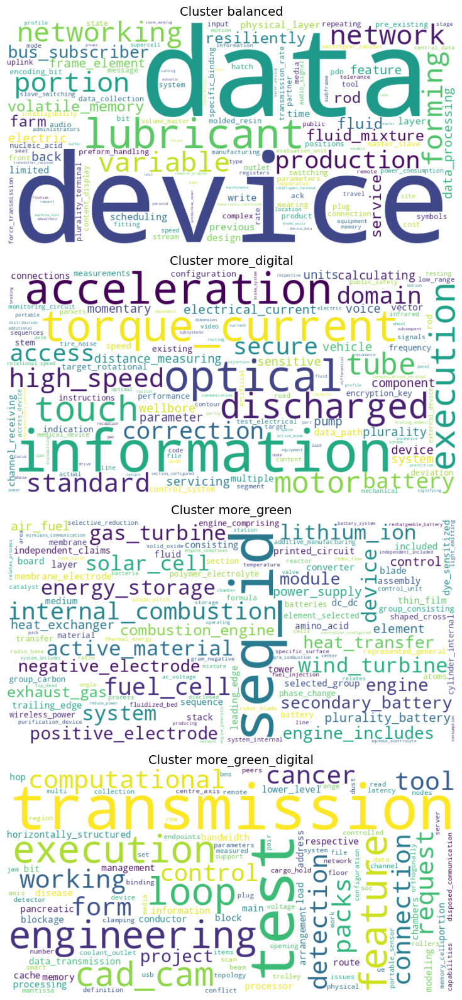

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import math

topics = list(top_n_words_mpnet_gd.keys())
num_topics = len(topics)

fig, axes = plt.subplots(num_topics, 1, figsize=(8, num_topics * 4))  # 1 column layout
if num_topics == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one subplot

for i, topic in enumerate(topics):
    words_only = [word for word, _ in top_n_words_mpnet_gd[topic]]  # Extract words

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(words_only))

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Cluster {topic}", fontsize=14)

plt.tight_layout()
plt.show()




##new

In [ ]:
top_n_words_mpnet_g

{'balanced': [('data_collection system', 0.0030322173385112046),
  ('data_processing device', 0.002659059270980115),
  ('molded_resin product', 0.002659059270980115),
  ('volatile_memory volatile_memory', 0.002275035784279534),
  ('plurality_terminal devices', 0.002275035784279534),
  ('content_display devices', 0.002275035784279534),
  ('encoding_bit rate', 0.002275035784279534),
  ('bus_subscriber bus_subscriber', 0.002275035784279534),
  ('preform_handling tool', 0.002275035784279534),
  ('intelligent_terminal device', 0.002275035784279534),
  ('power module', 0.0021225461245411212),
  ('control surface', 0.001918598081123311),
  ('input cost', 0.0018779466214056426),
  ('farm networking', 0.0018779466214056426),
  ('memory supercell', 0.0018779466214056426),
  ('back portion', 0.0018779466214056426),
  ('repeating audio', 0.0018779466214056426),
  ('forming portion', 0.0018779466214056426),
  ('variable frame_element', 0.0018779466214056426),
  ('uplink message', 0.0018779466214056

In [ ]:
top_n_words_mpnet_d

{'balanced': [('wireless_communication unit', 0.0035662940312611567),
  ('fluid_dispensing system', 0.0031912438614651933),
  ('injection_molding machine', 0.0031912438614651933),
  ('fastening_element carrier_component', 0.0031912438614651933),
  ('transmit_spatial streams', 0.0031912438614651933),
  ('mobile_communication network', 0.002952558888130099),
  ('regulating_nuclear reactor', 0.0027303618465487033),
  ('spraying_control points', 0.0027303618465487033),
  ('measurement_triggering event', 0.0027303618465487033),
  ('optical data', 0.0026593698845543278),
  ('target system', 0.0026593698845543278),
  ('antibody interest', 0.0022537991887300332),
  ('side panels', 0.0022537991887300332),
  ('organic_light emitting_device', 0.0022537991887300332),
  ('discovery window', 0.0022537991887300332),
  ('line_segment edge', 0.0022537991887300332),
  ('pole conduits', 0.0022537991887300332),
  ('planet gear', 0.0022537991887300332),
  ('code signal', 0.0022537991887300332),
  ('scrambl

In [ ]:
top_n_words_mpnet_gd

{'balanced': [('apparatus_methods relate_determining', 0.0012816047535442162),
  ('data_read periods', 0.0011442931998872632),
  ('test_item table_file', 0.0011442931998872632),
  ('voltage_offset block', 0.0011442931998872632),
  ('power_delivery network', 0.0011442931998872632),
  ('internal_storage space', 0.0010034714211395194),
  ('grid device', 0.0010034714211395194),
  ('ground_side coil', 0.0010034714211395194),
  ('hard_disk drives', 0.0010034714211395194),
  ('meter device', 0.0010025895974607561),
  ('electrical system', 0.0009815873436533058),
  ('transmission power', 0.0009438982240719341),
  ('control input', 0.0009438982240719341),
  ('unmanned_aerial vehicle', 0.0008836455846545376),
  ('meter data', 0.0008593625121092195),
  ('data_read period', 0.0008585492683481132),
  ('optical_waveguide sheet', 0.0008585492683481132),
  ('workpiece_image data', 0.0008585492683481132),
  ('magnetic_field vector_strength', 0.0008585492683481132),
  ('greenhouse_internal environment',

In [ ]:
def common_words_per_topic(dict1, dict2, dict3):
    common_words_dict = {}

    # Find topic labels common to all three dictionaries
    common_labels = set(dict1.keys()) & set(dict2.keys()) & set(dict3.keys())

    for label in common_labels:
        words1 = set(word for word, score in dict1[label])
        words2 = set(word for word, score in dict2[label])
        words3 = set(word for word, score in dict3[label])

        common = words1 & words2 & words3
        common_words_dict[label] = common

    return common_words_dict

# Usage example:
common_words = common_words_per_topic(top_n_words_mpnet_g, top_n_words_mpnet_d, top_n_words_mpnet_gd)

for label, words in common_words.items():
    print(f"Topic {label}: {words}")



Topic more_green_digital: set()
Topic balanced: set()
Topic more_digital: {'device user'}
Topic more_green: {'internal_combustion engine'}


In [ ]:
common_labels

NameError: name 'common_labels' is not defined

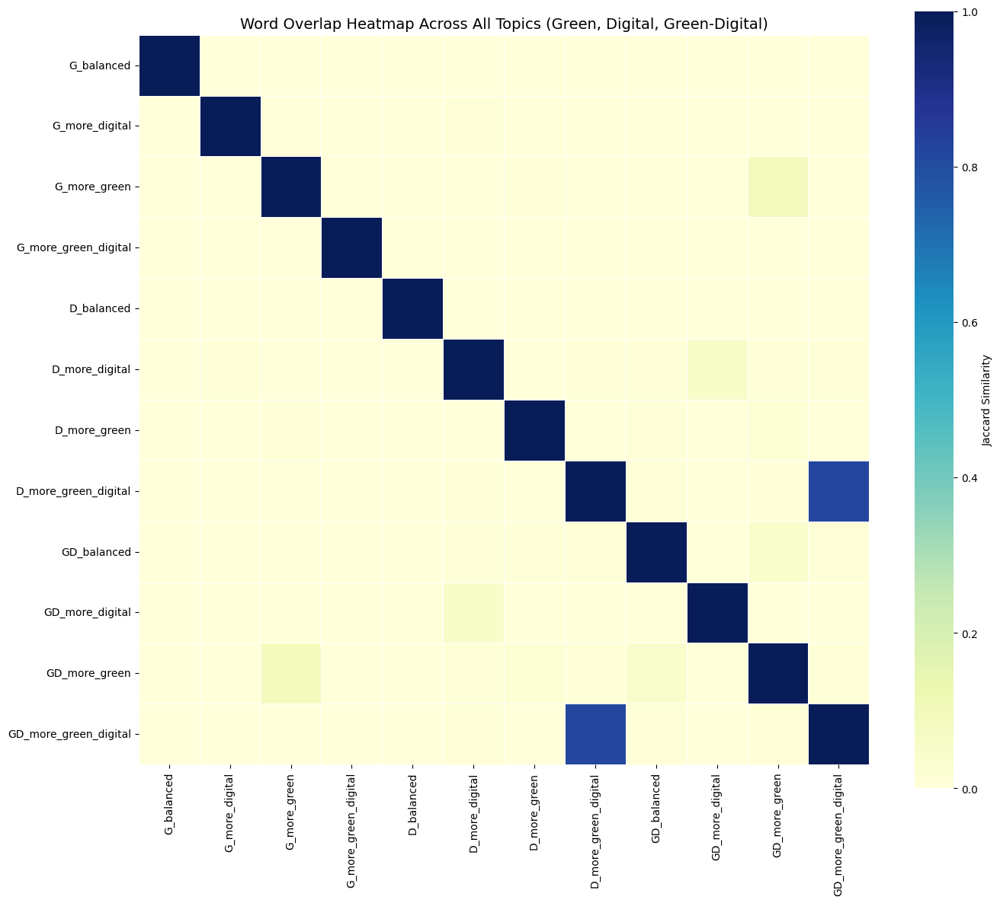

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# ---- STEP 1: Extract top-N word sets per topic ----

def extract_word_sets(topic_dict, n=50):
    return {topic: set([word for word, _ in word_list[:n]]) for topic, word_list in topic_dict.items()}

# Replace these with your actual dictionaries
green_words = extract_word_sets(top_n_words_mpnet_g, n=50)
digital_words = extract_word_sets(top_n_words_mpnet_d, n=50)
gd_words = extract_word_sets(top_n_words_mpnet_gd, n=50)

# ---- STEP 2: Combine all topic groups into one dict ----

all_topic_sets = {}

for i, words in green_words.items():
    all_topic_sets[f"G_{i}"] = words

for i, words in digital_words.items():
    all_topic_sets[f"D_{i}"] = words

for i, words in gd_words.items():
    all_topic_sets[f"GD_{i}"] = words

# ---- STEP 3: Compute Jaccard similarity matrix ----

def jaccard_similarity(set1, set2):
    return len(set1 & set2) / len(set1 | set2) if set1 | set2 else 0.0

labels = list(all_topic_sets.keys())
n_topics = len(labels)
jac_matrix = np.zeros((n_topics, n_topics))

for i in range(n_topics):
    for j in range(n_topics):
        set_i = all_topic_sets[labels[i]]
        set_j = all_topic_sets[labels[j]]
        jac_matrix[i, j] = jaccard_similarity(set_i, set_j)

jac_df = pd.DataFrame(jac_matrix, index=labels, columns=labels)

# ---- STEP 4: Plot the heatmap ----

plt.figure(figsize=(14, 12))
sns.heatmap(jac_df, cmap="YlGnBu", annot=False, fmt=".2f", square=True,
            cbar_kws={"label": "Jaccard Similarity"}, linewidths=0.5)
plt.title("Word Overlap Heatmap Across All Topics (Green, Digital, Green-Digital)", fontsize=14)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [ ]:
jac_df

,G_balanced,G_more_digital,G_more_green,G_more_green_digital,D_balanced,D_more_digital,D_more_green,D_more_green_digital,GD_balanced,GD_more_digital,GD_more_green,GD_more_green_digital
G_balanced,1.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
G_more_digital,0.0,1.000000,0.000000,0.0,0.0,0.010101,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
G_more_green,0.0,0.000000,1.000000,0.0,0.0,0.000000,0.010101,0.000000,0.000000,0.000000,0.086957,0.000000
G_more_green_digital,0.0,0.000000,0.000000,1.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
D_balanced,0.0,0.000000,0.000000,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
D_more_digital,0.0,0.010101,0.000000,0.0,0.0,1.000000,0.000000,0.010101,0.010101,0.052632,0.010101,0.010101
D_more_green,0.0,0.000000,0.010101,0.0,0.0,0.000000,1.000000,0.000000,0.010101,0.000000,0.020408,0.000000
D_more_green_digital,0.0,0.000000,0.000000,0.0,0.0,0.010101,0.000000,1.000000,0.010101,0.000000,0.010101,0.818182
GD_balanced,0.0,0.000000,0.000000,0.0,0.0,0.010101,0.010101,0.010101,1.000000,0.000000,0.041667,0.010101
GD_more_digital,0.0,0.000000,0.000000,0.0,0.0,0.052632,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
